In [1]:
import pandas as pd
import numpy as np
import collections
#import geopandas
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import collections
import csv
import json

In [2]:
Roman_df = pd.read_excel (r'FULL_PAS_DATA_ROMAN_CLEAN.xlsm', sheet_name = 'FULL_PAS_DATA_ROMAN')

In [3]:
Roman_df["projection_x"] = np.nan
Roman_df["projection_y"] = np.nan
Roman_df["calc_length"] = np.nan
Roman_df["calc_width"] = np.nan
Roman_df["calc_weight"] = np.nan
Roman_df["calc_thickness"] = np.nan
Roman_df["calc_numdate1"] = np.nan
Roman_df["calc_numdate2"] = np.nan
Roman_df["calc_dateBucket"] = np.nan
Roman_df["calc_fourFigureLat"] = np.nan
Roman_df["calc_fourFigureLat_zoom"] = np.nan
Roman_df["calc_fourFigureLon"] = np.nan
Roman_df["calc_fourFigureLon_zoom"] = np.nan
Roman_df["calc_broadDateBucket"] = np.nan

In [4]:
IronAge_df = pd.read_excel(r'FULL_PAS_DATA_IRON_CLEAN.xlsm', sheet_name = 'FULL_PAS_DATA_IRON_CLEAN')

In [5]:
columns_to_keep = ["id",
"old_findID",
"uniqueID",
"objecttype",
"classification",
"subclass",
"length",
"height",
"width",
"weight",
"thickness",
"diameter",
"quantity",
"otherRef",
"curr_loc",
"discoveryMethod",
"treasureID",
"broadperiod",
"numdate1",
"numdate2",
"description",
"notes",
"reuse",
"reusePeriodID",
"created",
"updated",
"secwfstage",
"findofnote",
"objecttypecert",
"datefound1",
"datefound2",
"inscription",
"museumAccession",
"subsequentAction",
"objectCertainty",
"dateFromCertainty",
"dateToCertainty",
"dateFoundFromCertainty",
"dateFoundToCertainty",
"subPeriodFrom",
"subPeriodTo",
"objdate1period",
"objdate2period",
"secuid",
"material1",
"material2",
"manmethod",
"decmethod",
"decstyle",
"complete",
"surface",
"manufactureID",
"culture",
"recorderID",
"identifier1ID",
"identifier2ID",
"smrRef",
"createdBy",
"updatedBy",
"hoardcontainer",
"institution",
"reason",
"fullname",
"primaryMaterial",
"primaryBMmaterial",
"secondaryMaterial",
"secondaryBMmaterial",
"decoration",
"style",
"manufacture",
"surfaceTreatment",
"completeness",
"preservation",
"periodFrom",
"seneschalPeriodFrom",
"bmPeriodFrom",
"periodoPeriodFrom",
"periodTo",
"seneschalPeriodTo",
"bmPeriodTo",
"periodoPeriodTo",
"reusePeriod",
"ascribedCulture",
#"culturePeriodo", only possible values are [nan 'p08m57hqxg6' 'p08m57hcbrw']
#"cultureBM", only possible values are [nan 'x41012' 'x41145']
"discmethod",
"identifier",
"secondaryIdentifier",
"recorder",
"fromCirca",
"toCirca",
"findSpotID",
"countyID",
"districtID",
"regionID",
"knownas",
"gridlen",
"accuracy",
"source",
"coinID",
"obverseDescription",
"obverseInscription",
"reverseDescription",
"reverseInscription",
#"cciNumber", 100% Null
"denominationID",
"degreeOfWear",
"allenType",
#"vaType", 100% Null
#"mackType", 100% Null
#"abcType", 100% Null
#"bmcType", 100% Null
"reeceID",
"dieAxis",
"moneyer",
"revtypeID",
"categoryID",
"typeID",
"tribeID",
"statusID",
"rulerQualifier",
"denominationQualifier",
"mintQualifier",
"dieAxisCertainty",
"initialMark",
"reverseMintMark",
"statusQualifier",
"ruler1",
#"ruler2", only possible values are [nan  0.]
"mintID",
"rrcID",
"ricID",
"tribe",
"ironAgeRegion",
"ironAgeArea",
"denomination",
"nomismaDenomination",
#"dbpediaDenomination", 100% Null
#"bmDenomination", 100% Null
"primaryRuler",
"viaf",
"rulerDbpedia",
"nomismaRulerID",
#"secondaryRuler", 100% Null
"periodName",
"dateRange",
"mintName",
"nomismaMintID",
"pleiadesID",
"mintGeonamesID",
"mintWoeid",
"mintOsID",
"mintGettyID",
"mintWoeID",
"mintDbPediaID",
"mintWhat3Words",
"mintBritMuseumID",
"wear",
"nomismaWear",
"dieAxisName",
"category",
"type",
"moneyerID",
"nomismaMoneyer",
"emperorID",
"romanMintID",
"reverseType",
"status",
#"jettonClass", 100% Null
#"jettonType", 100% Null
#"jettonGroup", 100% Null
"thumbnail",
"filename",
"filesize",
"imageLabel",
"imageCopyrightHolder",
#"imageLicense", only possible values are [nan 'Attribution-ShareAlike License' 'Attribution License']
"imagedir",
"region",
"rallyID",
"rallyName",
"rallyDateFrom",
"rallyDateTo",
"landuse",
"landvalue",
#"regionType", only possible values are ['European Region' nan]
"countyType",
"county",
"districtType",
"district",
"parishType",
"subsequentActionTerm",
#"bmThesObject", only possible values are [6089.   nan 5104.]
"seneschalObject",
"parishID",
"fourFigure",
"map25k",
"map10k",
"fourFigureLat",
"fourFigureLon",
"woeid",
#"geonamesID", only possible values are [nan 'Not Found']
#"what3words", useless information
#"centreLat", redundant information
#"centreLon", redundant information
"parish",
"URL Page",
"projection_x",
"projection_y",
"calc_length",
"calc_width",
"calc_weight",
"calc_thickness",
"calc_numdate1",
"calc_numdate2",
"calc_dateBucket",
"calc_fourFigureLat",
"calc_fourFigureLat_zoom",
"calc_fourFigureLon",
"calc_fourFigureLon_zoom",
"calc_broadDateBucket"]

In [6]:
Roman_data = pd.DataFrame(Roman_df, columns = columns_to_keep)
Roman_data = Roman_data.replace("Not Found", np.nan)
Iron_data = pd.DataFrame(IronAge_df, columns = columns_to_keep)
Iron_data = Iron_data.replace("Not Found", np.nan)

In [17]:
print(len(Roman_data[Roman_data['objecttype']=='BROOCH']))
print(len(Roman_data))

27176
334855


In [18]:
print(len(Iron_data[Iron_data['objecttype']=='BROOCH']))
print(len(Iron_data))

3091
50174


In [8]:
# Which objects exist in each dataset?
Iron_objecttypes = np.sort(Iron_data.objecttype.unique())
print(Iron_objecttypes)

['AMPHORA' 'AMULET' 'ANIMAL BONE' 'ANIMAL REMAINS'
 'ARCHITECTURAL FRAGMENT' 'ARMLET' 'ARROWHEAD' 'ASSEMBLAGE' 'AWL' 'AXE'
 'AXEHEAD' 'AXLE CAP' 'BALDRIC' 'BEAD' 'BEEHIVE QUERN' 'BELT' 'BELT SLIDE'
 'BLADE' 'BLOOM' 'BOW BROOCH' 'BOWL' 'BOX' 'BRACELET' 'BRACKET' 'BRICK'
 'BRIDLE BIT' 'BRIDLE FITTING' 'BRIQUETAGE' 'BROOCH' 'BROOCH PIN' 'BUCKET'
 'BUCKLE' 'BURNT FLINT' 'BUTTON' 'BUTTON AND LOOP FASTENER'
 'BUTTON-LOOP FASTENER' 'CART FITTING' 'CASTING WASTE' 'CAULDRON'
 'CELTIC HEAD' 'CHAPE' 'CHARIOT FITTING' 'CHISEL' 'CLIP'
 'CLOTHING FASTENING' 'COIN' 'COIN BLANK' 'COIN DIE' 'COIN HOARD'
 'COIN MOULD' 'COMB' 'CONTAINER' 'COOKING VESSEL' 'COSMETIC MORTAR'
 'COSMETIC PESTLE' 'COSMETIC SET' 'CUP' 'DAGGER' 'DEBITAGE' 'DENTICULATE'
 'DISC' 'DISH' 'DRESS AND PERSONAL ACCESSORIES' 'DRESS FASTENER (DRESS)'
 'DRESS FASTENER (UNKNOWN)' 'DRINKING HORN' 'EAR RING' 'END SCRAPER'
 'FASTENING' 'FERRULE' 'FIGURINE' 'FINGER RING' 'FITTING'
 'FIXTURES AND FITTINGS' 'FLAKE' 'FOB' 'FOLDING KNIFE'
 'FOOD AN

In [9]:
Roman_objecttypes = np.sort(Roman_data.objecttype.unique())
print(Roman_objecttypes)

['ADZE' 'ADZE HAMMER' 'ALTAR' 'AMPHORA' 'AMULET' 'ANIMAL REMAINS' 'ANVIL'
 'AQUAMANILE' 'ARCHITECTURAL' 'ARCHITECTURAL ELEMENT'
 'ARCHITECTURAL FRAGMENT' 'ARM BAND' 'ARM PURSE' 'ARMLET' 'ARMOUR'
 'ARMOUR AND WEAPONS' 'ARROWHEAD' 'ASSEMBLAGE' 'AUGER' 'AWL' 'AXE'
 'AXEHEAD' 'BAG' 'BALANCE' 'BALLISTA BALL' 'BALLISTA BOLT' 'BASKET' 'BEAD'
 'BEAKER' 'BELL' 'BELT' 'BELT PLATE' 'BELT SLIDE' 'BILL HOOK' 'BLADE'
 'BOARD' 'BOLT (FASTENING)' 'BOLT (LOCK)' 'BOLTHEAD' 'BONE' 'BOTTLE'
 'BOW (WEAPON)' 'BOW BROOCH' 'BOWL' 'BOX' 'BOX FITTING' 'BRACELET'
 'BRACKET' 'BRICK' 'BRIDLE BIT' 'BRIDLE FITTING' 'BRIQUETAGE' 'BROCKAGE'
 'BROOCH' 'BROOCH PIN' 'BUCKET' 'BUCKLE' 'BUILDING MATERIAL' 'BUNG'
 'BURNISHER' 'BUST' 'BUTTON' 'BUTTON AND LOOP FASTENER' 'CALENDAR' 'CAMEO'
 'CANDLE HOLDER' 'CANDLE STAND' 'CANDLESTICK' 'CART FITTING'
 'CARVED STONE' 'CASKET' 'CASTING WASTE' 'CAULDRON' 'CERAMIC'
 'CERAMIC BUILDING MATERIAL' 'CHAIN' 'CHAIR' 'CHATELAINE' 'CHEST' 'CHISEL'
 'CHOPPING BLOCK' 'CLAMP' 'CLASP' 'CLEAT' '

In [10]:
# e.g. ('objecttype', [...], ("Iron", Iron_data), ("Roman", Roman_data))
def comparative_count(column, values, data_1_tuple, data_2_tuple):
    d1_label, d1 = data_1_tuple
    d2_label, d2 = data_2_tuple
    
    d1_CNT = collections.Counter()
    d2_CNT = collections.Counter()
    
    print("Checking " + str(d1_label) + "...")
    # should usally be checking Iron_data
    for index, row in d1.iterrows(): 
        x = row[column]
        if x in values:
            d1_CNT[x]+=1
        
    print("Checking " + str(d2_label) + "...")
    # should usally be checking Roman_data
    for index, row in d2.iterrows():
        x = row[column]
        if x in values:
            d2_CNT[x] += 1
            
    
    print("Outputting...")
    # organize the results into a dictionary
    dct = {}
    for item in values:
        output = {str(d1_label): d1_CNT[item], str(d2_label): d2_CNT[item], "dif": d2_CNT[item] - d1_CNT[item],"ratio": d2_CNT[item] / d1_CNT[item], "total_records": d2_CNT[item] + d1_CNT[item]}
        dct[str(item)] = output
        print(str(item) + "," + str(d1_CNT[item]) + "," + str(d2_CNT[item]) + "," + str(output['dif']) + "," + str(output['ratio']) + "," + str(output['total_records']))
    return(dct)
    

In [11]:
def count(column, values, data):
    CNT = collections.Counter()
    for index, row in data.iterrows():
        x = row[column]
        if x in values:
            CNT[x] += 1
    return(CNT)

In [12]:
objects_in_iron = []
objects_in_roman = []
objects_in_both = []

objects_only_in_iron = []
objects_only_in_roman = []

for item in Iron_objecttypes:
    objects_in_iron.append(item)
for item in Roman_objecttypes:
    objects_in_roman.append(item)
for item in objects_in_iron:
    if item in objects_in_roman:
        objects_in_both.append(item)
    else:
        objects_only_in_iron.append(item)
for item in objects_in_roman:
    if item not in objects_in_iron:
        objects_only_in_roman.append(item)
#print(objects_in_iron)
#print(objects_in_roman)
#print(objects_in_both)

In [15]:
# e.g. ('objecttype', [...], ("Iron", Iron_data), ("Roman", Roman_data))
cross_check = comparative_count('objecttype', objects_in_both, ("Iron", Iron_data), ("Roman", Roman_data))

Checking Iron...
Checking Roman...
Outputting...
AMPHORA,1,57,56,57.0,58
AMULET,3,40,37,13.333333333333334,43
ANIMAL REMAINS,3,22,19,7.333333333333333,25
ARCHITECTURAL FRAGMENT,1,39,38,39.0,40
ARMLET,2,32,30,16.0,34
ARROWHEAD,6,3,-3,0.5,9
ASSEMBLAGE,3,5,2,1.6666666666666667,8
AWL,6,43,37,7.166666666666667,49
AXE,6,16,10,2.6666666666666665,22
AXEHEAD,8,5,-3,0.625,13
BEAD,147,441,294,3.0,588
BELT,1,63,62,63.0,64
BELT SLIDE,1,1,0,1.0,2
BLADE,2,9,7,4.5,11
BOW BROOCH,278,2113,1835,7.600719424460432,2391
BOWL,1,115,114,115.0,116
BOX,5,79,74,15.8,84
BRACELET,77,2135,2058,27.727272727272727,2212
BRACKET,2,2,0,1.0,4
BRICK,2,41,39,20.5,43
BRIDLE BIT,45,12,-33,0.26666666666666666,57
BRIDLE FITTING,10,3,-7,0.3,13
BRIQUETAGE,1,9,8,9.0,10
BROOCH,3091,27176,24085,8.791976706567453,30267
BROOCH PIN,2,27,25,13.5,29
BUCKET,22,31,9,1.4090909090909092,53
BUCKLE,1,664,663,664.0,665
BUTTON,6,14,8,2.3333333333333335,20
BUTTON AND LOOP FASTENER,126,463,337,3.6746031746031744,589
CART FITTING,2,24,22,12.0,26
C

In [13]:
#-------------------------------------------- BROOCH CONTINUATION ------------------------------------------
Roman_brooches = Roman_data.loc[Roman_data['objecttype'].isin(["BROOCH", "BOW BROOCH", "PLATE BROOCH", "PENANNULAR BROOCH"])]

In [14]:
print(Roman_brooches)

            id   old_findID           uniqueID  objecttype  \
2       961768  WMID-354816  PAS5D2354810015EB      BROOCH   
57      961385  KENT-DE0228  PAS5D1DE022001862      BROOCH   
78      961264   NMS-CBFCBA  PAS5D1CBFCB001A84      BROOCH   
127     960925  NARC-B30483  PAS5D1B3048001300      BROOCH   
132     960830  WREX-A2395C  PAS5D1A2395001CA9      BROOCH   
135     960810   NMS-A18F95  PAS5D1A18F90015A1      BROOCH   
192     960598   WAW-9D0009  PAS5D19D000001941      BROOCH   
197     960586   WAW-9CC0BB  PAS5D19CC0B001B62      BROOCH   
201     960577   WAW-9C7A44  PAS5D19C7A4001449      BROOCH   
215     960464   SUR-5F081D  PAS5D15F081001DC4      BROOCH   
218     960449   IOW-5DBED7  PAS5D15DBED001701      BROOCH   
222     960442   NMS-5D3435  PAS5D15D3430014E8      BROOCH   
242     960259  KENT-37DCDB  PAS5D137DCD001C2A      BROOCH   
292     960091  NARC-23A256  PAS5D123A2500161B      BROOCH   
295     960067  NARC-231724  PAS5D123172001450      BROOCH   
304     

In [15]:
thumbnail_codes = {}
#with open("Grey_Thumbnails/NEW_sorted_brooch_projections.json") as json_file:
with open("Grey_Thumbnails/PCA_TSNE_Combined_Projection_Cleaned_Photos1.json") as json_file:
    data = json.load(json_file)
    for item in data:
        loc = item["image"].find("BROOCH_")
        thumbnail_code = item["image"][loc + 7:-4]
        x_coord = item["x"]
        y_coord = item["y"]
        thumbnail_codes[thumbnail_code] = {"x": x_coord, "y": y_coord}
json_file.close()

In [16]:
def get_thumbnail_code(row):
    tn = row["thumbnail"]
    if not np.isnan(tn):
        try:
            coords = thumbnail_codes[str(int(tn))]
            return ("found", coords)
        except:
            return ("not_found", "")
    else:
        return ("nan", "")
    
        

In [17]:
i = 0
nans = 0
found = 0
not_found = 0
output_list_x = []
output_list_y = []
for index, row in Roman_brooches.iterrows():
    i+=1
   # if i > 5:
     #   break
    lookup = get_thumbnail_code(row)
    if lookup[0] == "found":
        found+=1
        output_list_x.append(lookup[1]["x"])
        output_list_y.append(lookup[1]["y"])
    elif lookup[0] == "nan":
        nans+=1
        output_list_x.append(np.nan)
        output_list_y.append(np.nan)
    elif lookup[0] == "not_found":
        not_found+=1
        output_list_x.append(np.nan)
        output_list_y.append(np.nan)
Roman_brooches["projection_x"] = output_list_x
Roman_brooches["projection_y"] = output_list_y
print("Total rows checked: " + str(i))
print("Found: " + str(found) + "  Not Found: " + str(not_found) + "  NaN: " + str(nans))
    
        

Total rows checked: 29751
Found: 22865  Not Found: 3071  NaN: 3815


//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


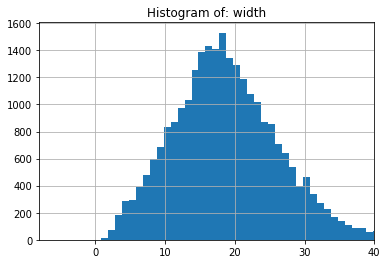

[1.200e+01 7.400e+01 1.860e+02 2.890e+02 2.960e+02 3.880e+02 4.800e+02
 5.940e+02 6.850e+02 8.320e+02 8.680e+02 9.720e+02 1.036e+03 1.258e+03
 1.387e+03 1.431e+03 1.409e+03 1.530e+03 1.344e+03 1.290e+03 1.185e+03
 1.076e+03 1.018e+03 8.730e+02 8.570e+02 7.050e+02 6.380e+02 5.370e+02
 3.950e+02 4.640e+02 3.350e+02 2.720e+02 2.310e+02 1.650e+02 1.370e+02
 1.130e+02 8.700e+01 8.700e+01 5.600e+01 6.600e+01 5.300e+01 3.800e+01
 4.100e+01 2.100e+01 3.500e+01 2.600e+01 2.300e+01 1.400e+01 1.300e+01
 1.200e+01 9.000e+00 3.000e+00 6.000e+00 5.000e+00 8.000e+00 6.000e+00
 4.000e+00 3.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+00 0.000e+00
 1.000e+00 4.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 2.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 0.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00
 0.000

In [81]:
to_test = "width"
#test_me = []
#for index, row in Roman_brooches.iterrows():
#    test_me.append(abs(row["numdate2"] - row["numdate1"]))
# Note: Uk roughly bounded by latitude 48-59, longitude (-10) to (2)
# ---------------------
test_me = Roman_brooches[to_test]
binwidth = 1
n, bins, patches = plt.hist(test_me, bins=np.arange(min(test_me), max(test_me) + binwidth, binwidth))
plt.xlim(xmin=-8, xmax = 40)
plt.grid(True)
plt.title('Histogram of: ' + str(to_test))
plt.show()
print(n)

In [20]:
# Determine which categories to use for the following variables
coloring_buckets = {}

# objecttype (because some have been hard-coded as bow/plate/penannular)
coloring_buckets["objecttype"] = [np.nan, 'BROOCH', 'PLATE BROOCH', 'BOW BROOCH'] #'PENANNULAR BROOCH'] #CHECKED

# classification --> 2896 uniques
# subclass --> 2278 uniques

# length
# Ten buckets from 1 to 100+, make NaNs white
coloring_buckets["length"] = [np.nan, (1,9), (10,19), (20, 29), (30, 39), (40, 49), (50, 59), (60, 69), (70,79), (80,89), (90,99), (100,10000)]

# width
# Six buckets from 1 to 60+, make NaNs white
coloring_buckets["width"] = [np.nan, (1,9), (10,19), (20, 29), (30, 39), (40, 49), (50, 59), (60, 69), (70,10000)]

# weight
# Ten buckets from 1 to 30, another for 31+, and make NaNs white
coloring_buckets["weight"] = [np.nan, (1,3), (4,6), (7,9), (10,12), (13,15), (16,18), (19,21), (22,24), (25,27),(28,30),(31,10000)]

# thickness
# Ten buckets from 1 to 30, another for 31+, and make NaNs white
coloring_buckets["thickness"] = [np.nan, (1,3), (4,6), (7,9), (10,12), (13,15), (16,18), (19,21), (22,24), (25,27),(28,30),(31,10000)]

# numdate1
 # Ten buckets from 0 to 100, plus 101-150, 151-200, 201-300, 301-400, 401+ (15 buckets total), everything else white
coloring_buckets["numdate1"] = [np.nan, (0,9), (10,19), (20, 29), (30, 39), (40, 49), (50, 59), (60, 69), (70,79), (80,89), (90,99), (100,109), (110,150),(151,200),(201,300),(301,400),(401,10000)]

# numdate2
# Ten buckets from 0 to 100, plus 101-150, 151-200, 201-300, 301-400, 401+ (15 buckets total), everything else white
# NOTE: will likely need to refine this if I see any initial clustering
coloring_buckets["numdate2"] = [np.nan, (0,9), (10,19), (20, 29), (30, 39), (40, 49), (50, 59), (60, 69), (70,79), (80,89), (90,99), (100,109), (110,150),(151,200),(201,300),(301,400),(401,10000)]

# CALCULATE: color items that DEFINITELY fit within a date bucket
# <0, 0-42, 43-86, 87-150, 151-300, 301+, any non-fitters are white
coloring_buckets["dateBucket"] = [np.nan,(0,42),(43,86),(87,150),(151,300),(301,10000)]
coloring_buckets["broadDateBucket"] = [np.nan,(0,42),(43,150),(151,300),(301,10000)]

# material1
coloring_buckets["material1"] = [np.nan, 7.0, 53.0, 8.0, 22.0, 9.0, 18.0, 25.0, 23.0, 33.0, 41.0, 48.0,  5.0, 19.0, 31.0]

# material2
coloring_buckets["material2"] = [np.nan, 41., 8.,  7., 18., 23., 22., 27., 33., 15., 30., 25., 51.,  5., 31.,  9., 50., 17., 42., 35., 0.]

# manmethod
coloring_buckets["manmethod"] = [np.nan,  1.,  2.,  8.,  4., 12.,  6.,  9.,  3.,  7., 11., 10.,  5.]

# decmethod
coloring_buckets["decmethod"] = [np.nan,  2.,  1.,  8., 3.,  4.,  9., 13.,  7.,  5.,  6.]

# decstyle
coloring_buckets["decstyle"] = [np.nan,  4.,  1.,  7.,  2.,  9.,  5.,  3.,  8., 10., 11.]

# surface
coloring_buckets["surface"] = [np.nan,  6.,  2., 17.,  4.,  1., 15., 16., 11.,  9., 18.,  7., 12.]

# primaryMaterial
coloring_buckets["primaryMaterial"] = [np.nan,'Copper alloy', 'Copper', 'Iron', 'Silver', 'Lead', 'Glass', 'Lead Alloy','Gold', 'Tin or tin alloy', 'Enamel', 'Ceramic', 'Earthenware', 'Base Silver']

# secondaryMaterial
coloring_buckets["secondaryMaterial"] = [np.nan,'Enamel','Iron', 'Copper alloy', 'Glass', 'Gold', 'Silver', 'White metal','Tin or tin alloy', 'Animal skeletal material', 'Gem', 'Lead Alloy', 'Other','Ceramic', 'Base Silver', 'Lead', 'Yellow metal', 'Textile', 'Paste or frit','Pottery']

# decoration
coloring_buckets["decoration"] = [np.nan, 'Stamped', 'Incised', 'Openwork', 'Multiple', 'Engraved', 'Repousse','Pointille', 'Embossed', 'Impressed', 'Drilled']
# NOTE: WOULD BE BAD IF THIS DID NOT CLUSTER --> CHECKED!

# style
coloring_buckets["style"] = [np.nan, 'Linear', 'Geometric', 'Figurative', 'Zoomorphic', 'Curvilinear', 'Floral','Other', 'Openwork', 'Leaf', 'Interlace']
# NOTE: WOULD BE BAD IF THIS DID NOT CLUSTER --> CHECKED!

# surfaceTreatment -- CHECKED!
coloring_buckets["surfaceTreatment"] = [np.nan, 'Multiple', 'Inlaid with enamel', 'Incised or engraved or chased','White metal coated', 'Gilded', 'Black coated', 'Stamped','Inlaid with other or unknown', 'Inlaid with niello', 'Inlaid with metal','Painted']

# findSpotID --> 29516 uniques --> only useful if grouped
# districtID --> 282 uniques --> only useful if grouped
# countyID --> 113 uniques --> only useful if grouped

# regionID (REDUNDANT)
#coloring_buckets["regionID"] = [np.nan, 41426., 41421., 41423., 41430., 41425., 41427., 41424., 41431., 41428., 41422.]

# region -- CHECKED!
coloring_buckets["region"] = [np.nan, 'West Midlands', 'South East', 'East Midlands','Yorkshire and the Humber', 'Eastern', 'South West', 'Wales', 'North West','London', 'North East']

# landuse
coloring_buckets["landuse"] = [np.nan, 'Character undetermined', 'Operations to a depth greater than 0.25m',
 'Garden', 'Running water', 'Minimal cultivation', 'Regularly improved',
 'Disturbed', 'Operations to a depth less than 0.25 m', 'Unknown', 'Mixed',
 'Waste ground', 'Inter-tidal', 'Undisturbed grassland', 'Heathland',
 'Cliff and related features', 'Other', 'Built over', 'Undetermined',
 'Recreational usage', 'Scrub', 'Deciduous native', 'Allotment',
 'Standing water', 'Mineral extraction',
 'Land dedicated to the display of a monument', 'Parkland', 'Orchard',
 'Churchyard', 'Coniferous plantation', 'Thoroughfare', 'Above high water',
 'Subterranean']

# landvalue -- CHECKED!
coloring_buckets["landvalue"] = [np.nan,'Cultivated land','Other', 'Open fresh water', 'Grassland, Heathland', 'Woodland', 'Wetlands', 'Coastland']

# countyType
coloring_buckets["countyType"] = [np.nan, 'County', 'Unitary Authority', 'Metropolitan District','Greater London Authority']

# county (113 options)

# districtType
coloring_buckets["districtType"] = [np.nan, 'District', 'Unitary Authority', 'Metropolitan District','London Borough']

# district (282 uniques)

# parishType
coloring_buckets["parishType"] = [np.nan, 'Civil Parish', 'Community', 'District Ward','London Borough Ward','Metropolitan District Ward', 'Unitary Authority Ward']

# parishID ---> 3117 uniques
# parish ---> 2971 uniques

# fourFigureLat
# 50-56+, with bucket size 1
coloring_buckets["fourFigureLat"] = [np.nan, (49,50),(50.0001,51),(51.0001,52),(52.0001,53),(53.0001,54),(54.0001,55),(55.0001,56),(56,100)]
# 50-56+, with bucket size 0.5
coloring_buckets["fourFigureLat_zoom"] = []

# fourFigureLon
# -6 to 2+, with bucket size 1
coloring_buckets["fourFigureLon"] = [np.nan,(-6,-5),(-4.9999,-4),(-3.9999,-3),(-2.9999,-2),(-1.9999,-1),(-0.9999,0),(0.0001,1),(1.0001,2),(2.0001,100)]
# -6 to 2+, with bucket size -.5
coloring_buckets["fourFigureLon_zoom"] = []

In [21]:
def continuous_to_categorical(variable, bucket_list, row):
    #uniq = coloring_buckets[variable]
    if variable != "dateBucket" and variable != "broadDateBucket":
        check = row[variable]
        if np.isnan(check):
                return 0
        else:
            for index in range(1,len(bucket_list)):
                if check >= float(bucket_list[index][0]) and check <= float(bucket_list[index][1]):
                    return index
    elif variable == "dateBucket" or variable == "broadDateBucket":
        start = row["numdate1"]
        end = row["numdate2"]
        if not np.isnan(start) and not np.isnan(end):
            for index in range(1,len(bucket_list)):
                if (start >= float(bucket_list[index][0])) and (end <= float(bucket_list[index][1])):
                    #print(str(end) + " " + str(bucket_list[index][1]))
                    #print(str(end <= float(bucket_list[index][1])))
                    #print("Start: " + str(start) + " End: " + str(end) + " = " + str(bucket_list[index]))
                    return index
        else:
            return 0
    return 0
        

In [159]:
variables = ["length", "width", "weight", "thickness", "numdate1", "numdate2", "dateBucket","broadDateBucket", "fourFigureLat", "fourFigureLon"]
#variables = ["broadDateBucket"]
for V in variables:
    new_stem = "calc_" + V
    outlist = []
    for index, row in Roman_brooches.iterrows():
        outlist.append(continuous_to_categorical(V, coloring_buckets[V], row))
    Roman_brooches[new_stem] = outlist
    

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [170]:
#row = {"a": 10, "b": 3, "c":45, "d": np.nan}
#blist = [np.nan, (1,5), (6,12),(13,25),(26,1000)]
#print(continuous_to_categorical("a", blist, row))
print(Roman_brooches["calc_fourFigureLon"].unique())

[4 7 6 0 8 5 3 2 1]


In [22]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx

def categorical_cluster_check(variable, mode):
    #Scatter of Petal
    x=Roman_brooches['projection_x']
    y=Roman_brooches['projection_y']

    # Get unique names of species
    uniq = coloring_buckets[variable]

    # Set the color map to match the number of species
    z = range(1,len(uniq))
    hot = plt.get_cmap('hot')
    cNorm  = colors.Normalize(vmin=0, vmax=len(uniq))
    scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=hot)

    plt.figure(figsize=(20,10))
    saveas = "Trait_Clustering - " + str(variable) + ".jpg"

    # Plot each species
    for i in range(len(uniq)):
        if mode != "calc":
            indx = Roman_brooches[variable] == uniq[i]
        elif mode == "calc":
            indx = Roman_brooches[str("calc_" + variable)] == i
        plt.scatter(x[indx], y[indx], s=10, color=scalarMap.to_rgba(i), label=uniq[i])
    
    plt.xlabel('TSNE Component 1')
    plt.ylabel('TSNE Component 2')
    plt.title(variable.upper())
    plt.legend(loc='upper left')
    plt.savefig(saveas, bbox_inches="tight")
    plt.show()

In [171]:
Roman_brooches.to_excel("roman_brooches_only_cleaned_withCalcs.xlsx")

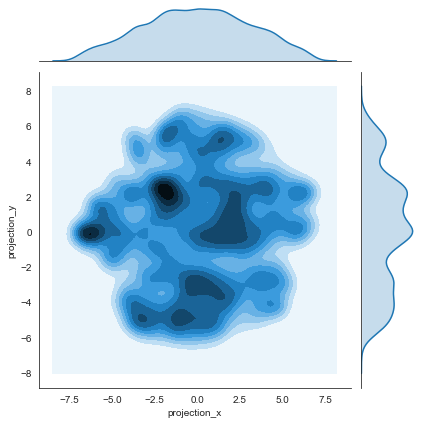

In [175]:
import seaborn as sns
#df = sns.load_dataset('iris')
sns.jointplot(x=Roman_brooches["projection_x"], y=Roman_brooches["projection_y"], kind='kde')


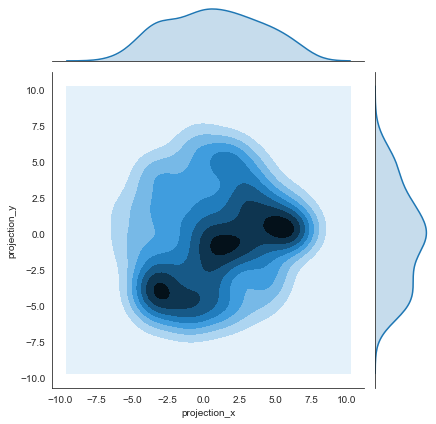

In [205]:
tmp = Roman_brooches[((Roman_brooches['fourFigureLon'] >= 1.0) & (Roman_brooches['fourFigureLon'] < 2.0))]
sns.jointplot(x=tmp["projection_x"], y=tmp["projection_y"], kind='kde')

In [23]:
def kernel_animation_cont(variable, vals, savename):
    xs = []
    ys = []
    for index, row in Roman_brooches.iterrows():
        if row[variable] >= vals[0] and row[variable] < vals[1]:
            xs.append(row["projection_x"])
            ys.append(row["projection_y"])
    print("From: " + str(vals[0]) + "  To: " + str(vals[1]) + "  n=" + str(len(xs)))
    plot = sns.jointplot(x=xs, y=ys, kind='kde')
    plot.xlim(-10, 10)
    plot.ylim(-10, 10)
    plot.savefig(savename)

In [24]:
def kernel_animation_cat(variable, v, savename):
    xs = []
    ys = []
    for index, row in Roman_brooches.iterrows():
        if row[variable] == v:
            xs.append(row["projection_x"])
            ys.append(row["projection_y"])
    print("V: " + str(v)+ "  n=" + str(len(xs)))
    plot = sns.jointplot(x=xs, y=ys, kind='kde', xlim=(-10,10),ylim=(-10,10))
    plot.savefig(savename)

In [25]:
def kernel_all(variable_list, mode):
    for variable in variable_list:
        list_of_vals = coloring_buckets[variable]
        if mode == 'cont':
            for vals in list_of_vals[1:]:
                try:
                    savename = str(variable) + "-(" + str(vals[0]) + ", " + str(vals[1]) + ").png"
                    kernel_animation_cont(variable, vals, savename)
                except:
                    print("Not enough data points for " + str(vals))
        elif mode == 'cat':
            for v in list_of_vals[1:]:
                try:
                    savename = str(variable) + "-(" + str(v) + ").png"
                    kernel_animation_cat(variable, v, savename)
                except:
                    print("Not enough data points for " + str(v))

In [4]:
%matplotlib inline

V: West Midlands  n=2988
V: South East  n=3801
V: East Midlands  n=6148
V: Yorkshire and the Humber  n=3577
V: Eastern  n=6769
V: South West  n=4171
V: Wales  n=386
V: North West  n=607
V: London  n=56
V: North East  n=222


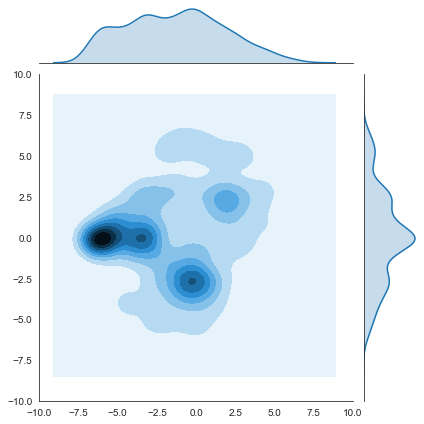

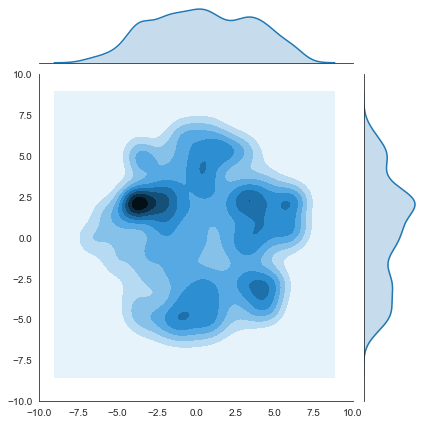

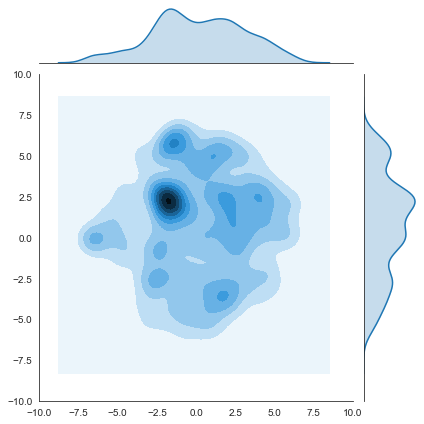

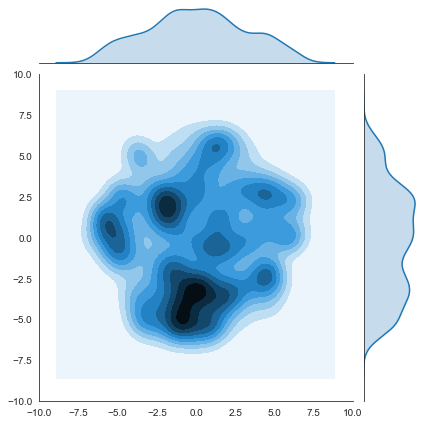

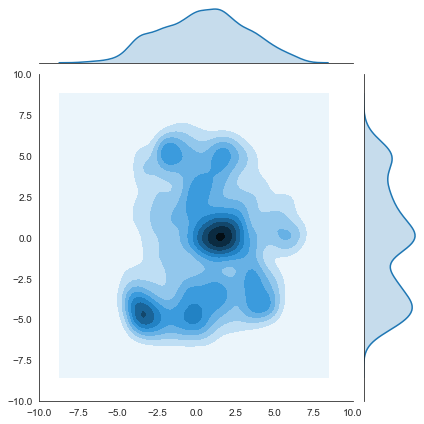

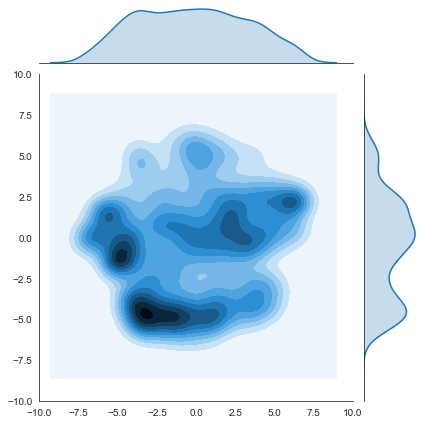

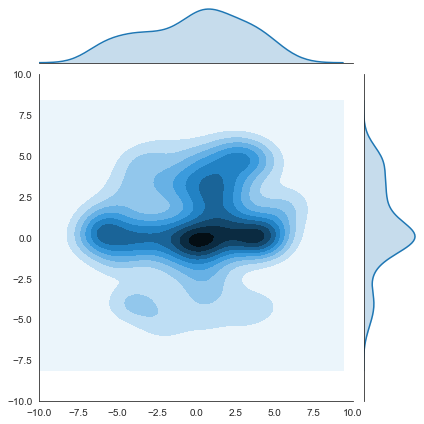

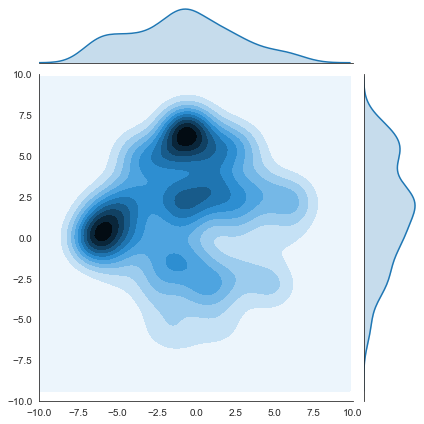

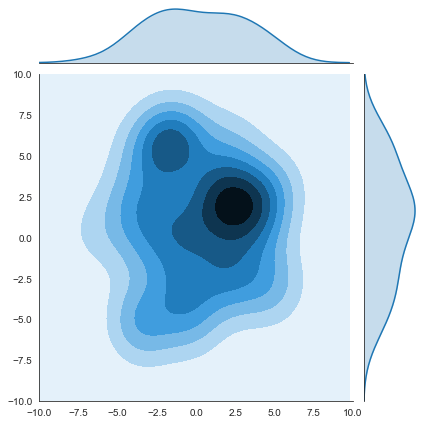

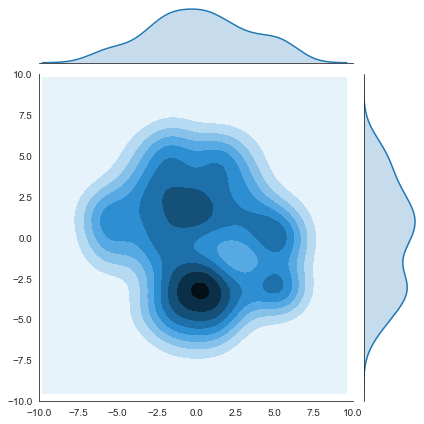

In [308]:
kernel_all(['region'], 'cat')

BKT: (43, 60)    n=211


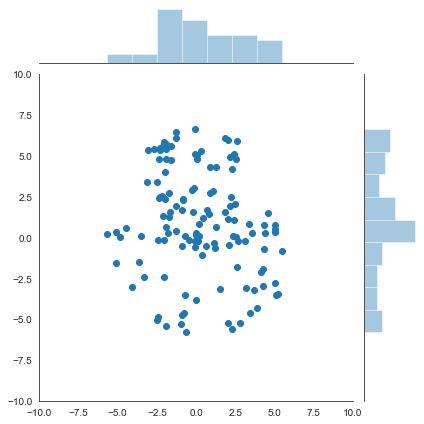

In [307]:
#tbs = [(0,100),(101,200),(201,300),(301,400),(401,10000)]
#tbs = [(0,42),(43,63),(0,63),(76,100)]
tbs = [(43,60)]
for b in tbs:
    xs = []
    ys = []
    for index, row in Roman_brooches.iterrows():
        if row["numdate1"] >= b[0] and row["numdate2"] <= b[1]:
            xs.append(row["projection_x"])
            ys.append(row["projection_y"])
    print("BKT: " + str(b) + "    n=" + str(len(xs)))
    plot = sns.jointplot(x=xs, y=ys, kind='scatter', xlim=(-10,10),ylim=(-10,10))
            

In [350]:
outlist = []
for index, row in Roman_brooches.iterrows():
    if not np.isnan(row["projection_x"]):
        #if row['fourFigureLon'] >= -4.0 and row['fourFigureLon'] < -3.0:
        if row['region'] == "North East":
            outlist.append(row["thumbnail"])
print(len(outlist))
print(outlist)

192
[1028616.0, 1008577.0, 1008370.0, 1008379.0, 1008375.0, 1008407.0, 1008367.0, 1004170.0, 639373.0, 632276.0, 599965.0, 596388.0, 596320.0, 580326.0, 609596.0, 607593.0, 609630.0, 607633.0, 607591.0, 607610.0, 607614.0, 609599.0, 609600.0, 578699.0, 609598.0, 609597.0, 571562.0, 607586.0, 607601.0, 607608.0, 607599.0, 609601.0, 561712.0, 609632.0, 548549.0, 530749.0, 522098.0, 620422.0, 495889.0, 486754.0, 486215.0, 486193.0, 476482.0, 469047.0, 467006.0, 461858.0, 461847.0, 454320.0, 452552.0, 452400.0, 446460.0, 444236.0, 441675.0, 420773.0, 418199.0, 414587.0, 609590.0, 609591.0, 609631.0, 609594.0, 609589.0, 486661.0, 609618.0, 495837.0, 495847.0, 495874.0, 495857.0, 609616.0, 609613.0, 609604.0, 609611.0, 561484.0, 609608.0, 609605.0, 609614.0, 609612.0, 486635.0, 486642.0, 495638.0, 1010555.0, 400714.0, 495637.0, 561447.0, 400715.0, 495635.0, 609595.0, 561449.0, 498638.0, 402135.0, 484901.0, 561445.0, 486903.0, 402139.0, 402147.0, 402130.0, 400442.0, 400440.0, 399277.0, 393720

In [26]:
from PIL import Image
import PIL
def open_img(fname):
    image = Image.open(fname).convert("L")
    arr = np.asarray(image)
    plt.imshow(arr, cmap='gray', vmin=0, vmax=255)
    plt.show()

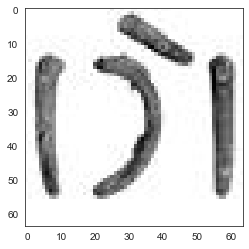

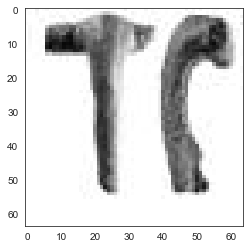

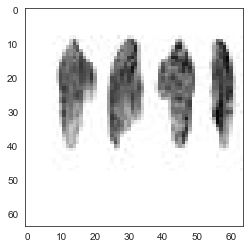

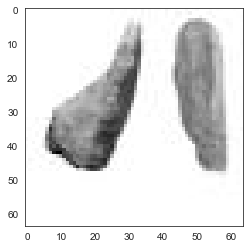

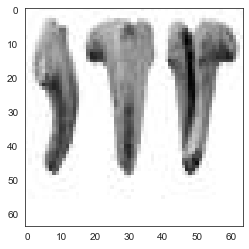

...

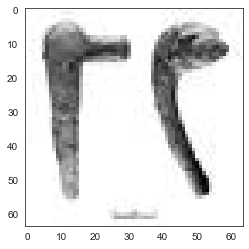

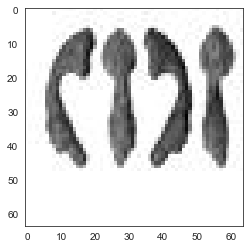

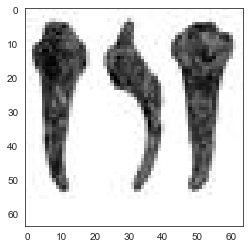

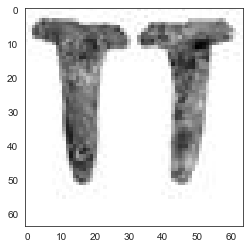

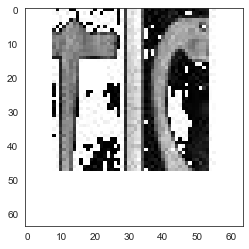

In [340]:
import os
stem = "Grey_Thumbnails/Brooch_atlas_"
files_to_open = []
for folder in range(1,26):
    path = stem + str(folder) + "/"
    dr = os.listdir(path)
    for code in outlist:
        check = "BROOCH_" + str(code)[:-2] + ".jpg"
        if check in dr:
            files_to_open.append(str(path + check))
for f in files_to_open:
    open_img(f)

In [334]:
i=0
for index, row in Roman_brooches.iterrows():
    if np.isnan(row["projection_x"]):
        i+=1
print(i)

6886


In [27]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.util import ngrams
import string
import re

In [28]:
custom_stop_words = ["<", ">", "p", "an", 'a', "and", "which", "the", "is", ',',':',';','of'
                    ,'.','from', 'has', '/p', 'in', 'mm', 'it', 'weight', 'g', 'no', 'so', 
                     'object', 'this', 'length', 'wide', 'thick', 'with', 'out', 'to', 'at',
                    'its', 'end', 'off', 'here', 'deep', 'the', 'dating', 'circa', 'ad',
                    'width', 'thickness', 'but', '-', 'around', 'within', 'thin', 'on', 'next',
                    'dimensions', 'overall', 'shows', 'can', 'was', 'at', 'it', 'somewhat', 'than',
                    'vol', 'i', 'rd', 'st', 'nd', 'th', 'that', 'rather', 'or', 'were', 'until',
                    'century', 'along', 'into', 'from', 'be', 'see', 'seen', 'are', 'had', 'by',
                    'c', 'have', 'there', 'for', 'now', 'been', 'weighs', 'br', 'would', 'incomplete',
                    'as', 'pl', 'where', 'em', 'either', 'even', 'published', 'these', 'original', 'while',
                    'PAS', 'possibly', 'almost', 'recorded', 'record', 'otherwise', 'although', 'found',
                    'ibid', 'illustrated', 'grams', 'date', 'belongs', 'much', 'they', 'further', 'database',
                    'cf', 'without', 'finder', 'known', 'each', 'finds', 'org', 'uk', 'inward', 'both',
                    'div', 'missing', 'href', 'https', 'http', ]



In [29]:
#subset_brooches = Roman_brooches[Roman_brooches["region"] == "North West"]
subset_brooches = Roman_brooches
print(len(subset_brooches))

29751


In [30]:
i = 0
descriptions = []
for index, row in subset_brooches.iterrows():
    i+=1
    if i > 30000:
        break
    else:
        descriptions.append(row["description"])
        #print(row["description"])
        #print("-----")
print(len(descriptions))

29751


In [31]:
BIG_COUNTER = collections.Counter()
errors_thrown = 0
for description in descriptions:
    try:
        cnt = collections.Counter()
        d = re.sub(r'[^\w\s]',' ',description)
        d = re.sub(r'[\d]', ' ',d)
        tokens = word_tokenize(d)
        for item in tokens:
            if item.lower() not in custom_stop_words:
                cnt[item] += 1
                BIG_COUNTER[item] += 1
        doubles = list(ngrams(tokens, 2))
        for item in doubles:
            if item[0].lower() not in custom_stop_words and item[1].lower() not in custom_stop_words:
                cnt[item] += 1
                BIG_COUNTER[item] += 1
    except:
        errors_thrown+=1

In [32]:
errors_thrown

20

In [500]:
BIG_COUNTER.most_common()

[('brooch', 72441),
 ('bow', 64895),
 ('pin', 31892),
 ('head', 29526),
 ('alloy', 29181),
 ('wings', 26068),
 ('copper', 26022),
 (('copper', 'alloy'), 25725),
 ('Roman', 24946),
 ('missing', 23098),
 ('div', 22875),
 (('div', 'div'), 21686),
 ('foot', 18647),
 ('catchplate', 18171),
 ('spring', 17157),
 ('plate', 16140),
 ('section', 14757),
 ('span', 14683),
 ('two', 13977),
 ('circular', 13941),
 ('type', 13916),
 ('decorated', 13705),
 ('shaped', 12831),
 ('central', 12229),
 ('enamel', 11568),
 ('bar', 11165),
 ('reverse', 10863),
 ('side', 10030),
 ('centre', 9943),
 ('top', 9599),
 ('upper', 9311),
 ('cast', 9260),
 ('remains', 9140),
 ('part', 9053),
 ('lower', 9025),
 ('flat', 8922),
 ('Hattatt', 8802),
 ('axis', 8743),
 ('Colchester', 8446),
 (('axis', 'bar'), 8392),
 ('lug', 8150),
 ('triangular', 7976),
 ('green', 7896),
 ('fragment', 7530),
 ('decoration', 7467),
 ('one', 7441),
 ('patina', 7418),
 ('front', 7412),
 ('edge', 7344),
 ('raised', 7247),
 ('wing', 7171),
 ('c

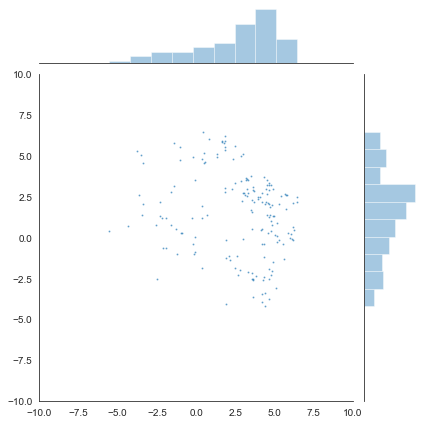

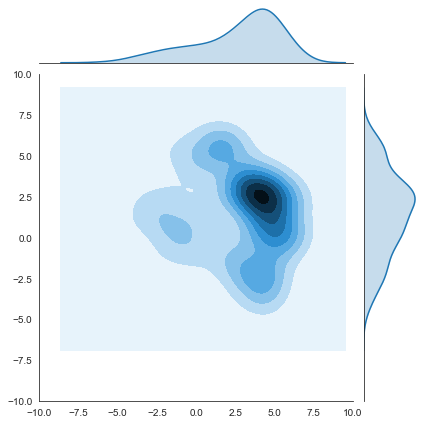

In [744]:
cf = "Dragonesque"
outx = []
outy = []
for index, row in Roman_brooches.iterrows():
    if row["classification"] == cf:
        if not np.isnan(row["projection_x"]):
            outx.append(row["projection_x"])
            outy.append(row["projection_y"])
plot = sns.jointplot(x=outx, y=outy, kind='scatter', xlim=(-10,10),ylim=(-10,10), s=1, alpha=0.5)
plot = sns.jointplot(x=outx, y=outy, kind='kde', xlim=(-10,10),ylim=(-10,10))

In [750]:
subset_further_examined = []
# good ones: blue, red, zoomorphic, disc
term_words = ["zoomorphic"]
errors = 0
for index, row in Roman_brooches.iterrows():
    try:
        description = row["description"]
        found = 0
        for item in term_words:
            if item in description:
                found+=1
        # currently selecting on OR
        # if found == len(term_words) <--- use for AND
        if found > 0:
            subset_further_examined.append(row)
    except:
        errors+=1
print("Rows selected: " + str(len(subset_further_examined)))
print("Errors thrown: " + str(errors))

Rows selected: 590
Errors thrown: 20


470


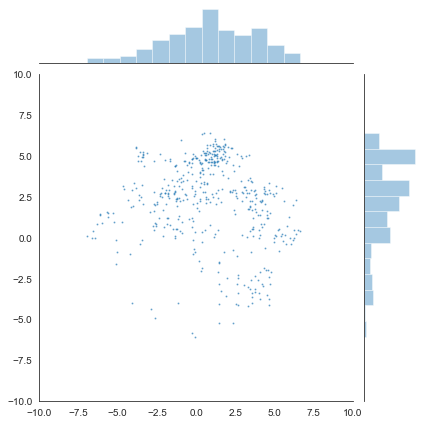

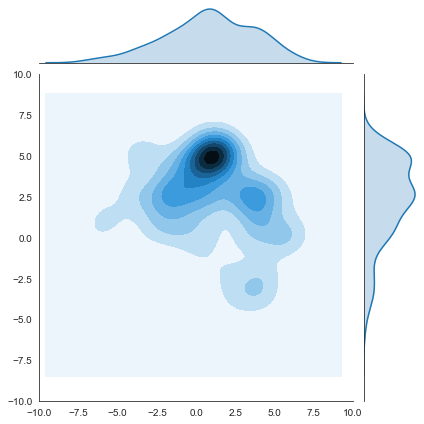

In [751]:
xs = []
ys = []
for row in subset_further_examined:
    x = row["projection_x"] 
    y = row["projection_y"] 
    if not np.isnan(x) and not np.isnan(y): 
        xs.append(x)
        ys.append(y)

#print(row["description"])
#print("--------------")
plot = sns.jointplot(x=xs, y=ys, kind='scatter', xlim=(-10,10),ylim=(-10,10), s=1, alpha=0.5)
plot = sns.jointplot(x=xs, y=ys, kind='kde', xlim=(-10,10),ylim=(-10,10))
print(len(xs))


In [18]:
len(Roman_brooches['classification'].unique())

2896

In [19]:
cnt = collections.Counter()
for index, row in Roman_brooches.iterrows():
    cnt[row['classification']]+=1
j = 0
i = 0
nxt = 0
nxt_c = 0
for item in cnt:
    if cnt[item] >= 100:
        j+=1
    elif cnt[item] >= 10:
        i +=1
    if cnt[item] >= 10 and cnt[item] < 400:
        nxt+=cnt[item]
        nxt_c+=1
print(nxt)
print(nxt_c)
print(j)
print(i)
print(cnt)

11123
215
40
186
Counter({nan: 6088, 'Trumpet': 1642, 'Headstud': 1096, 'Hod Hill': 969, 'Dolphin': 907, 'Plate': 799, 'T-shaped': 664, 'Colchester derivative': 608, 'Disc': 466, 'Colchester': 455, 'Polden Hill': 415, 'bow': 364, 'Bow': 358, 'plate': 285, 'trumpet': 279, 'Bow brooch': 273, 'Umbonate': 250, 'Colchester Derivative': 248, 'Knee': 236, 'T-shape': 230, 'Dragonesque': 212, 'Colchester derivative (double lug)': 207, 'disc': 178, 'Colchester derivative Polden Hill (flat wing ends type, West Midlands)': 178, 'Penannular': 169, 'Aesica': 166, 'Langton Down': 163, 'Aucissa': 155, 'Bow and Fantail': 150, 'Colchester Two-Piece Brooch': 143, 'Crossbow': 126, 'dolphin': 124, 'Bow Brooch': 124, 'headstud': 115, 'Colchester derivative (rear hook)': 115, 'Colchester-derivative (double-pierced lug)': 110, 'Colchester-derivative': 103, 'Bow and fantail': 102, 'Trumpet derivative': 101, 'Plate brooch': 100, 'Colchester derivative, Polden Hill': 97, 'Colchester derivative, Polden Hill (Mack

In [551]:
len(Roman_brooches)

29751

In [21]:
# DO REGIONAL PCAS
import os, numpy, PIL, time
from pylab import *
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import json

In [34]:
#-------------------------------------------------------------------------------------------
#-------------------------------------------------------------------------------------------
#-------------------------------------REGIONAL PCAS-----------------------------------------
#-------------------------------------------------------------------------------------------
#-------------------------------------------------------------------------------------------

In [20]:
def classgroup(c):
    platelike = ['hrider', 'z', 'p', 'di','u','drag', 'rose', 'tut', 'loz', 'chat', 'skeuo', 'this', 'wheel', 'swastika', 'oval', 'centreboss','star']
    hybrid = ['HH', 'ld', 'aes','fan','wir','saw', 'equal', 'bridge', 'alcester','bagendon']
    bowlike = ['cdp','cd','c','d','t','h','ts','ph','kn','arc','fib','theal','wrox','nau','ps','ds','cross','bow', 'blip', 'pin', 'strip', 'cruciform', 'latene', 'kraftig', 'hingehead', 'hook','eye']
    pen = ['pen']
    misc = ['mack', 'openwork']
    if type(c) != type('string'):
        return 'misc'
    elif c in platelike:
        return 'platelike'
    elif c in hybrid:
        return 'hybrid'
    elif c in bowlike:
        return 'bowlike'
    elif c in pen:
        return 'pen'
    elif c in misc:
        return 'misc'
    else:
        return 'misc'

In [311]:
REGION = 'Eastern'
thumbnails = []
classifications = []
master_projections = []
plotdates = []
rngs = []
class_group = []
tsne_lats = []
tsne_lons = []
iceni_tag = []
iceni_lats = [52.208650, 53.009198]
iceni_lons = [0.233828, 1.917483]
cd_mechanism = []
#print(len(IPB))
TST = 0
for index, row in ALL_BROOCHES.iterrows():
    if (iceni_lats[0] <= row['fourFigureLat'] <= iceni_lats[1]):
        if (iceni_lons[0] <= row['fourFigureLon'] <= iceni_lons[1]):
            iceni_tag.append(1)
        else:
            iceni_tag.append(0)
    else:
        iceni_tag.append(0)
    #print(row['thumbnail'])
    #if True:
    if row['region'] == REGION:
        if True:
            if not np.isnan(row['projection_x']):
                if (row['completeness'] == 'Complete') or (row['completeness'] == 'Incomplete'):
                    plotdate = (str(row['numdate1']), str(row['numdate2']))
                    rng = abs(row['numdate2'] - row['numdate1'])
                    thumbnails.append(str(row['thumbnail'])[:-2])
                    CLASS = classify(str(row['classification']))
                    if (CLASS == None) or (CLASS=='miscmack') or (CLASS=='mack') or (CLASS=='ungrouped') or (CLASS=='NaN'):
                        try:
                            desc = row['description'].replace('catch plate', 'catchPT')
                            desc = desc.replace('catchplate', 'catchPT')
                            new_c = classify(desc)
                            CLASS = new_c
                        except:
                            pass
                    TST+=1
                    classifications.append(CLASS)
                    #classifications.append(row['classifiedas'])
                    if CLASS in ['cd', 'd']:
                        if ('rear hook' in desc.lower()) or ('rearhook' in desc.lower()):
                            cd_mechanism.append('Rearhooks')
                        else:
                            cd_mechanism.append('Other CD')
                    else:
                        cd_mechanism.append('N/A')
                    plotdates.append(plotdate)
                    rngs.append(rng)
                    class_group.append(group_by_significance(CLASS))
                    tsne_lats.append(row['fourFigureLat'])
                    tsne_lons.append(row['fourFigureLon'])
                    #class_group.append(row['significance'])
                    master_projections.append({"tnail":str(row['thumbnail'])[:-2], 'x':row['projection_x'], 'y':row['projection_y']})

In [318]:
i = 0
for index, row in ALL_BROOCHES.iterrows():
    if row['completeness']=='Complete':
        i+=1
print(i)

2882


In [347]:
# Eastern Region has 2,645 CDs; 425 RHs
# ... Excluding Fragments 1,653 CDs; 371 RHs
# 2,703 brooches found in Eastern Britain have photos 
eastern_rearhooks = 0
eastern_rh_cds = 0
non_fragments = 0
correct_rh_thumbnails = collections.Counter()

for index, row in ALL_BROOCHES.iterrows():
    if (row['region']=='Eastern'): #and (row['completeness'] in ['Complete', 'Incomplete']):
        CLASS = classify(str(row['classification']))
        desc = str(row['description']).lower()
        
        if (CLASS == None) or (CLASS=='miscmack') or (CLASS=='mack') or (CLASS=='ungrouped') or (CLASS=='NaN'):
            desc = desc.replace('catch plate', 'catchPT')
            desc = desc.replace('catchplate', 'catchPT')
            new_c = classify(desc)
            CLASS = new_c
            
        if ('rearhook' in desc) or ('rear hook' in desc):
            eastern_rearhooks+=1
            if CLASS in ['cd', 'd']:
                eastern_rh_cds+=1
                if row['completeness'] != "Fragment":
                    non_fragments+=1
                    correct_rh_thumbnails[str(row['thumbnail'])]+=1
        
        
        #if (CLASS == None) or (CLASS=='miscmack') or (CLASS=='mack') or (CLASS=='ungrouped') or (CLASS=='NaN'):
        #    try:
        #        desc = row['description'].replace('catch plate', 'catchPT')
        #        desc = desc.replace('catchplate', 'catchPT')
        #        new_c = re_classify(desc)
        #        CLASS = new_c
        #    except:
        #        pass
            
        #if CLASS in ['cd', 'd']:
        #    CDS+=1
        #    if ('rear hook' in desc.lower()) or ('rearhook' in desc.lower()):
        #        RHC+=1
print(eastern_rearhooks)
print(eastern_rh_cds)
print(non_fragments)
print(correct_rh_thumbnails)


858
670
605
Counter({'nan': 286, '219253.0': 2, '219252.0': 2, '219250.0': 2, '219249.0': 2, '219245.0': 2, '219243.0': 2, '219242.0': 2, '219241.0': 2, '1052856.0': 1, '1042145.0': 1, '1040442.0': 1, '1034187.0': 1, '1015570.0': 1, '1011715.0': 1, '1011714.0': 1, '1023651.0': 1, '1014933.0': 1, '1021845.0': 1, '1004281.0': 1, '1004202.0': 1, '1017841.0': 1, '1001421.0': 1, '1013182.0': 1, '1008203.0': 1, '1008187.0': 1, '1006595.0': 1, '1008511.0': 1, '644179.0': 1, '628669.0': 1, '1002730.0': 1, '628166.0': 1, '604064.0': 1, '604048.0': 1, '606916.0': 1, '601246.0': 1, '1008533.0': 1, '597691.0': 1, '592542.0': 1, '590320.0': 1, '601789.0': 1, '601787.0': 1, '563156.0': 1, '556591.0': 1, '585525.0': 1, '589896.0': 1, '566603.0': 1, '546367.0': 1, '546348.0': 1, '604396.0': 1, '546745.0': 1, '571693.0': 1, '557764.0': 1, '557763.0': 1, '549756.0': 1, '599912.0': 1, '602972.0': 1, '536341.0': 1, '535971.0': 1, '620020.0': 1, '535864.0': 1, '540604.0': 1, '520077.0': 1, '520136.0': 1, '

In [338]:
i = 0
east = 0

for index, row in ALL_BROOCHES.iterrows():
    desc = str(row['description']).lower()
    if ("rearhook" in desc) or ("rear hook" in desc):
        i+=1
        if row['region'] == 'Eastern':
            east+=1
        else:
            pass
    else:
        pass
    
print(i)
print(east)
    

1079
858


In [339]:
len(thumbnails)

2703

In [22]:
def find_path(tnail):
    start = "Grey_Thumbnails/Brooch_atlas_"
    end = "/BROOCH_"
    for i in range(1, 25):
        test = str(start + str(i) + end + tnail + ".jpg")
        try:
            im = Image.open(test)
            return test
        except:
            pass

In [304]:
allfiles = []
for t in thumbnails:
    path = find_path(t)
    allfiles.append(path)
print(len(thumbnails))
print(len(allfiles))

2703
2703


In [305]:
# ---- Load Images ----
imlist = allfiles
im = array(Image.open(imlist[0])) # open one image to get size
m, n = im.shape[0:2] # get the size of the images
imnbr = list(imlist) # get the number of images
# create matrix to store all flattened images
immatrix = asarray([array(Image.open(im)).flatten() for im in imlist], 'f')

Eastern
[0.09360744 0.07492136]


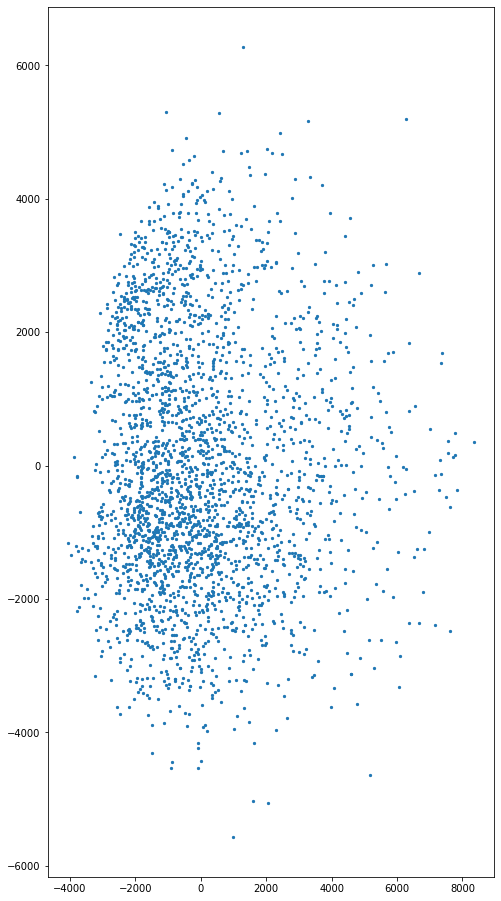

In [306]:
# perform PCA
#V, S, immean = pca.pca(immatrix)
pca = PCA(n_components = 2)
pca_result = pca.fit_transform(immatrix)
print_results = pca.explained_variance_ratio_
print(REGION)
print(print_results)
plt.scatter(pca_result[:, 0], pca_result[:,1], s=5)
plt.show()
pca_output_list = []
for i in range(0, len(imlist)):
    new_item = {'image': str(imlist[i]), 'x': float(pca_result[i][0]), 'y': float(pca_result[i][1])}
    pca_output_list.append(new_item)

In [23]:
all_unique_brooch_classes = ['z','c','cd','cdp','d','t','h','HH','p','ts','di','ph','u','kn',
'drag','pen','aes','ld','auc','fan','rose','wir','fib','saw','theal',
'wrox','nau','ps','ds','cross','bow','tut','loz','hrider','blip',
'pin','mack','chat','skeuo','this','strip','wheel','cruciform',
'swastika','latene','equal','openwork','bridge','oval','hingehead',
'centreboss','kraftig','hook','alcester','bagendon','eye','star']
used_uniques = []
for c in classifications:
    if c in used_uniques:
        pass
    else:
        used_uniques.append(c)
z = range(1, len(used_uniques))
hot = plt.get_cmap('hot')
cNorm = colors.Normalize(vmin=0, vmax=len(used_uniques))
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=hot)
use_colors = []
for c in classifications:
    for i in range(len(used_uniques)):
        if c==used_uniques[i]:
            use_colors.append(scalarMap.to_rgba(i))

NameError: name 'classifications' is not defined

In [228]:
i= 0
for item in iceni_tag:
    if item==1:
        i+=1
print(i)

1914


In [356]:
valids = correct_rh_thumbnails.keys()
ERH_TNAILS = []
for item in valids:
    if item != 'nan':
        comp = item[:-2]
        ERH_TNAILS.append(comp)

In [361]:
tsne_output_list = []
total_rh = 0
for i in range(0, len(imlist)):
    image = str(imlist[i])
    new_item = {'image': image, 'x': float(tsne_results[i][0]), 'y': float(tsne_results[i][1]), 'c':str(classifications[i]),
               'plotdate':str(plotdates[i]), 'rng': str(rngs[i]), 'cgroup': str(class_group[i]), 'IPB':str(iceni_tag[i]),
               'lat': str(tsne_lats[i]), 'lon': str(tsne_lons[i]), 'mechanism': str(cd_mechanism[i])}
    for item in ERH_TNAILS:
        if item in image:
            new_item['mechanism']='Rearhooks'
            total_rh+=1
    tsne_output_list.append(new_item)
with open('eastern_pca_tsne_UPDATED.json', 'w') as fout:
    json.dump(tsne_output_list, fout)
print(total_rh)
    
    #if new_item['image'] in correct_rh_thumbnails.keys():

249


In [351]:
imlist[3]

'Grey_Thumbnails/Brooch_atlas_3/BROOCH_1062375.jpg'

[0.09360741 0.07492138 0.05204298 0.04905966 0.0471293  0.0345605
 0.02842514 0.02625945 0.02189714 0.01827028 0.0172054  0.01503551
 0.01480029 0.01217911 0.0110464  0.00999491 0.00934065 0.00906381
 0.0086056  0.0085789  0.00753267 0.00726201 0.00687708 0.00675388
 0.0065473 ]
0.5969967
[t-SNE] Computing 811 nearest neighbors...
[t-SNE] Indexed 2703 samples in 0.004s...
[t-SNE] Computed neighbors for 2703 samples in 0.993s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2703
[t-SNE] Computed conditional probabilities for sample 2000 / 2703
[t-SNE] Computed conditional probabilities for sample 2703 / 2703
[t-SNE] Mean sigma: 1475.119317
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.947338
[t-SNE] KL divergence after 300 iterations: 1.164060
t-SNE done! Time elapsed: 23.02219009399414 seconds


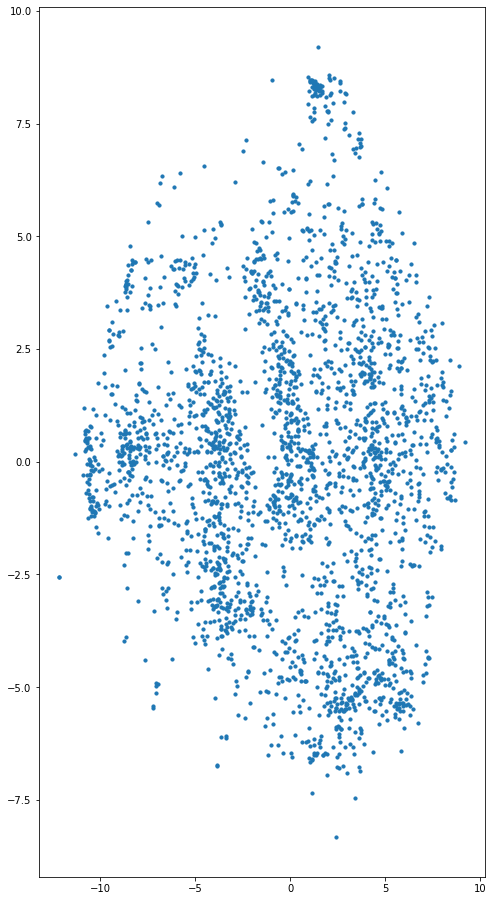

In [310]:
get_color_counter = 0
#plt.rcParams["figure.figsize"] = (16,10)
pca = PCA(n_components = 25)
pca_result = pca.fit_transform(immatrix)
print_results = pca.explained_variance_ratio_
print(print_results)
print(sum(print_results))
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=270, n_iter=300)
tsne_results = tsne.fit_transform(pca_result)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

# do the scatterplot
plt.scatter(tsne_results[:, 0], tsne_results[:,1], s=10, label=used_uniques)
#plt.legend(loc='upper left')
plt.show()
i = 0
tsne_output_list = []
for i in range(0, len(imlist)):
    new_item = {'image': str(imlist[i]), 'x': float(tsne_results[i][0]), 'y': float(tsne_results[i][1]), 'c':str(classifications[i]),
               'plotdate':str(plotdates[i]), 'rng': str(rngs[i]), 'cgroup': str(class_group[i]), 'IPB':str(iceni_tag[i]),
               'lat': str(tsne_lats[i]), 'lon': str(tsne_lons[i]), 'mechanism': str(cd_mechanism[i])}
    tsne_output_list.append(new_item)
with open('eastern_pca_tsne.json', 'w') as fout:
    json.dump(tsne_output_list, fout)

In [309]:
def show_img(img_array):
    plt.imshow(img_array, cmap='gray', vmin=0, vmax=255)
    plt.show()

In [47]:
def open_cluster(lst, xleft, xright, ybot, ytop):
    for item in lst:
        if item['x'] >= float(xleft) and item['x'] <= float(xright):
            if item['y'] >= float(ybot) and item['y'] <= float(ytop):
                p = Image.open(item['image']).convert("L")
                show_img(p)

In [731]:
master_output_list = []
for item in master_projections:
    check = item['tnail']
    for file in allfiles:
        if check in file:
            master_output_list.append({"image": file, "x": item["x"], "y": item["y"]})

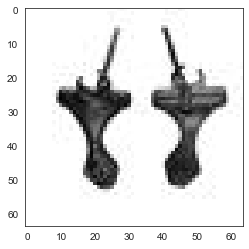

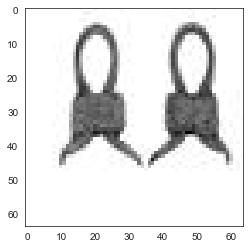

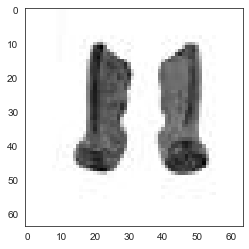

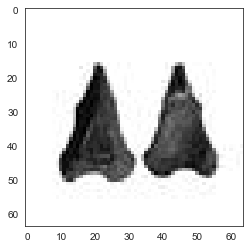

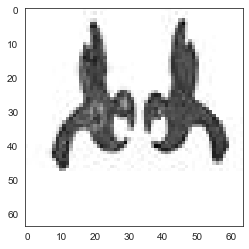

...

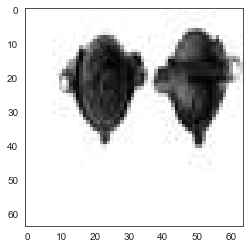

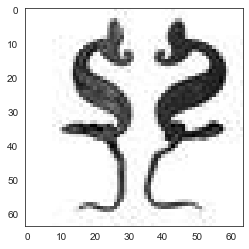

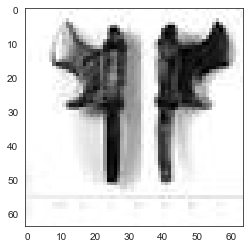

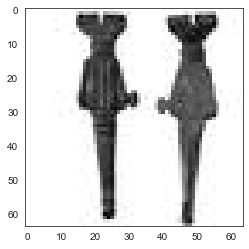

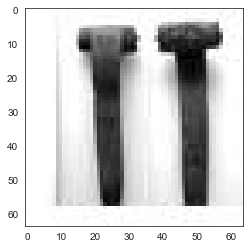

In [745]:
open_cluster(master_output_list, 3.75, 4.25, 2.0, 3.0)

In [734]:
#-------------------------------------------------------------------------------------------
#-------------------------------------------------------------------------------------------
#-------------------------------------CLASS. TAGS-----------------------------------------
#-------------------------------------------------------------------------------------------
#-------------------------------------------------------------------------------------------

In [33]:
all_class = collections.Counter()
for index, row in Roman_brooches.iterrows():
    all_class[row['classification']]+=1
all_class = all_class.most_common()

In [34]:
print(all_class)

[(nan, 6088), ('Trumpet', 1642), ('Headstud', 1096), ('Hod Hill', 969), ('Dolphin', 907), ('Plate', 799), ('T-shaped', 664), ('Colchester derivative', 608), ('Disc', 466), ('Colchester', 455), ('Polden Hill', 415), ('bow', 364), ('Bow', 358), ('plate', 285), ('trumpet', 279), ('Bow brooch', 273), ('Umbonate', 250), ('Colchester Derivative', 248), ('Knee', 236), ('T-shape', 230), ('Dragonesque', 212), ('Colchester derivative (double lug)', 207), ('disc', 178), ('Colchester derivative Polden Hill (flat wing ends type, West Midlands)', 178), ('Penannular', 169), ('Aesica', 166), ('Langton Down', 163), ('Aucissa', 155), ('Bow and Fantail', 150), ('Colchester Two-Piece Brooch', 143), ('Crossbow', 126), ('dolphin', 124), ('Bow Brooch', 124), ('headstud', 115), ('Colchester derivative (rear hook)', 115), ('Colchester-derivative (double-pierced lug)', 110), ('Colchester-derivative', 103), ('Bow and fantail', 102), ('Trumpet derivative', 101), ('Plate brooch', 100), ('Colchester derivative, Pol

In [35]:
def classify(c):
    c = str(c).lower()
    if ('horse' in c) and ('rider' in c):
        return 'hrider'
    elif ('zoomorphic' in c) or (c=='horse') or (c=='duck') or (c=='fly'):
        return 'z'
    elif 'colchester' in c:
        if 'derivative' in c:
            if 'polden' in c:
                return 'cdp'
            else:
                return 'cd'
        else:
            return 'c'
    elif ('dolphin' in c) or ('dophin' in c):
        return 'd'
    elif 'trumpet' in c:
        return 't'
    elif ('headstud' in c) or (('head' in c) and ('stud' in c)):
        return 'h'
    elif ('hod' in c) and ('hill' in c):
        return 'HH'
    elif ('t-shape' in c) or (((' t ' in c) or ('t ' in c) or ('t-' in c)) and ('shape' in c)):
        return 'ts'
    elif ('disc' in c) or ('disk' in c):
        return 'di'
    elif ('polden' in c) and ('hill' in c):
        return 'ph'
    elif 'umbonate' in c:
        return 'u'
    elif 'knee' in c:
        return 'kn'
    elif ('dragon' in c) or ('dragonesque' in c):
        return 'drag'
    elif ('penannular' in c) or ('penanular' in c) or ('pennanular' in c) or ('pennannular' in c):
        return 'pen'
    elif 'aesica' in c:
        return 'aes'
    elif 'langton' in c:
        return 'ld'
    elif 'aucissa' in c:
        return 'auc'
    elif 'fantail' in c:
        return 'fan'
    elif ('rosette' in c) or ('rosete' in c):
        return 'rose'
    elif ('wirral' in c) or ('wiral' in c):
        return 'wir'
    elif 'fibula' in c:
        return 'fib'
    elif ('sawfish' in c) or (('saw' in c) and ('fish' in c)):
        return 'saw'
    elif 'thealby' in c:
        return 'theal'
    elif 'wroxeter' in c:
        return 'wrox'
    elif 'nauheim' in c:
        return 'nau'
    elif ('p-shape' in c) or ((' p ' in c) and ('shape' in c)) or ('p shape' in c):
        return 'ps'
    elif ('d-shape' in c) or ((' d ' in c) and ('shape' in c)):
        return 'ds'
    elif ('proto' in c) and ('cross' in c) and ('bow' in c):
        return 'protocross'
    elif 'crossbow' in c or (('cross' in c) and ('bow' in c)):
        return 'cross'
    elif 'tutulus' in c:
        return 'tut'
    elif 'lozeng' in c:
        return 'loz'
    elif ('bird' in c) and ('lip' in c):
        return 'blip'
    elif c == 'pin':
        return 'pin'
    elif 'mackreth' in c:
        return 'mack'
    elif 'chatelaine' in c:
        return 'chat'
    elif ('skeuo' in c) or ('skeu' in c) or ('skeo' in c):
        return 'skeuo'
    elif 'thistle' in c:
        return 'this'
    elif ('bird' in c) or ('duck' in c) or ('lion' in c) or ('animal' in c) or ('horse' in c) or ('leopard' in c) or ('cockerel' in c) or ('zoo' in c) or ('hare' in c) or ('insect' in c) or ('chicken' in c):
        return 'z' # throw these in zoomorphic
    elif c == 'strip':
        return 'strip'
    elif 'wheel' in c:
        return 'wheel'
    elif 'cruciform' in c:
        return 'cruciform'
    elif 'swastika' in c:
        return 'swastika'
    elif ('la' in c) and ('tene' in c) or ('t√®ne' in c):
        return 'latene'
    elif ('equal' in c):
        return 'equal'
    elif ('open' in c) and ('work' in c):
        return 'openwork'
    elif ('bridge' in c):
        return 'bridge'
    elif ('oval' in c):
        return 'oval'
    elif ('hinge' in c) and ('head' in c):
        return 'hingehead'
    elif (('center' in c) or ('centre' in c)) and ('boss' in c):
        return 'centreboss'
    elif ('kraftig' in c) or ('kr√§ftig' in c):
        return 'kraftig'
    elif ('hook' in c):
        return 'hook'
    elif ('doph' in c) or ('dolph' in c):
        return 'd' # throw these with dolphin
    elif ('alcester' in c):
        return 'alcester'
    elif ('bagendon' in c):
        return 'bagendon'
    elif ('pold' in c):
        return 'ph' # throw these with polden hill
    elif ('trump' in c) or ('trmp' in c):
        return 't' # throw these with trumpet
    elif ('eye' in c):
        return 'eye'
    elif ('star' in c):
        return 'star'
    elif ('mac' in c) or ('mak' in c):
        return 'mack' # throw these with mackreth
    elif 'bow' in c:
        return 'bow'
    elif 'plate' in c:
        return 'p'

In [36]:
zoomorphic = []
colchester = []
colchester_derivatives = []
colchester_derivatives_poldenhill = []
dolphin = []
trumpet = []
headstud = []
hodhill = []
plate = []
tshape = []
disc = []
poldenhill = []
umbonate = []
knee = []
dragonesque = []
penannular = []
aesica = []
langtondown = []
aucissa = []
fantail = []
rosette = []
wirral = []
fibula = []
sawfish = []
thealby = []
wroxeter = []
nauheim = []
pshape = []
dshape = []
protocrossbow = []
crossbow = []
bow = []
tutulus = []
pin = []
lozenge = []
horserider = []
birdlip = []
miscmackreth = []
chatelaine = []
skeuomorphic = []
thistle = []
strip = []
wheel = []
cruciform = []
swastika = []
latene = []
equal = []
openwork = []
bridge = []
oval = []
hingehead = []
centreboss = []
kraftig = []
mischook = []
alcester = []
bagendon = []
misceye = []
star = []
not_classified = []

for item in all_class:
    if type(item[0]) == str:
        c = item[0].lower()
        c_class = classify(c)
        if c_class == 'z':
            zoomorphic.append(item)
        elif c_class == 'c':
            colchester.append(item)
        elif c_class == 'cd':
            colchester_derivatives.append(item)
        elif c_class == 'cdp':
            colchester_derivatives_poldenhill.append(item)
        elif c_class == 'd':
            dolphin.append(item)
        elif c_class == 't':
            trumpet.append(item)
        elif c_class == 'h':
            headstud.append(item)
        elif c_class == 'HH':
            hodhill.append(item)
        elif c_class == 'p':
            plate.append(item)
        elif c_class == 'ts':
            tshape.append(item)
        elif c_class == 'di':
            disc.append(item)
        elif c_class == 'ph':
            poldenhill.append(item)
        elif c_class == 'u':
            umbonate.append(item)
        elif c_class == 'kn':
            knee.append(item)
        elif c_class == 'drag':
            dragonesque.append(item)
        elif c_class == 'pen':
            penannular.append(item)
        elif c_class == 'aes':
            aesica.append(item)
        elif c_class == 'ld':
            langtondown.append(item)
        elif c_class == 'auc':
            aucissa.append(item)
        elif c_class == 'fan':
            fantail.append(item)
        elif c_class == 'rose':
            rosette.append(item)
        elif c_class == 'wir':
            wirral.append(item)
        elif c_class == 'fib':
            fibula.append(item)
        elif c_class == 'saw':
            sawfish.append(item)
        elif c_class == 'theal':
            thealby.append(item)
        elif c_class == 'wrox':
            wroxeter.append(item)
        elif c_class == 'nau':
            nauheim.append(item)
        elif c_class == 'ps':
            pshape.append(item)
        elif c_class == 'ds':
            dshape.append(item)
        elif c_class == 'protocross':
            protocrossbow.append(item)
        elif c_class == 'cross':
            crossbow.append(item)
        elif c_class == 'bow':
            bow.append(item)
        elif c_class == 'tut':
            tutulus.append(item)
        elif c_class == 'loz':
            lozenge.append(item)
        elif c_class == 'hrider':
            horserider.append(item)
        elif c_class == 'blip':
            birdlip.append(item)
        elif c_class == 'pin':
            pin.append(item)
        elif c_class == 'mack':
            miscmackreth.append(item)
        elif c_class == 'chat':
            chatelaine.append(item)
        elif c_class == 'skeuo':
            skeuomorphic.append(item)
        elif c_class == 'this':
            thistle.append(item)
        elif c_class == 'strip':
            strip.append(item)
        elif c_class == 'wheel':
            wheel.append(item)
        elif c_class == 'cruciform':
            cruciform.append(item)
        elif c_class == 'swastika':
            swastika.append(item)
        elif c_class == 'latene':
            latene.append(item)
        elif c_class == 'equal':
            equal.append(item)
        elif c_class == 'openwork':
            openwork.append(item)
        elif c_class == 'bridge':
            bridge.append(item)
        elif c_class == 'oval':
            oval.append(item)
        elif c_class == 'hingehead':
            hingehead.append(item)
        elif c_class == 'centreboss':
            centreboss.append(item)
        elif c_class == 'kraftig':
            kraftig.append(item)
        elif c_class == 'hook':
            mischook.append(item)
        elif c_class == 'alcester':
            alcester.append(item)
        elif c_class == 'bagendon':
            bagendon.append(item)
        elif c_class == 'eye':
            misceye.append(item)
        elif c_class == 'star':
            star.append(item)
        else:
            not_classified.append(item)
# total is 29751
# 90% in top 529

In [37]:
MCL = {}
MCL['zoomorphic']=zoomorphic
MCL['colchester']=colchester
MCL['colchester_derivatives']=colchester_derivatives
MCL['colchester_derivatives_poldenhill']=colchester_derivatives_poldenhill
MCL['dolphin']=dolphin
MCL['trumpet']=trumpet
MCL['headstud']=headstud
MCL['hodhill']=hodhill
MCL['plate']=plate
MCL['tshape']=tshape
MCL['disc']=disc
MCL['poldenhill']=poldenhill
MCL['umbonate']=umbonate
MCL['knee']=knee
MCL['dragonesque']=dragonesque
MCL['penannular']=penannular
MCL['aesica']=aesica
MCL['langtondown']=langtondown
MCL['aucissa']=aucissa
MCL['fantail']=fantail
MCL['rosette']=rosette
MCL['wirral']=wirral
MCL['fibula']=fibula
MCL['sawfish']=sawfish
MCL['thealby']=thealby
MCL['wroxeter']=wroxeter
MCL['nauheim']=nauheim
MCL['pshape']=pshape
MCL['dshape']=dshape
MCL['protocrossbow']=protocrossbow
MCL['crossbow']=crossbow
MCL['bow']=bow
MCL['tutulus']=tutulus
MCL['pin']=pin
MCL['lozenge']=lozenge
MCL['horserider']=horserider
MCL['birdlip']=birdlip
MCL['miscmackreth']=miscmackreth
MCL['chatelaine']=chatelaine
MCL['skeuomorphic']=skeuomorphic
MCL['thistle']=thistle
MCL['strip']=strip
MCL['wheel']=wheel
MCL['cruciform']=cruciform
MCL['swastika']=swastika
MCL['latene']=latene
MCL['equal']=equal
MCL['openwork']=openwork
MCL['bridge']=bridge
MCL['oval']=oval
MCL['hingehead']=hingehead
MCL['centreboss']=centreboss
MCL['kraftig']=kraftig
MCL['mischook']=mischook
MCL['alcester']=alcester
MCL['bagendon']=bagendon
MCL['misceye']=misceye
MCL['star']=star
MCL['not_classified']=not_classified

In [38]:
total = 0
outputs = []
for class_family in MCL:
    subtotal = 0
    for c in MCL[class_family]:
        subtotal+= int(c[1])
    print(str(str(subtotal) + "   " + str(class_family)))
    total+=subtotal
print(total)

443   zoomorphic
1296   colchester
2746   colchester_derivatives
1777   colchester_derivatives_poldenhill
1536   dolphin
2580   trumpet
1431   headstud
1262   hodhill
1308   plate
1622   tshape
1181   disc
709   poldenhill
335   umbonate
354   knee
253   dragonesque
260   penannular
253   aesica
210   langtondown
212   aucissa
471   fantail
149   rosette
103   wirral
103   fibula
52   sawfish
64   thealby
34   wroxeter
46   nauheim
84   pshape
0   dshape
7   protocrossbow
229   crossbow
1307   bow
34   tutulus
32   pin
67   lozenge
81   horserider
25   birdlip
331   miscmackreth
31   chatelaine
38   skeuomorphic
13   thistle
13   strip
14   wheel
9   cruciform
4   swastika
25   latene
63   equal
19   openwork
15   bridge
47   oval
38   hingehead
21   centreboss
25   kraftig
19   mischook
9   alcester
7   bagendon
7   misceye
4   star
255   not_classified
23663


In [39]:
def abstract(c):
    if type(c) != type('string'):
        return "NaN"
    for fam in MCL:
        class_tuples = MCL[fam]
        for t in class_tuples:
            if t[0] == c:
                return fam
    return "NOT FOUND"

In [40]:
def aesthetics_by_class(region):
    subset = []
    class_counter = collections.Counter()
    cfam_counter = collections.Counter()
    for index, row in Roman_brooches.iterrows():
        if row['region'] == region:
            subset.append(row)
            class_counter[row['classification']]+=1
    for c in class_counter:
        cfam_counter[abstract(c)] += class_counter[c]
    return cfam_counter
    

In [33]:
row_count = collections.Counter()
for index, row in Roman_brooches.iterrows():
    row_count[row['region']]+=1
print(row_count)

Counter({'Eastern': 6769, 'East Midlands': 6148, 'South West': 4171, 'South East': 3801, 'Yorkshire and the Humber': 3577, 'West Midlands': 2988, nan: 1026, 'North West': 607, 'Wales': 386, 'North East': 222, 'London': 56})


In [46]:
def compare_regional_aesthetics_by_class():
    WestMidlands = aesthetics_by_class('West Midlands')
    SouthEast = aesthetics_by_class('South East')
    EastMidlands = aesthetics_by_class('East Midlands')
    YorkshireHumber = aesthetics_by_class('Yorkshire and the Humber')
    Eastern = aesthetics_by_class('Eastern')
    SouthWest = aesthetics_by_class('South West')
    Wales = aesthetics_by_class('Wales')
    NorthWest = aesthetics_by_class('North West')
    London = aesthetics_by_class('London')
    NorthEast = aesthetics_by_class('North East')
    

In [47]:
def compare_regional_aesthetics_by_class():
    outfile = open('Regional_Aesthetics.csv', 'w')
    writer = csv.writer(outfile)
    
    title_row = ['region']
    for class_family in MCL:
        title_row.append(class_family)
    title_row.append("NaN")
    writer.writerow(title_row)
    
    for region in Roman_brooches['region'].unique():
        if type(region) == type('string'):
            new_row = [region]
            classcounts = aesthetics_by_class(region)
            for class_family in MCL:
                new_row.append(classcounts[class_family])
        writer.writerow(new_row)
    outfile.close()

In [1094]:
compare_regional_aesthetics_by_class()

In [48]:
import geopandas as gpd
import matplotlib
import descartes

In [49]:
fp = "NUTS_Level_1_January_2018_Super_Generalised_Clipped_Boundaries_in_the_United_Kingdom.shx"
map_df = gpd.read_file(fp)
plt.rcParams["figure.figsize"] = (8,16)

In [50]:
map_df['name'] = ['North East','North West','Yorkshire and the Humber','East Midlands',
                  'West Midlands','Eastern','London','South East','South West','Wales','Scotland', 'Northern Ireland']
map_df = (map_df.drop(11)).drop(10)

In [51]:
geodf = pd.read_excel(r'OneSheet_Regional_Aesthetics.xlsx')

In [52]:
merged = map_df.set_index('name').join(geodf.set_index('region'))

In [53]:
merged

,geometry,zoomorphic,colchester,colchester_derivatives,colchester_derivatives_poldenhill,dolphin,trumpet,headstud,hodhill,plate,...,hingehead,centreboss,kraftig,mischook,alcester,bagendon,misceye,star,not_classified,NaN
name,,,,,,,,,,,,,,,,,,,,,
North East,"MULTIPOLYGON (((398515.800 653060.200, 398253....",2.500000,0.500000,1.000000,0.000000,0.000000,15.500000,9.000000,0.000000,11.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.500000,11.000000
North West,"MULTIPOLYGON (((357136.203 587050.898, 356572....",1.153213,0.164745,0.658979,2.965404,6.095552,21.746293,6.425041,0.658979,1.812191,...,0.000000,0.164745,0.329489,0.000000,0.164745,0.000000,0.164745,0.000000,0.658979,17.957166
Yorkshire and the Humber,"MULTIPOLYGON (((479381.800 518245.500, 479975....",1.510912,1.538892,3.301623,0.055960,3.049804,20.537213,18.298825,2.322328,3.525462,...,0.027980,0.055960,0.000000,0.000000,0.055960,0.000000,0.055960,0.000000,0.839396,14.521544
East Midlands,"MULTIPOLYGON (((512490.996 414654.696, 512679....",1.577749,3.090436,4.554327,2.667534,12.410540,7.986337,5.904359,4.635654,6.587508,...,0.065062,0.032531,0.016265,0.081327,0.016265,0.048796,0.032531,0.000000,0.813273,12.540664
West Midlands,"POLYGON ((404258.203 368301.504, 406240.101 36...",0.301508,10.318258,4.221106,31.624791,1.775544,12.294807,1.876047,0.871022,2.144054,...,0.067002,0.000000,0.000000,0.000000,0.033501,0.000000,0.033501,0.000000,0.603015,13.500838
Eastern,"MULTIPOLYGON (((600563.482 346526.146, 600790....",1.846927,5.481678,23.315603,1.743499,4.403073,3.161939,2.039007,6.057920,4.861111,...,0.280733,0.118203,0.118203,0.073877,0.000000,0.000000,0.014775,0.044326,1.019504,25.103428
London,"MULTIPOLYGON (((532540.503 200760.602, 534074....",3.571429,12.500000,16.071429,0.000000,0.000000,1.785714,0.000000,5.357143,12.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.785714,35.714286
South East,"MULTIPOLYGON (((493459.103 253084.405, 493776....",1.631150,6.261510,7.787424,2.630887,1.894238,4.235727,1.446988,6.840305,7.603262,...,0.105235,0.026309,0.315706,0.026309,0.078927,0.052618,0.000000,0.000000,0.815575,33.701657
South West,"MULTIPOLYGON (((417496.201 243875.101, 418009....",1.223315,2.350684,5.181099,8.035500,3.741905,8.587191,1.703046,3.933797,4.845287,...,0.095946,0.047973,0.023987,0.191893,0.023987,0.047973,0.000000,0.023987,0.647637,18.685536


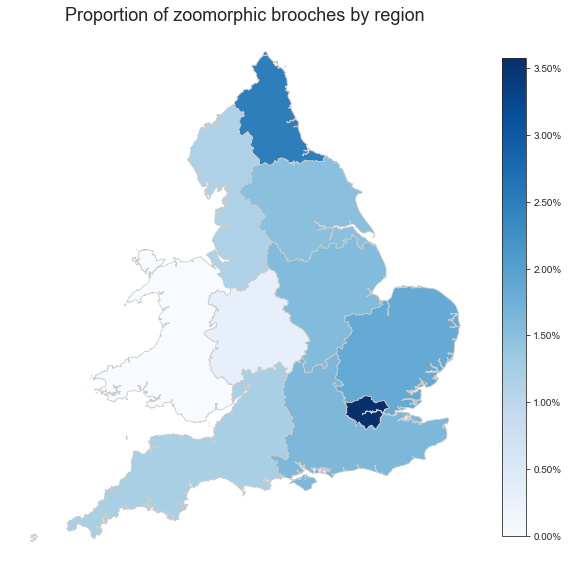

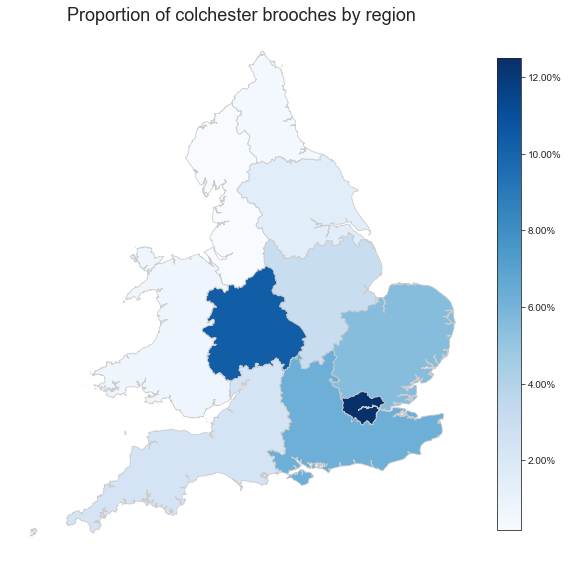

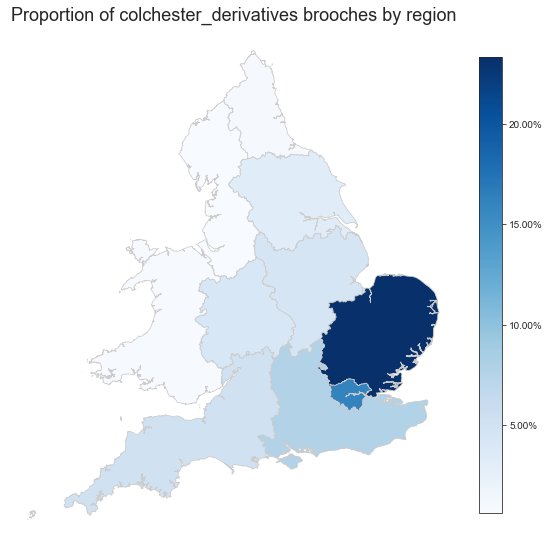

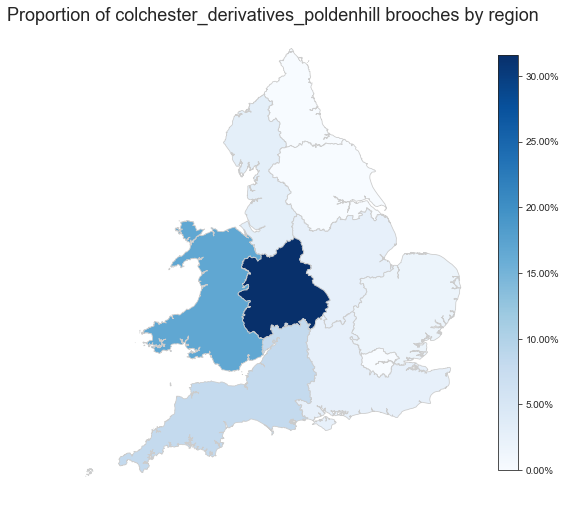

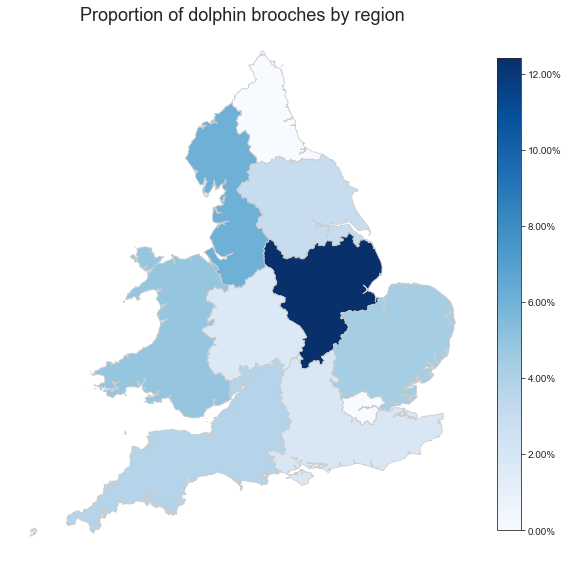

...

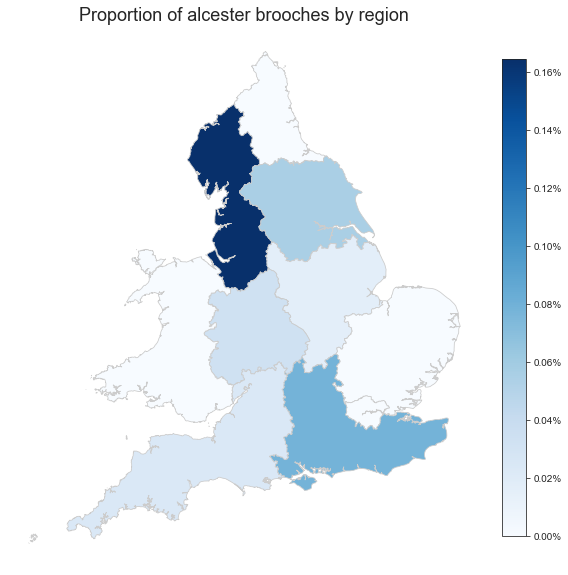

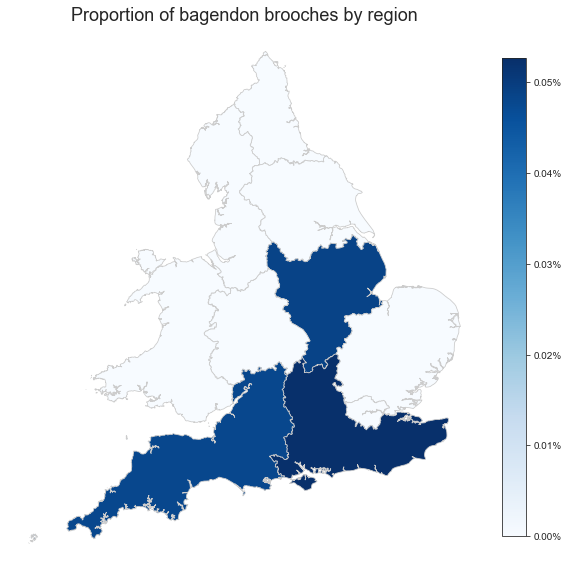

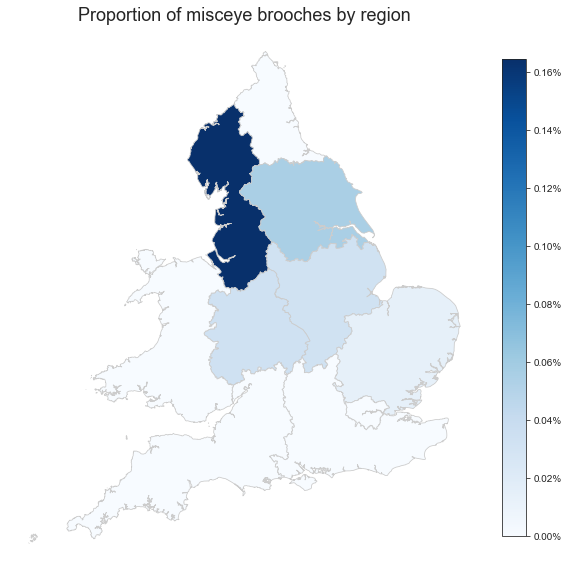

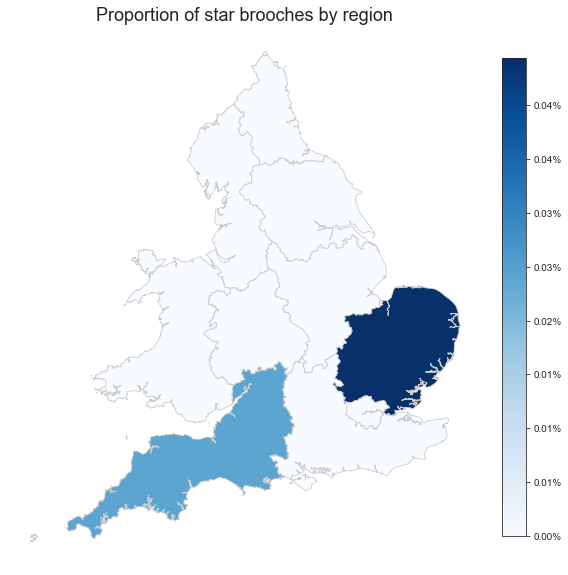

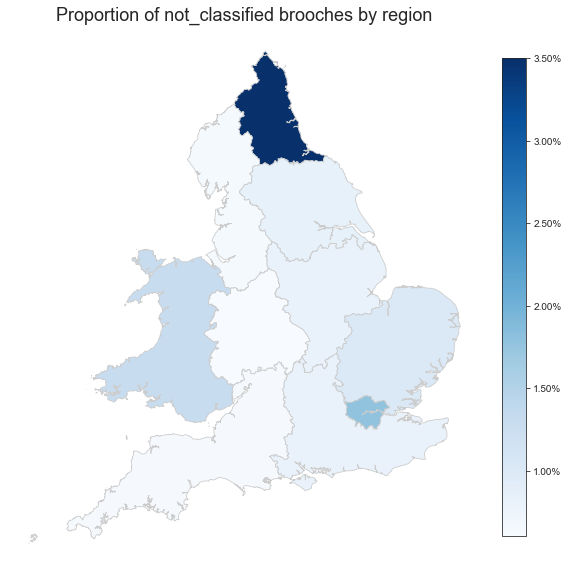

In [1231]:
# set a variable that will call whatever column we want to visualise on the map
#variable = 'zoomorphic'
for variable in MCL:
    # set the range for the choropleth
    vmin, vmax = min(merged[variable]), max(merged[variable])
    # create figure and axes for Matplotlib
    fig, ax = plt.subplots(1, figsize=(8, 10))
    # create map
    merged.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
    ax.axis('off')
    ax.set_title("Proportion of " + str(variable) + ' brooches by region', fontdict={'fontsize': '18', 'fontweight' : '3'})
    # Create colorbar as a legend
    sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    # empty array for the data range
    sm._A = []
    # add the colorbar to the figure
    #cbar.ax.tick_params(labelsize=12)
    plt.colorbar(sm, fraction=0.046, pad=0.04, format='%.2f%%')
    plt.tight_layout()
    plt.savefig(os.path.join('RegionalVariations', str("Regional_Variation_" + variable + '.png')),format = 'png',bbox_inches='tight')
    plt.show()


In [54]:
import webbrowser

In [1227]:
check = 'dolphin'
i=0
for index, row in Roman_brooches.iterrows():
    if i > 3:
        break
    if type(row['classification']) == type('string'):
        if row['classification'].lower() == check:
            if row['objectCertainty'] == 'Certain':
                i+=1
                print(row['classification'])
                filepath = "https://finds.org.uk/database/artefacts/record/id/" + str(row['id'])
                webbrowser.open_new_tab(filepath)
   
        
        
    

Dolphin
dolphin
Dolphin
Dolphin


In [1223]:
Roman_brooches['objectCertainty'].unique()

array(['Certain', 'Possibly', 'Probably', nan], dtype=object)

In [1237]:
x = Roman_brooches['classification'].unique()
for item in x:
    try:
        if 'cross' in item.lower():
            print(item)
    except:
        pass

Crossbow
Crossbow (heavy)
Developed Crossbow brooch
The Crossbow Sequence
proto-Crossbow
Proto-crossbow
crossbow
P shaped Bow brooch sheath footed brooch Pror Crossbow brooch
Crossbow prototype
Proto-Crossbow
'Light' Crossbow
Crossbow brooch
Developed Crossbow
Crossbow (light)
crossbow (heavy)
Crossbow (developed)
Proto Crossbow
Crossbow related
Crossbow variant
developed crossbow
cross bow
bow brooch of Crossbow type
P-shaped or Proto Crossbow
Mackreth 2011, Crossbow 3.3a. Keller 1971, Type 3
CROSSBOW
P-Shaped or Crossbow
Crossbow Brooch precursor
Cross bow
Crossbow type possibly
Heavy crossbow
Cross-bow
Crossbow Brooch
Crossbow/cruciform
Cross-Bow
Crossbow or 'P'-shaped
P-shaped or crossbow
Crossbow - possibly
Cross Bow
P shaped or Proto-Crossbow
Crossbow type
P-shaped or Crossbow
CROSSBOW BROOCH
Crossbow.
crossbow brooch


In [ ]:
TO DO -- SPLIT OUT PROTO-CROSSBOW

In [1311]:
# ------------------------------------------------------------------------------------------------------------
# ------------------------------------------------------------------------------------------------------------
# ------------------------------------------------------------------------------------------------------------
# ---------------------------------------METAL PRODUCTION-----------------------------------------------------
# ------------------------------------------------------------------------------------------------------------
# ------------------------------------------------------------------------------------------------------------
# ------------------------------------------------------------------------------------------------------------

In [44]:
Roman_data['primaryMaterial'].unique()

array(['Copper alloy', 'Ceramic', 'Silver', 'Lead', 'Base Silver',
       'Copper', 'Glass', 'Stone', 'Lead Alloy', nan, 'Gold',
       'Jet or Shale', 'Iron', 'Animal skeletal material', 'Faience',
       'Other', 'Mortar or plaster', 'Gem', 'Flint', 'White metal',
       'Wood', 'Enamel', 'Tin or tin alloy', 'Textile', 'Leather',
       'Yellow metal', 'Pottery', 'Earthenware', 'Tile',
       'Sedimentary rock', 'Igneous rock', 'Pewter', 'Metal',
       'Shell or Coral', 'Brick', 'Metamorphic rock'], dtype=object)

In [1318]:
materials = collections.Counter()
for index, row in Roman_data.iterrows():
    m = row['primaryMaterial']
    materials[m]+=1

In [1319]:
materials.most_common()

[('Copper alloy', 284206),
 ('Silver', 19303),
 ('Ceramic', 10181),
 (nan, 8928),
 ('Pottery', 2696),
 ('Lead', 2494),
 ('Base Silver', 2318),
 ('Lead Alloy', 1059),
 ('Earthenware', 799),
 ('Iron', 531),
 ('Glass', 514),
 ('Gold', 504),
 ('Stone', 341),
 ('Animal skeletal material', 306),
 ('Copper', 194),
 ('Tile', 116),
 ('Other', 62),
 ('Jet or Shale', 50),
 ('Sedimentary rock', 41),
 ('White metal', 35),
 ('Mortar or plaster', 31),
 ('Gem', 23),
 ('Tin or tin alloy', 22),
 ('Faience', 21),
 ('Pewter', 14),
 ('Wood', 13),
 ('Textile', 12),
 ('Leather', 12),
 ('Flint', 10),
 ('Igneous rock', 6),
 ('Enamel', 3),
 ('Metal', 3),
 ('Shell or Coral', 3),
 ('Metamorphic rock', 2),
 ('Yellow metal', 1),
 ('Brick', 1)]

In [1322]:
ironagematerials = collections.Counter()
for index, row in Iron_data.iterrows():
    ironagematerials[row['primaryMaterial']]+=1


In [1323]:
ironagematerials

Counter({'Copper alloy': 18574,
         'Gold': 13812,
         'Silver': 15181,
         'Lead Alloy': 29,
         'Stone': 71,
         'Glass': 65,
         'Ceramic': 1329,
         'Base Silver': 245,
         nan: 383,
         'Other': 6,
         'Iron': 87,
         'Lead': 26,
         'Flint': 23,
         'Copper': 12,
         'Mortar or plaster': 1,
         'Tin or tin alloy': 24,
         'Wood': 6,
         'Animal skeletal material': 17,
         'Textile': 2,
         'White metal': 3,
         'Pottery': 177,
         'Earthenware': 85,
         'Sedimentary rock': 11,
         'Igneous rock': 2,
         'Jet or Shale': 3})

In [1327]:
len(Iron_data)

50174

In [40]:
coin_timespan = collections.Counter()
coin_matsA = collections.Counter()
coin_matsB = collections.Counter()
coin_weight = collections.Counter()
obj_timespan = collections.Counter()
obj_matsA = collections.Counter()
obj_matsB = collections.Counter()
obj_weight = collections.Counter()
for index, row in Iron_data.iterrows():
    start = float(row['numdate1'])
    end = float(row['numdate2'])
    matA = row['primaryMaterial']
    matB = row['secondaryMaterial']
    if row['objecttype'].lower() == 'coin':
        coin_timespan[str(abs(end - start))]+=1
        coin_matsA[matA]+=1
        coin_matsB[matB]+=1
        coin_weight[row['weight']]+=1
    else:
        obj_timespan[str(abs(end - start))]+=1
        obj_matsA[matA]+=1
        obj_matsB[matB]+=1
        obj_weight[row['weight']]+=1
    

In [43]:
# BUCKETS IMPLEMENTATION
bckts = make_buckets(0, 500, 100)
results = {}

N = 0
for item in bckts:
    # other, silver&lead, copper, copper_weights
    results[item] = [0,0,0,[]]
for index, row in Roman_data.iterrows():
    if row['objecttype'].lower() == 'coin':
        start = float(row['numdate1'])
        end = float(row['numdate2'])
        matA = row['primaryMaterial']
        if type(matA) == type('string'):
            if matA.lower() == 'silver' or matA.lower() == 'base silver' or matA.lower() == 'lead' or matA.lower() == 'lead alloy':
                index = 1
            elif matA.lower() == 'copper' or matA.lower() == 'copper alloy':
                index = 2
            else:
                index = 0
            for i in range(len(bckts)-1):
                if bckts[i] <= start and bckts[i+1] >= end:
                    results[bckts[i]][index]+=1
                    if index==2:
                        results[bckts[i]][3].append(row['weight'])
                    N+=1
print(N)
    #matA = row['primaryMaterial']

204362


In [2411]:
for item in results:
    stem = str(item)
    for n in results[item]:
        stem = stem + ',' + str(n)
    print(stem)

0,267,48,9805,[49.39, 8.25, 5.83, nan, 9.9, 7.2, nan, nan, nan, 7.02, 2.06, nan, nan, 7.97, 3.5, 2.89, 8.3, 18.69, 2.53, nan, nan, 2.73, 4.11, 3.1, 1.97, 7.14, 3.31, 3.2, nan, nan, nan, 2.44, 7.68, 1.74, 3.4, 3.5, 2.5, 5.45, 3.01, 3.87, 2.45, 10.44, 4.26, 2.7, 1.6, 6.8, 6.7, 3.94, nan, nan, 2.32, 7.15, 3.0, 1.24, 4.77, 3.5, 4.41, 2.61, 2.22, 1.5, 2.48, 6.36, 13.0, 4.59, 2.34, 7.85, 6.98, 3.59, 7.67, 12.8, 4.8, 3.4, 2.5, 20.7, 5.84, 2.45, 21.0, 10.33, 15.7, 2.58, nan, nan, 4.4, 1.86, 3.54, 15.34, 2.65, 8.06, nan, nan, 8.0, 4.22, 3.04, nan, 4.69, 2.8, 5.63, 20.7, 2.36, 7.4, 1.7, 3.2, 9.04, 5.36, 6.88, 5.45, 3.1, 24.65, 5.63, 3.28, 12.45, 9.16, 14.27, 4.68, 17.05, 15.2, 0.97, 14.03, 3.8, 11.73, 3.19, 4.95, 9.66, 7.05, 2.11, 1.29, 9.0, 5.58, 16.45, 6.7, 10.72, 3.65, 1.36, 13.9, 1.41, nan, 0.53, 36.7, 7.07, 5.53, 12.98, 8.9, 2.64, 2.23, 6.35, 4.44, 3.18, 1.53, nan, 5.92, nan, nan, 2.23, 10.8, 6.5, 1.31, 3.5, 9.7, 3.4, 1.9, 8.7, 1.13, 18.97, 2.3, 18.75, 12.79, 11.79, 1.55, 13.15, 4.0, 1.24, 

In [2442]:
for item in results:
    cweights = results[item][3]
    keep = []
    for c in cweights:
        if not np.isnan(c):
            keep.append(c)
    print(str(len(keep)) + "   " + str(sum(keep)/len(keep)))


tmp = results[100][3]
tmp.sort()
print(tmp)
#test = []
#for item in tmp:
#    if not np.isnan(item):
#        test.append(item)
#        if item >200:
#            print(item)
#160,000 + 11,500 = 171,500 (two large objects in dataset that should be removed)
#print('---')
#print(sum(test))
#print(len(test))
#print(sum(test)/len(test))
#print(test)

2383   8.24556567352077
6888   14.429348141695701
35221   2.140192385224724
78020   1.9202665278133813
34   1.7479411764705883
21   2.090952380952381
0   nan
[nan, 18.3, 20.23, nan, nan, nan, nan, nan, nan, nan, nan, nan, 4.28, 6.37, 8.23, 15.59, 20.97, nan, 5.8, 14.31, 17.06, 17.75, 20.36, 21.2, 24.18, 28.18, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, 2.6, 3.66, 5.68, 9.79, nan, 3.92, 5.48, 8.63, 9.11, 9.69, 9.83, 10.5, 16.01, nan, 10.01, 10.75, 11.3, 13.06, 13.37, 13.69, 15.6, 16.15, 16.68, 16.86, 17.05, 18.62, 19.85, 22.7, nan, nan, nan, 17.61, 18.2, 20.0, 20.54, 24.6, nan, 0.97, 1.73, 2.8, 5.44, 5.87, 6.34, 6.95, 7.54, 8.08, 8.1, 8.61, 9.05, 10.5, 12.5, 13.32, 15.21, 16.29, 16.55, 18.3, 27.09, 29.5, nan, nan, nan, nan, nan, 19.39, 19.42, 20.06, 20.12, 20.88, 21.29, 22.56, 23.62, 24.89, nan, nan, nan, 4.54, nan, nan, nan, nan, nan, 2.84, 3.35, 7.53, 8.19, 8.47, 8.76, 9.19, 10.7, 11.01, 12.01, 12.7, 13.15, 13.75, 15.0, 15.42, 15.8, 16.0, 16.17, 17.57, 17.78, 20.66, 21.89,

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in double_scalars
  import sys


In [2504]:
weights = []
b0 = []
b1 = []
b2 = []
b3 = []
b4 = []
b5=[]
b6=[]
b7=[]
b8=[]
b9=[]
for index, row in BRITISHCOINS.iterrows():
    if not np.isnan(row['weight']):
        if (row['primaryMaterial'] == 'Silver') or (row['primaryMaterial'] == 'Base Silver') or (row['primaryMaterial'] == 'Lead') or (row['primaryMaterial']=='Lead Alloy'):
        #if (row['primaryMaterial']=='Copper') or (row['primaryMaterial']=='Copper alloy'):
            start = row['numdate1']
            end = row['numdate2']
            weight = row['weight']
            if (not np.isnan(start)) and (not np.isnan(end)) and (weight <= 1000):
                if (0<=start) and (end<=50):
                    b0.append(weight)
                if (50<=start) and (end<=100):
                    b1.append(weight)
                if (100<=start) and (end<=150):
                    b2.append(weight)
                if (150<=start) and (end<=200):
                    b3.append(weight)
                if (200<=start) and (end<=250):
                    b4.append(weight)
                if (250<=start) and (end<=300):
                    b5.append(weight)
                if (300<=start) and (end<=350):
                    b6.append(weight)
                if (350<=start) and (end<=400):
                    b7.append(weight)
                if (400<=start) and (end<=450):
                    b8.append(weight)
                if (450<=start) and (end<=500):
                    b9.append(weight)

In [2505]:
bkts=[b0,b1,b2,b3,b4,b5,b6,b7,b8,b9]
for t in bkts:
    print(str(len(t)) + ',' + str(sum(t)/len(t)))

26,1.1573076923076924
1,3.19
0,nan
0,nan
0,nan
42,3.4509523809523803
7,2.8685714285714288
0,nan
0,nan
0,nan


//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


In [19]:
ALL_DATA = pd.concat([Iron_data, Roman_data])
COINS = ALL_DATA[ALL_DATA['objecttype']=='COIN']
NONCOINS = ALL_DATA[ALL_DATA['objecttype']!='COIN']

In [13]:
temp = ALL_DATA[['fourFigureLat', 'fourFigureLon']]

In [17]:
temp.to_excel('all_PAS_IronRoman_LatLons.xlsx')

In [20]:
COINS['primaryMaterial'].unique()

array(['Gold', 'Silver', 'Copper alloy', 'Base Silver', nan, 'Copper',
       'Iron', 'Lead Alloy', 'Tin or tin alloy', 'Lead', 'Other',
       'White metal', 'Metal'], dtype=object)

In [46]:
MP_iron_coin_metals = {}
MP_roman_coin_metals = {}
MP_iron_obj_metals = {}
MP_roman_obj_metals = {}

In [52]:
MP_ALLCOINS = {}

In [47]:
MP_BRITISH_COINS = {}

In [72]:
Silver_Weights = {}
Copper_Weights = {}
Gold_Weights = {}
for i in range (-400,451):
    Silver_Weights[i] = []
    Copper_Weights[i] = []
    Gold_Weights[i] = []
for index, row in COINS.iterrows():
    if row['objecttype'].lower()=='coin':
        start = float(row['numdate1'])
        end = float(row['numdate2'])
        matA = row['primaryMaterial']
        weight = row['weight']
        timespan = abs(end - start)
        if (timespan <= 25) and (not np.isnan(weight)):
            midpoint = round((end + start) / 2)
            if type(matA) == type('string'):
                try:
                    if matA.lower() == 'silver' or matA.lower() == 'base silver':
                        Silver_Weights[midpoint].append(weight)
                    elif matA.lower() == 'copper' or matA.lower() == 'copper alloy':
                        Copper_Weights[midpoint].append(weight)
                    elif matA.lower() == 'gold':
                        Gold_Weights[midpoint].append(weight)
                except:
                    pass
                    

In [66]:
def avg(lst):
    return sum(lst)/len(lst)

In [71]:
outfile = open('material_weights.csv', 'w')
writer = csv.writer(outfile)
writer.writerow(['Year', 'Silver', 'Copper', 'Gold'])
for i in range(-400, 451):
    try:
        s = avg(Silver_Weights[i])
    except:
        s = 0
    try:
        c = avg(Copper_Weights[i])
    except:
        c = 0
    try:
        g = avg(Gold_Weights[i])
    except:
        g = 0
    writer.writerow([i, s, c, g])
outfile.close()

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in double_scalars
  


In [89]:
regional_coin_splits = {}
for mat in ['silver', 'copper', 'gold']:
    regional_coin_splits[mat] = {}
    for reg in ALL_REGIONS:
        regional_coin_splits[mat][reg] = {}
        for i in range(-400, 451):
            regional_coin_splits[mat][reg][i] = 0

In [90]:
# MIDPOINTS IMPLEMENTATION
midpoints_all = collections.Counter()
midpoints_silver = collections.Counter()
midpoints_lead = collections.Counter()
midpoints_copper = collections.Counter()
midpoints_gold = collections.Counter()
N = 0
for index, row in COINS.iterrows():
    if row['objecttype'].lower() == 'coin':
        start = float(row['numdate1'])
        end = float(row['numdate2'])
        matA = row['primaryMaterial']
        timespan = abs(end - start)
        if timespan <= 25:
            midpoint = round((end + start) / 2)
            midpoints_all[midpoint]+=1
            N+=1
            if (type(matA) == type('string')) and (midpoint <= 450):
                if matA.lower() == 'silver' or matA.lower() == 'base silver':
                    #midpoints_silver[midpoint]+=1 # <--- Quantity of Records
                    #midpoints_silver[midpoint]+=avg(Silver_Weights[midpoint] # <--- Weight
                    midpoints_silver[midpoint]+=avg(Silver_Weights[midpoint])*row['quantity'] #<--- Weight * Coins * Records
                    try:
                        regional_coin_splits['silver'][row['region']][midpoint]+=avg(Silver_Weights[midpoint])*row['quantity']
                    except:
                        regional_coin_splits['silver']['other'][midpoint]+=avg(Silver_Weights[midpoint])*row['quantity']
                #elif matA.lower() == 'lead' or matA.lower() == 'lead alloy':
                #    midpoints_lead[midpoint]+=avg(Silver_Weight[midpoint])
                elif matA.lower() == 'copper' or matA.lower() == 'copper alloy':
                    midpoints_copper[midpoint]+=avg(Copper_Weights[midpoint])*row['quantity']
                    try:
                        regional_coin_splits['copper'][row['region']][midpoint]+=avg(Copper_Weights[midpoint])*row['quantity']
                    except:
                        regional_coin_splits['copper']['other'][midpoint]+=avg(Copper_Weights[midpoint])*row['quantity']
                    
                elif matA.lower() == 'gold':
                    midpoints_gold[midpoint]+=avg(Gold_Weights[midpoint])*row['quantity']
                    try:
                        regional_coin_splits['gold'][row['region']][midpoint]+=avg(Gold_Weights[midpoint])*row['quantity']
                    except:
                        regional_coin_splits['gold']['other'][midpoint]+=avg(Gold_Weights[midpoint])*row['quantity']
                    
print(N)

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in double_scalars
  


209483


In [79]:
for item in midpoints_all:
    #stem = (str(item) + ',' + str(midpoints_all[item]))
    year = item
    total = midpoints_all[item]
    try:
        #stem = stem + ',' + str(midpoints_silver[item])
        silver = midpoints_silver[item]
    except:
        #stem = stem + ',0'
        #out.append(0)
        silver = 0
    try:
        #stem = stem + ',' + str(midpoints_lead[item])
        #out.append(midpoints_lead[item])
        lead = midpoints_lead[item]
    except:
        #stem = stem + ',0'
        #out.append(0)
        lead = 0
    try:
        #stem = stem + ',' + str(midpoints_copper[item])
        #out.append(midpoints_copper[item])
        copper = midpoints_copper[item]
    except:
        #stem = stem + ',0'
        #out.append(0)
        copper = 0
    try:
        gold = midpoints_gold[item]
    except:
        gold = 0
    #print(stem)
    MP_ALLCOINS[year] = {'all': total, 'silver': silver, 'lead': lead, 'copper': copper, 'gold':gold}

In [93]:
outfile = open('regional_coin_split.csv', 'w')
writer=csv.writer(outfile)
tmp = ['Region/Signal']
for i in range(-400,451):
    tmp.append(i)
writer.writerow(tmp)

for reg in ALL_REGIONS:
    print(reg)
    Svals = regional_coin_splits['silver'][reg]
    Cvals = regional_coin_splits['copper'][reg]
    Gvals = regional_coin_splits['gold'][reg]
    new_row = [(str(reg) + "_silver")]
    for i in range(-400, 451):
        new_row.append(Svals[i])
    writer.writerow(new_row)
    new_row = [(str(reg) + "_copper")]
    for i in range(-400, 451):
        new_row.append(Cvals[i])
    writer.writerow(new_row)
    new_row = [(str(reg) + "_gold")]
    for i in range(-400, 451):
        new_row.append(Gvals[i])
    writer.writerow(new_row)
    

outfile.close()
#for region in Svals:
#    tmp = Svals[region]

North West
North East
Yorkshire and the Humber
Wales
West Midlands
East Midlands
Eastern
South East
London
South West
other


In [56]:
c = 0
s = 0
g = 0
for index, row in COINS.iterrows():
    if (row['primaryMaterial'] == 'Copper') or (row['primaryMaterial'] == 'Copper alloy'):
        c+=1
    elif (row['primaryMaterial'] == 'Silver') or (row['primaryMaterial'] == 'Base Silver'):
        s+=1
    elif (row['primaryMaterial'] == 'Gold'):
        g+=1
print(c)
print(s)
print(g)

244627
35710
13801


In [2513]:
BRITISHCOINS['primaryMaterial'].unique()

array(['Gold', 'Silver', 'Copper alloy', nan, 'Copper', 'Base Silver'],
      dtype=object)

In [80]:
for item in MP_ALLCOINS:
    stem = str(item) + ',' + str(MP_ALLCOINS[item])
    print(stem)

-70,{'all': 59, 'silver': 8.535, 'lead': 0, 'copper': 8.47, 'gold': 154.76727272727263}
-55,{'all': 173, 'silver': 46.415, 'lead': 0, 'copper': 55.51999999999999, 'gold': 694.7832444444446}
32,{'all': 93, 'silver': 52.754838709677365, 'lead': 0, 'copper': 77.06000000000002, 'gold': 47.26583333333336}
-38,{'all': 52, 'silver': 37.644, 'lead': 0, 'copper': 36.36000000000001, 'gold': 26.300000000000004}
-50,{'all': 82, 'silver': 42.21, 'lead': 0, 'copper': 39.96062500000001, 'gold': 161.89000000000019}
52,{'all': 59, 'silver': 43.60363636363638, 'lead': 0, 'copper': 252.44709677419337, 'gold': 14.939999999999998}
-35,{'all': 32, 'silver': 1.04, 'lead': 0, 'copper': 26.8125, 'gold': 35.48571428571429}
-88,{'all': 25, 'silver': 21.665, 'lead': 0, 'copper': 18.92, 'gold': 7.4}
-52,{'all': 64, 'silver': 54.08666666666665, 'lead': 0, 'copper': 15.669999999999996, 'gold': 81.72576923076926}
-22,{'all': 29, 'silver': 16.464705882352938, 'lead': 0, 'copper': 16.839999999999996, 'gold': 13.42}
-11

In [1390]:
results

{-400: 0,
 -350: 1,
 -300: 0,
 -250: 1,
 -200: 37,
 -150: 160,
 -100: 705,
 -50: 1357,
 0: 1229,
 50: 62,
 100: 26,
 150: 0}

In [2378]:
for i in range(len(bckts)-1):
    print(str(bckts[i]) + " to " + str(bckts[i+1]))

0 to 50
50 to 100
100 to 150
150 to 200
200 to 250
250 to 300
300 to 350
350 to 400
400 to 450
450 to 500


In [42]:
def make_buckets(start, end, size):
    out = []
    out.append(start)
    current = start
    while current < end:
        current+= size
        out.append(current)
    out.append(current+size)
    return(out)

In [1366]:
make_buckets(-500, 100, 100)

[-500, -400, -300, -200, -100, 0, 100, 200]

In [41]:
def classify_iron(c_o):
    if type(c_o) != type('string'):
        return "NaN"
    else:
        c = c_o.lower()
        if 'colchester' in c:
            return 'colchester'
        elif ('tene' in c) or ('t√®ne' in c) or ('t√©ne' in c) or ('ten√©' in c) or ('ten√®' in c):
            if ('iii' in c):
                return 'lateneIII'
            elif ('ii' in c):
                return 'lateneII'
            elif ('i' in c):
                return 'lateneI'
            else:
                return 'misclatene'
        elif (('langton' in c) or ('langdon' in c) or ('langon' in c) or ('lanton' in c)) and ('down' in c):
            return 'langtondown'
        elif ('rose' in c) or ('rosse' in c):
            return 'rosette'
        elif ('nauheim' in c) or ('nauhiem' in c) or ('nanheim' in c):
            return 'nauheim'
        elif ('bird' in c) and ('lip' in c):
            return 'birdlip'
        elif ('penannular' in c) or ('penanular' in c) or ('pennanular' in c) or ('pennannular' in c):
            return 'penannular'
        elif ('aucissa' in c):
            return 'aucissa'
        elif ('strip' in c):
            return 'strip'
        elif ('lion' in c) or ('leon' in c):
            return 'lion'
        elif ('bow' in c):
            return 'bow'
        elif ('knee' in c):
            return 'knee'
        elif ('alesia' in c):
            return 'alesia'
        elif ('hod' in c) and ('hill' in c):
            return 'hodhill'
        elif ('dragon' in c):
            return 'dragonesque'
        elif ('aesica' in c):
            return 'aesica'
        elif ('knot' in c):
            return 'knoten'
        elif ('plate' in c):
            return 'plate'
        elif ('mackreth' in c):
            return 'miscmack'
        elif ('lowbury' in c):
            return 'lowbury'
        elif ('drahtfibel' in c):
            return 'drahtfibel'
        elif ('hawkes' in c) and ('hull' in c):
            return 'hawkeshull'
        elif ('adam' in c):
            return 'adam'
        elif ('fibula' in c):
            return 'fibula'
        elif ('one' in c) and ('piece' in c):
            return 'onepiece'
        elif ('dolphin' in c):
            return 'dolphin'
        elif ('hallstatt' in c) or ('halstat' in c):
            return 'hallstatt'
        elif ('fowler' in c):
            return 'fowler'
        elif ('2bb2' in c):
            return '2bb2'
        elif ('trumpet' in c):
            return 'trumpet'
        elif ('eye' in c):
            return 'eye'
        elif ('knick' in c):
            return 'knickfibel'
        elif ('1b' in c):
            return '1b'
        elif ('thistle' in c):
            return 'thistle'
        elif ('glaston' in c):
            return 'glastonbury'
        elif ('umbon' in c):
            return 'umbonate'
        elif ('polden' in c):
            return 'polden'
        elif ('feug' in c):
            return 'feugere'
        elif ('LT' in c_o):
            return 'misclatene' # add these to la tene's
        elif ('bagendon' in c):
            return 'bagendon'
        else:
            return 'ungrouped'
        

In [56]:
ungrouped = collections.Counter()
iron_classes = collections.Counter()
for index, row in Iron_data.iterrows():
    if 'BROOCH' in row['objecttype']:
        c = classify_iron(row['classification'])
        iron_classes[c]+=1
        if c == 'ungrouped':
            ungrouped[row['classification']]+=1
print(iron_classes)
print("--------")
print(ungrouped)

Counter({'colchester': 790, 'NaN': 667, 'langtondown': 369, 'lateneIII': 285, 'nauheim': 241, 'lateneI': 181, 'rosette': 139, 'penannular': 91, 'strip': 90, 'misclatene': 85, 'bow': 76, 'birdlip': 66, 'aucissa': 40, 'onepiece': 30, 'miscmack': 23, 'ungrouped': 20, 'lion': 18, 'knoten': 18, '2bb2': 14, 'lateneII': 13, 'hawkeshull': 12, 'adam': 11, 'alesia': 10, 'drahtfibel': 9, 'aesica': 9, 'plate': 8, 'dragonesque': 8, 'lowbury': 8, 'hodhill': 8, 'eye': 4, 'hallstatt': 4, 'trumpet': 4, 'feugere': 3, '1b': 3, 'glastonbury': 3, 'fibula': 3, 'thistle': 2, 'dolphin': 2, 'fowler': 1, 'knickfibel': 1, 'bagendon': 1, 'umbonate': 1, 'polden': 1, 'knee': 1})
--------
Counter({'Early Hinged': 1, 'Bunwell Type': 1, 'Group L': 1, 'annular': 1, 'Involute': 1, 'Simple Gaulish': 1, 'Wheel': 1, 'T-shape': 1, 'Continental': 1, 'Equal armed': 1, 'Type 2L': 1, 'Wire': 1, 'S-form': 1, 'Pin': 1, 'pin': 1, 'unclassified': 1, 'Simple Gallic': 1, 'Type 2A': 1, 'single piece': 1, 'leaf type': 1})


In [42]:
Iron_brooches = Iron_data.loc[Iron_data['objecttype'].isin(["BROOCH", "BOW BROOCH", "PLATE BROOCH", "PENANNULAR BROOCH"])]


In [1510]:
def aesthetics_by_class_iron(region):
    class_counter = collections.Counter()
    cfam_counter = collections.Counter()
    for index, row in Iron_brooches.iterrows():
        if row['region'] == region:
            class_counter[row['classification']]+=1
    for c in class_counter:
        cfam_counter[classify_iron(c)] += class_counter[c]
        #print(str(c) + "---->" + str(classify_iron(c)))
    return cfam_counter
    

In [1511]:
def compare_regional_aesthetics_by_class_iron():
    outfile = open('Regional_Aesthetics_Iron.csv', 'w')
    writer = csv.writer(outfile)
    
    title_row = ['region']
    for class_family in iron_classes:
        title_row.append(class_family)
    writer.writerow(title_row)
    
    for region in Iron_brooches['region'].unique():
        new_row = []
        if type(region) == type('string'):
            new_row = [region]
            classcounts = aesthetics_by_class_iron(region)
            for class_family in iron_classes:
                new_row.append(classcounts[class_family])
        writer.writerow(new_row)
    outfile.close()

In [1512]:
compare_regional_aesthetics_by_class_iron()

In [1526]:
fp = "NUTS_Level_1_January_2018_Super_Generalised_Clipped_Boundaries_in_the_United_Kingdom.shx"
map_df = gpd.read_file(fp)
map_df['name'] = ['North East','North West','Yorkshire and the Humber','East Midlands',
                  'West Midlands','Eastern','London','South East','South West','Wales','Scotland', 'Northern Ireland']
# drop, ireland, scotland, wales, london, north east, north west
map_df = ((((((map_df.drop(11)).drop(10)).drop(9)).drop(6)).drop(1)).drop(0))
geodf = pd.read_excel(r'Regional_Aesthetics_Iron.xlsm', sheet_name='no_N_L_W')
merged = map_df.set_index('name').join(geodf.set_index('region'))
merged

,geometry,colchester,fowler,lateneI,misclatene,nauheim,lateneIII,strip,rosette,NaN,...,knickfibel,thistle,glastonbury,bagendon,fibula,dolphin,trumpet,umbonate,polden,knee
name,,,,,,,,,,,,,,,,,,,,,
Yorkshire and the Humber,"MULTIPOLYGON (((479381.800 518245.500, 479975....",17.112299,0.534759,3.208556,4.812834,4.278075,10.695187,0.534759,0.000000,19.786096,...,0.000000,0.00000,0.534759,0.000000,0.534759,0.534759,0.534759,0.534759,0.000000,0.000000
East Midlands,"MULTIPOLYGON (((512490.996 414654.696, 512679....",23.514851,0.000000,1.732673,3.465347,5.198020,12.871287,0.000000,2.475248,11.138614,...,0.000000,0.49505,0.000000,0.000000,0.000000,0.000000,0.247525,0.000000,0.000000,0.000000
West Midlands,"POLYGON ((404258.203 368301.504, 406240.101 36...",18.095238,0.000000,9.523810,2.857143,6.666667,9.523810,0.000000,0.952381,17.142857,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,1.904762,0.000000,0.000000,0.000000
Eastern,"MULTIPOLYGON (((600563.482 346526.146, 600790....",30.537229,0.000000,3.958530,2.639020,6.597549,5.089538,0.282752,7.822809,16.588124,...,0.000000,0.00000,0.094251,0.094251,0.188501,0.094251,0.000000,0.000000,0.094251,0.000000
South East,"MULTIPOLYGON (((493459.103 253084.405, 493776....",19.567456,0.000000,6.179197,1.647786,10.916581,9.062822,1.853759,3.604531,26.467559,...,0.102987,0.00000,0.102987,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.102987
South West,"MULTIPOLYGON (((417496.201 243875.101, 418009....",20.842105,0.000000,10.315789,2.105263,4.210526,10.736842,13.473684,0.842105,16.842105,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


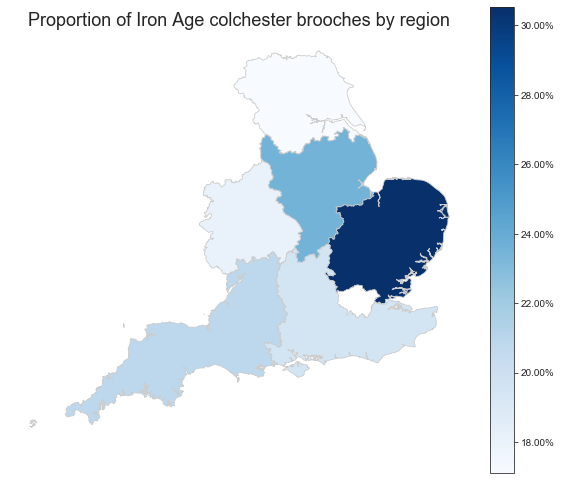

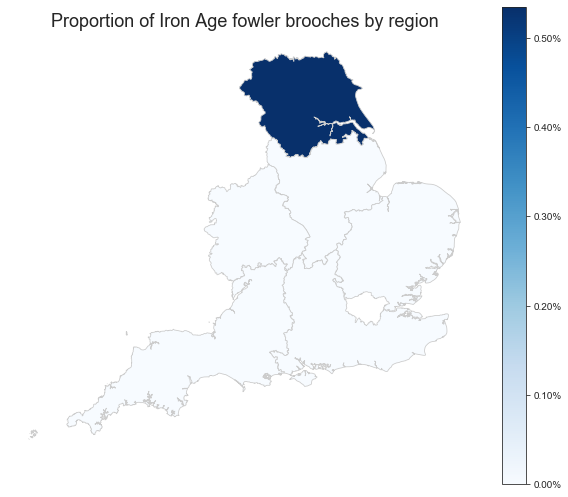

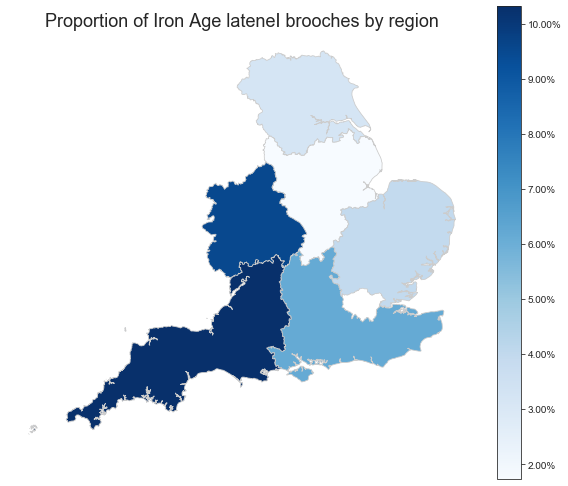

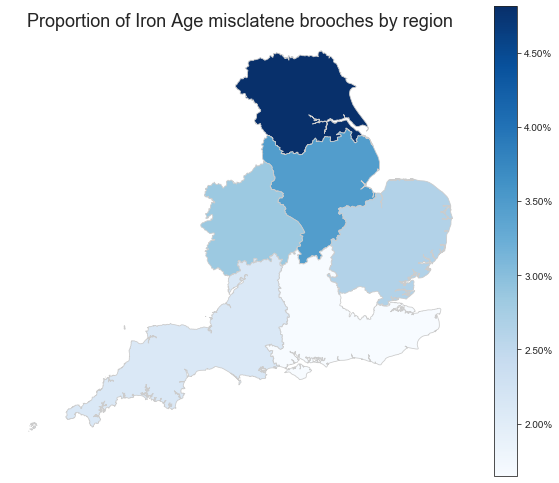

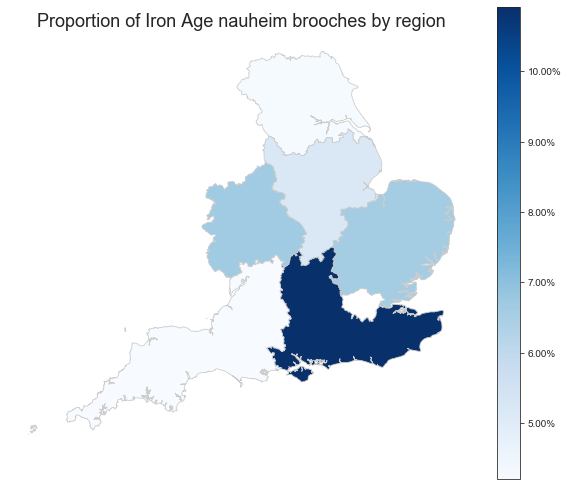

...

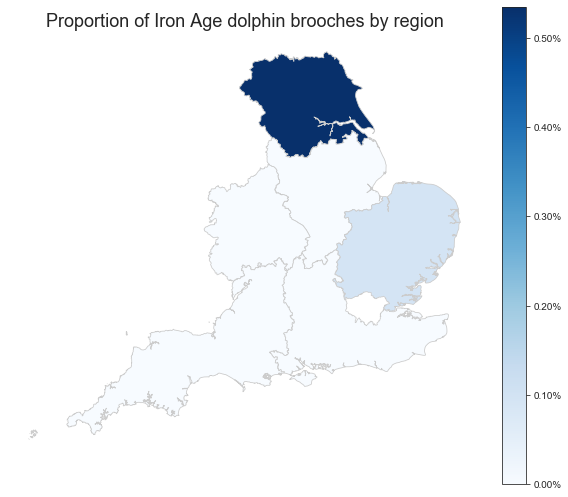

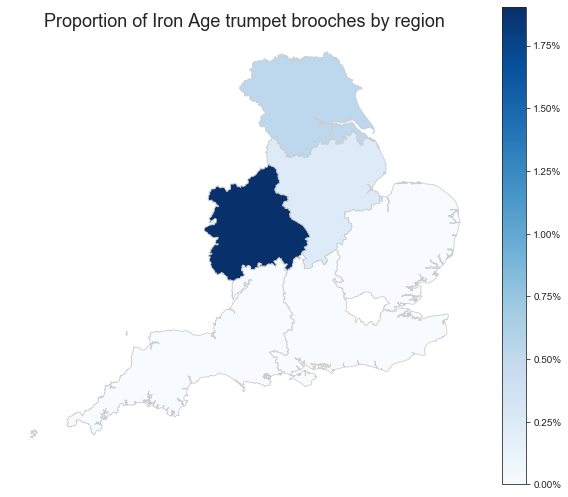

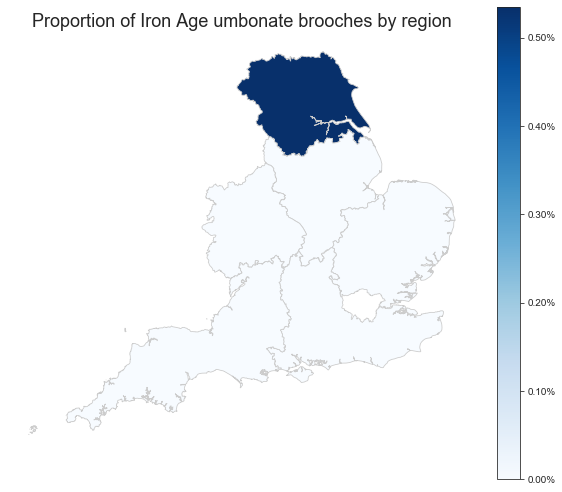

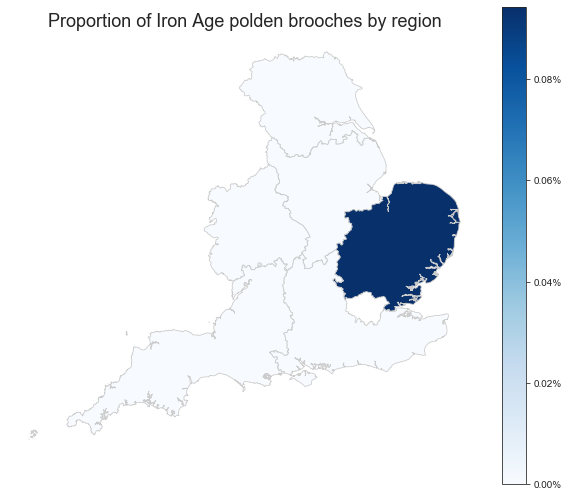

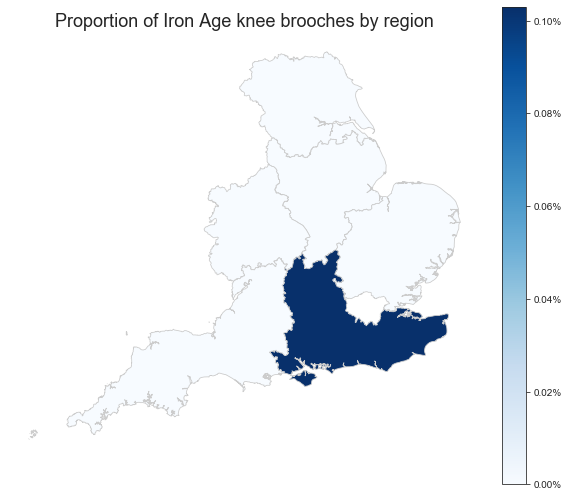

In [1770]:
# set a variable that will call whatever column we want to visualise on the map
#variable = 'zoomorphic'
for variable in iron_classes:
    # set the range for the choropleth
    vmin, vmax = min(merged[variable]), max(merged[variable])
    # create figure and axes for Matplotlib
    fig, ax = plt.subplots(1, figsize=(8, 10))
    # create map
    merged.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
    ax.axis('off')
    ax.set_title("Proportion of Iron Age " + str(variable) + ' brooches by region', fontdict={'fontsize': '18', 'fontweight' : '3'})
    # Create colorbar as a legend
    sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    # empty array for the data range
    sm._A = []
    # add the colorbar to the figure
    #cbar.ax.tick_params(labelsize=12)
    plt.colorbar(sm, fraction=0.046, pad=0.04, format='%.2f%%')
    plt.tight_layout()
    plt.savefig(os.path.join('RegionalVariationsIron_no_small', str("Regional_Variation_" + variable + '.png')),format = 'png',bbox_inches='tight')
    plt.show()


In [1537]:
import matplotlib.lines as mlines
import matplotlib.transforms as mtransforms

In [1841]:
def create_object_timeline(obj_list):
    report={"<=50":0,"<=100":0, ">100":0}
    xs = []
    ys = []
    for row in obj_list:
        if not np.isnan(row['numdate1']) and not np.isnan(row['numdate2']):
            xs.append(row['numdate1'])
            ys.append(row['numdate2'])
    fig, ax = plt.subplots()
    ax.scatter(xs, ys, c='black')
    ax.plot((0,max(xs)),(0,max(xs)), color='green')
    ax.plot((-50,max(xs)),(0,max(xs)+50), color='blue')
    ax.plot((-100,max(xs)),(0,max(xs)+100), color='red')
    plt.xlim(xmin=-300, xmax=max(xs))
    plt.ylim(ymin=0, ymax=max(ys))
    for i in range(len(xs)):
        gap = abs(ys[i]-xs[i])
        if gap<=50:
            report['<=50']+=1
        elif gap<=100:
            report['<=100']+=1
        else:
            report['>100']+=1
    valx = 0.55*max(xs)
    valy=0.2*max(ys)
    plt.text(valx,0.8*valy, "<=50 yr gap: " + str(report['<=50']) + "  ({0:.1f}%)".format(100*report['<=50']/len(xs)), fontsize=15, color='green')
    plt.text(valx,valy, "51-100yr gap: " + str(report['<=100']) + "  ({0:.1f}%)".format(100*report['<=100']/len(xs)), fontsize=15, color='blue')
    plt.text(valx,1.2*valy, ">100yr gap: " + str(report['>100']) + "  ({0:.1f}%)".format(100*report['>100']/len(xs)), fontsize=15, color='red')
    plt.show()
    
        

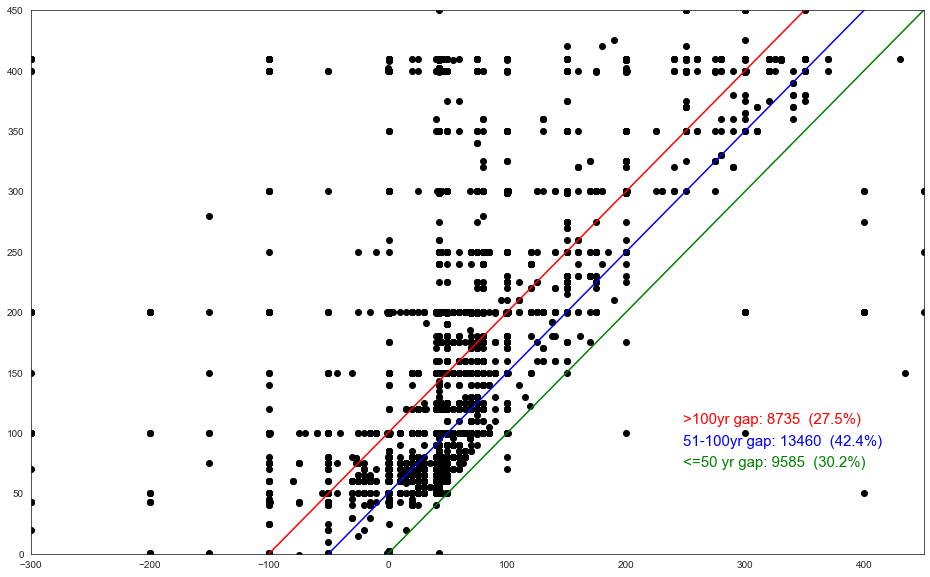

In [1842]:
subset = []
for index, row in ALL_BROOCHES.iterrows():
    #if abstract(row['classification']) == 'colchester_derivatives':
    if row['numdate2'] <= 450 and row['numdate1'] <= 450:
        subset.append(row)
create_object_timeline(subset)

In [1652]:
Roman_brooches['completeness'].unique()

array(['Incomplete', 'Fragment', 'Complete', 'Uncertain', nan],
      dtype=object)

In [1653]:
st = collections.Counter()
for index, row in Roman_brooches.iterrows():
    st[row['completeness']]+=1
print(st)

Counter({'Incomplete': 18385, 'Fragment': 5115, nan: 3659, 'Complete': 2544, 'Uncertain': 48})


,id,old_findID,uniqueID,objecttype,classification,subclass,length,height,width,weight,...,calc_weight,calc_thickness,calc_numdate1,calc_numdate2,calc_dateBucket,calc_fourFigureLat,calc_fourFigureLat_zoom,calc_fourFigureLon,calc_fourFigureLon_zoom,calc_broadDateBucket
9,966029,SOM-C31BB1,PAS5D4C31BB001091,BROOCH,Colchester two piece,NaN,72.90,NaN,22.40,20.09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,966002,NLM-C2181B,PAS5D4C2181001B86,PENANNULAR BROOCH,Fowler Type A3,Mackreth type PEN k3.a,NaN,NaN,NaN,18.54,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,965892,SOM-BEBE89,PAS5D4BEBE80019D0,BROOCH,Colchester one piece,NaN,41.00,NaN,10.90,4.68,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,965887,SOM-BE68EB,PAS5D4BE68E001C01,BROOCH,La T√®ne I,NaN,48.10,NaN,4.90,4.88,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26,964389,NARC-9CF605,PAS5D39CF600014E8,BROOCH,Colchester one Piece,NaN,42.24,NaN,15.42,4.20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28,964235,PUBLIC-98B3F9,PAS5D398B3F001952,BROOCH,Colchester Brooch,One Piece,52.50,NaN,15.60,5.76,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30,964228,PUBLIC-989939,PAS5D398993001A0D,BROOCH,Colchester Brooch,One Piece,64.50,NaN,10.00,4.95,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31,964225,PUBLIC-988911,PAS5D3988910010C2,BROOCH,Colchester Brooch,One Piece,64.50,NaN,10.00,4.95,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32,964198,SWYOR-980C55,PAS5D3980C500156D,BROOCH,La Tene B,NaN,43.50,NaN,17.50,4.27,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35,964018,SOM-84EBEA,PAS5D384EBE001B06,BROOCH,Nauheim Derivative,NaN,53.40,NaN,10.60,5.37,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [1750]:
def get_num_type_in_region(c, r, dset):
    n = 0
    for index, row in dset.iterrows():
        if row['region'] == str(r):
            if classify_iron(row['classification']) ==  str(c):
                n+=1
    return(n)
            

In [24]:
ALL_REGIONS = ['North West', 'North East', 'Yorkshire and the Humber','Wales', 
               'West Midlands', 'East Midlands', 'Eastern', 'South East', 'London', 'South West', nan]

In [1779]:
for variable in iron_classes:
    stem = variable + ': \n'
    for r in ALL_REGIONS:
        stem+= str(str(r) + ": " + str(get_num_type_in_region(variable, r, Iron_brooches)) + "\n")
    print(stem)

colchester: 
nan: 0
North West: 1
North East: 0
Yorkshire and the Humber: 32
Wales: 1
West Midlands: 19
East Midlands: 95
Eastern: 324
South East: 190
London: 1
South West: 99

fowler: 
nan: 0
North West: 0
North East: 0
Yorkshire and the Humber: 1
Wales: 0
West Midlands: 0
East Midlands: 0
Eastern: 0
South East: 0
London: 0
South West: 0

lateneI: 
nan: 0
North West: 0
North East: 0
Yorkshire and the Humber: 6
Wales: 1
West Midlands: 10
East Midlands: 7
Eastern: 42
South East: 60
London: 2
South West: 49

misclatene: 
nan: 0
North West: 0
North East: 0
Yorkshire and the Humber: 9
Wales: 0
West Midlands: 3
East Midlands: 14
Eastern: 28
South East: 16
London: 3
South West: 10

nauheim: 
nan: 0
North West: 1
North East: 3
Yorkshire and the Humber: 8
Wales: 0
West Midlands: 7
East Midlands: 21
Eastern: 70
South East: 106
London: 1
South West: 20

lateneIII: 
nan: 0
North West: 1
North East: 0
Yorkshire and the Humber: 20
Wales: 0
West Midlands: 10
East Midlands: 52
Eastern: 54
South East:

In [1783]:
for index, row in Iron_brooches.iterrows():
    if classify_iron(row['classification']) == 'onepiece':
        print(str(row['numdate1']) + " to " + str(row['numdate2']))

-30.0 to 80.0
-50.0 to 50.0
25.0 to 60.0
10.0 to 60.0
20.0 to 50.0
10.0 to 60.0
20.0 to 50.0
10.0 to 60.0
25.0 to 50.0
1.0 to 75.0
25.0 to 60.0
10.0 to 50.0
20.0 to 50.0
-50.0 to 50.0
-50.0 to 50.0
10.0 to 60.0
10.0 to 60.0
10.0 to 60.0
10.0 to 60.0
10.0 to 60.0
10.0 to 60.0
10.0 to 60.0
-100.0 to 43.0
100.0 to nan
-150.0 to -100.0
-800.0 to 410.0
-100.0 to 100.0
-100.0 to 100.0
-300.0 to 100.0
-100.0 to 43.0


In [25]:
Iron_Classes_toAdd = []
for index, row in Iron_brooches.iterrows():
    Iron_Classes_toAdd.append(classify_iron(row['classification']))

In [26]:
Iron_brooches['classifiedas'] = Iron_Classes_toAdd

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [27]:
Iron_brooches

,id,old_findID,uniqueID,objecttype,classification,subclass,length,height,width,weight,...,calc_thickness,calc_numdate1,calc_numdate2,calc_dateBucket,calc_fourFigureLat,calc_fourFigureLat_zoom,calc_fourFigureLon,calc_fourFigureLon_zoom,calc_broadDateBucket,classifiedas
9,966029,SOM-C31BB1,PAS5D4C31BB001091,BROOCH,Colchester two piece,NaN,72.90,NaN,22.40,20.09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,colchester
10,966002,NLM-C2181B,PAS5D4C2181001B86,PENANNULAR BROOCH,Fowler Type A3,Mackreth type PEN k3.a,NaN,NaN,NaN,18.54,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fowler
11,965892,SOM-BEBE89,PAS5D4BEBE80019D0,BROOCH,Colchester one piece,NaN,41.00,NaN,10.90,4.68,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,colchester
12,965887,SOM-BE68EB,PAS5D4BE68E001C01,BROOCH,La T√®ne I,NaN,48.10,NaN,4.90,4.88,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,lateneI
26,964389,NARC-9CF605,PAS5D39CF600014E8,BROOCH,Colchester one Piece,NaN,42.24,NaN,15.42,4.20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,colchester
28,964235,PUBLIC-98B3F9,PAS5D398B3F001952,BROOCH,Colchester Brooch,One Piece,52.50,NaN,15.60,5.76,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,colchester
30,964228,PUBLIC-989939,PAS5D398993001A0D,BROOCH,Colchester Brooch,One Piece,64.50,NaN,10.00,4.95,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,colchester
31,964225,PUBLIC-988911,PAS5D3988910010C2,BROOCH,Colchester Brooch,One Piece,64.50,NaN,10.00,4.95,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,colchester
32,964198,SWYOR-980C55,PAS5D3980C500156D,BROOCH,La Tene B,NaN,43.50,NaN,17.50,4.27,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,misclatene
35,964018,SOM-84EBEA,PAS5D384EBE001B06,BROOCH,Nauheim Derivative,NaN,53.40,NaN,10.60,5.37,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nauheim


In [1791]:
Iron_brooches.to_excel("iron_brooches_only_cleaned.xlsx")

In [1792]:
c = collections.Counter()
for index, row in Iron_brooches.iterrows():
    if classify_iron(row['classification']) == "nauheim":
        c[row['classification']]+=1
print(c)

Counter({'Nauheim derivative': 95, 'Nauheim-derivative': 52, 'Nauheim Derivative': 36, 'Nauheim': 33, 'Nauheim-Derivative': 3, 'Mackreth 2011 Nauheim 1.b': 2, 'nauheim derivative': 2, "'Nauheim derivative'": 2, 'Nauheim brooch': 1, 'Nauheim or Nauheim derivative': 1, 'Nauheim derivitive': 1, "'Nauheim Derivative": 1, 'Mackreath Nauheim 1a': 1, 'Nauheim derivative.': 1, 'Nauheim-derivative (probably)': 1, 'Nauheim Derivitive': 1, '&#8216;Nauheim&#8217; derivative': 1, 'Nauheim Type': 1, 'Nauheim derivative?': 1, 'Nanheim derivative': 1, ' Nauheim derivative': 1, 'Nauhiem derivative': 1, 'Nauheim derivative related': 1, 'NAUHIEM DERIVATIVE': 1})


In [1793]:
c = collections.Counter()
for index, row in Roman_data.iterrows():
    if row['objecttype'] == 'COIN':
        c[row['quantity']]+= 1
print(c)

Counter({1.0: 256090, 2.0: 2260, 3.0: 1038, 4.0: 673, 5.0: 412, 6.0: 269, 7.0: 187, 8.0: 167, 10.0: 102, 9.0: 94, 11.0: 70, 12.0: 50, 13.0: 48, 15.0: 34, 14.0: 34, 16.0: 31, 17.0: 24, 18.0: 23, 21.0: 17, 23.0: 16, 20.0: 15, 19.0: 13, 25.0: 13, 26.0: 11, 32.0: 10, 35.0: 10, 22.0: 10, 24.0: 9, 33.0: 9, 38.0: 7, 28.0: 7, 43.0: 6, 31.0: 6, 36.0: 5, 30.0: 5, 27.0: 5, 42.0: 5, 60.0: 5, 54.0: 4, 52.0: 4, 50.0: 4, 34.0: 4, 29.0: 4, 53.0: 4, 44.0: 4, 49.0: 4, 46.0: 3, 59.0: 3, 62.0: 3, 45.0: 3, 85.0: 3, 65.0: 2, 58.0: 2, 39.0: 2, 47.0: 2, 37.0: 2, 71.0: 2, 41.0: 2, 70.0: 2, 104.0: 2, 40.0: 2, 48.0: 2, 117.0: 1, 96.0: 1, 67.0: 1, 87.0: 1, 72.0: 1, 560.0: 1, 90.0: 1, 78.0: 1, 68.0: 1, 55.0: 1, 271.0: 1, 73.0: 1, 212.0: 1, 229.0: 1, 700.0: 1, 75.0: 1, 77.0: 1, 57.0: 1, 127.0: 1, 150.0: 1, 178.0: 1, 423.0: 1, 64.0: 1, 100.0: 1, 56.0: 1, 121.0: 1})


In [1810]:
a = 0
b = 0
d = 0
for item in c:
    if item == 1:
        a = c[item]
    elif item > 1 and item <= 10:
        b+=c[item]
    else:
        d+=c[item]
        

In [43]:
Roman_Classes_toAdd = []
for index, row in Roman_brooches.iterrows():
    Roman_Classes_toAdd.append(classify(row['classification']))
print(Roman_Classes_toAdd)

['wir', 'cd', 't', None, 'ph', 'di', 'ph', 'ph', 'ph', None, 'rose', None, 'skeuo', None, 'cd', None, None, None, 'cd', 't', 't', 'ph', 'ph', 'ph', None, 'cd', 'cd', 'di', None, None, 'h', None, None, 'bow', 'cd', None, 'cd', 'aes', 'drag', 'cdp', 'ph', 'mack', 'di', 'auc', 'bow', 'p', None, 'ph', None, None, 'mack', 'p', 'mack', 'drag', 't', 't', 't', 'h', 'mack', 'theal', 'mack', 't', None, 'bow', 'p', 'bow', 'bow', None, None, None, 'cd', None, 'cd', 'HH', 'cd', 'mack', 'cd', None, 'cd', None, None, None, 'cdp', 'p', 't', 'ts', None, None, None, 'p', 't', 'drag', 'cd', 't', 'ph', 'cdp', 'di', 'HH', 'c', 'di', 'HH', 'p', 'HH', 't', 'h', 'ts', 'cd', 'kraftig', 'mack', 'bagendon', None, 'HH', None, 'ph', 'HH', 'HH', 'h', 'bow', 'p', 'cd', 'p', 'p', 'cd', None, 't', 'h', None, 't', 'kn', 'mack', 'di', None, None, None, 'ts', 'HH', 'cd', 't', 'z', 'c', 'ts', None, 'cdp', None, 'p', None, None, None, None, 'HH', 'ts', 'mack', 'h', 'cd', 'cd', 'cdp', 'd', 'cd', 'p', None, None, None, None,

In [44]:
Roman_brooches['classifiedas'] = Roman_Classes_toAdd

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [45]:
Roman_brooches

,id,old_findID,uniqueID,objecttype,classification,subclass,length,height,width,weight,...,calc_thickness,calc_numdate1,calc_numdate2,calc_dateBucket,calc_fourFigureLat,calc_fourFigureLat_zoom,calc_fourFigureLon,calc_fourFigureLon_zoom,calc_broadDateBucket,classifiedas
2,961768,WMID-354816,PAS5D2354810015EB,BROOCH,Wirral,NaN,68.30,NaN,14.10,19.30,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,wir
57,961385,KENT-DE0228,PAS5D1DE022001862,BROOCH,Colchester derivative,NaN,37.39,17.6,6.97,4.27,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,cd
78,961264,NMS-CBFCBA,PAS5D1CBFCB001A84,BROOCH,Trumpet type,NaN,17.50,NaN,11.00,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t
127,960925,NARC-B30483,PAS5D1B3048001300,BROOCH,NaN,NaN,14.03,NaN,18.50,3.60,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
132,960830,WREX-A2395C,PAS5D1A2395001CA9,BROOCH,Polden Hill,NaN,27.60,NaN,19.80,8.80,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ph
135,960810,NMS-A18F95,PAS5D1A18F90015A1,BROOCH,"oval, disc, enamelled","Mackreth 2011, Part 1, British Plate, Type 3",33.00,NaN,28.00,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,di
192,960598,WAW-9D0009,PAS5D19D000001941,BROOCH,Polden Hill,"Mackreth 2011, Chapter 3, Part 3, Group 4i pos...",22.01,NaN,14.54,2.96,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ph
197,960586,WAW-9CC0BB,PAS5D19CC0B001B62,BROOCH,Polden Hill,"Mackreth 2011, Chapter 3, Part 3, Group 4, CD ...",23.45,NaN,20.23,6.34,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ph
201,960577,WAW-9C7A44,PAS5D19C7A4001449,BROOCH,Polden Hill,"Mackreth 2011, Chapter 3, Part 3, Group 4, CD ...",18.01,NaN,19.40,6.16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ph
215,960464,SUR-5F081D,PAS5D15F081001DC4,BROOCH,NaN,NaN,22.70,10.6,24.30,8.25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None


In [1823]:
Roman_brooches.to_excel("roman_brooches_only_cleaned.xlsx")

In [1824]:
ks = []
for k in Iron_brooches.keys():
    ks.append(k)

In [1829]:
kst = []
for k in Roman_brooches.keys():
    kst.append(k)

In [1830]:
ks == kst

True

In [46]:
ALL_BROOCHES = pd.concat([Iron_brooches, Roman_brooches])

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


In [1834]:
ALL_BROOCHES.to_excel("ALL_BROOCHES_CLEANED.xlsx")

In [1916]:
a = 0
b = 0
c = 0
d = 0
e = 0
c1_060 = 0
c1_40100 = 0
AB = 0
CD = 0
AB_ranges = collections.Counter()
CD_ranges = collections.Counter()
total = len(ALL_BROOCHES) - 6587 #1183 (missing n1 or n2) + 5403 too large (>151) to fit in any bucket
for index, row in ALL_BROOCHES.iterrows():
    start = row['numdate1']
    end = row['numdate2']
    # ---- the buckets that are related to Romano-British periods ----
    if end <= 42:
        a+=1
    elif (start >= 40) and (end <= 90):
        b+=1
    elif (start >= 75) and (end <= 150):
        c+=1
    elif (start >= 150) and (end <= 300):
        d+=1
    elif (start >= 300) and (end <= 450):
        e+=1
    # ---- accounting for left-out brooches that didn't fit above ----
    elif (start >= 0) and (end <= 60):
        c1_060+=1
    elif (start >= 40) and (end <= 100):
        c1_40100+=1
    elif (start >= 0) and (end <= 100):
        AB+=1
        AB_ranges[(start, end)]+=1
    elif (start >= 100) and (end <= 200):
        CD+=1
        CD_ranges[(start, end)]+=1
print("Pre-43: " + str(a) + "  (" + str(100*a/total) + "%)")
print("40-90: " + str(b) + "  (" + str(100*b/total) + "%)")
print("75-150: " + str(c) + "  (" + str(100*c/total) + "%)")
print("150-300: " + str(d) + "  (" + str(100*d/total) + "%)")
print("300-450: " + str(e) + "  (" + str(100*e/total) + "%)")
print("Bucket carve 0-60: "+ str(c1_060) + "  (" + str(100*c1_060/total) + "%)")
print("Bucket carve 40-100: "+ str(c1_40100) + "  (" + str(100*c1_40100/total) + "%)")
print("Missing that would fit in 0-100: " + str(AB) + "  (" + str(100*AB/total) + "%)")
print("Missing that would fit in 100-200: " + str(CD) + "  (" + str(100*CD/total) + "%)")
print("Accounted for: " + str(100*(a+b+c+d+e+c1_060+c1_40100)/total) + "%")
print("Still Missing Reasonably Capturable: " + str(100*(AB+CD)/total) + "%")

Pre-43: 509  (1.9182212172602224%)
43-80: 4453  (16.7816091954023%)
75-150: 2640  (9.949123798756359%)
150-300: 805  (3.033729037120784%)
300-450: 163  (0.6142830224232146%)
Bucket carve 0-60: 1404  (5.29112492933861%)
Bucket carve 40-100: 3580  (13.491614848313548%)
Missing that would fit in 0-100: 1846  (6.956849444130394%)
Missing that would fit in 100-200: 3403  (12.82457132089693%)
Accounted for: 51.07970604861504%
Still Missing Reasonably Capturable: 19.781420765027324%


In [1851]:
ugh = 0
ugh2 = 0
for index, row in ALL_BROOCHES.iterrows():
    if np.isnan(row['numdate1']) or np.isnan(row['numdate2']):
        ugh+=1
    elif abs(row['numdate2'] - row['numdate1']) > 151:
        ugh2+=1
print(ugh)
print(ugh2)

1183
5403


In [1869]:
def quicktest_rangeset(rngs, qt):
    y = 0
    n = 0
    for item in rngs:
        if (item[0] >= qt[0]) and (item[1] <= qt[1]):
            y+=item[1]
        else:
            n+=item[1]
    total = y+n
    print(y)
    print(100*y/total)
    

In [1911]:
quicktest_rangeset(AB_ranges, (40,100))
quicktest_rangeset(AB_ranges, (40,85))

3939.0
44.74102680599727
1213.0
13.777828259881872


In [1913]:
AB_ranges.most_common()

[((1.0, 100.0), 552),
 ((25.0, 65.0), 185),
 ((25.0, 100.0), 172),
 ((25.0, 75.0), 167),
 ((10.0, 100.0), 102),
 ((1.0, 75.0), 89),
 ((20.0, 70.0), 82),
 ((25.0, 70.0), 76),
 ((20.0, 100.0), 71),
 ((20.0, 75.0), 53),
 ((20.0, 80.0), 53),
 ((30.0, 70.0), 46),
 ((20.0, 65.0), 42),
 ((0.0, 100.0), 28),
 ((1.0, 99.0), 23),
 ((30.0, 65.0), 14),
 ((25.0, 80.0), 10),
 ((0.0, 99.0), 8),
 ((1.0, 70.0), 7),
 ((1.0, 85.0), 7),
 ((1.0, 80.0), 6),
 ((1.0, 65.0), 6),
 ((15.0, 65.0), 5),
 ((10.0, 75.0), 5),
 ((15.0, 75.0), 5),
 ((30.0, 100.0), 4),
 ((0.0, 70.0), 4),
 ((30.0, 75.0), 3),
 ((0.0, 75.0), 2),
 ((0.0, 80.0), 2),
 ((10.0, 70.0), 2),
 ((20.0, 67.0), 2),
 ((35.0, 75.0), 1),
 ((10.0, 65.0), 1),
 ((10.0, 80.0), 1),
 ((27.0, 75.0), 1),
 ((10.0, 90.0), 1),
 ((15.0, 70.0), 1),
 ((30.0, 90.0), 1),
 ((0.0, 65.0), 1),
 ((20.0, 85.0), 1),
 ((25.0, 66.0), 1),
 ((2.0, 100.0), 1),
 ((30.0, 80.0), 1),
 ((14.0, 68.0), 1)]

In [ ]:
# 70-150 adds 2% (unhelpful option)
# 43-100 bucket adds 10%
# 43-150 bucket adds 20%
# 100-250 bucket adds 14% (inferior option)
# 100-200 bucket adds 13%
# 0-80 bucket adds 10%
# 0-100 bucket adds 28%

In [1898]:
1596/total

0.060146975692481626

In [65]:
def expected_value(brooch):
    try:
        ev = 1/abs(brooch['numdate2'] - brooch['numdate1'])
        if np.isnan(ev):
            return 0
        else:
            return ev
    except:
        print('err: ' + str(brooch['numdate2']) + "  " + str(brooch['numdate1']))
        return 0

In [66]:
def make_plots():
    plots = []
    min_lat = 49.97313635
    max_lat = 55.71632200
    min_lon = -5.70440710
    max_lon = 1.723859000
    lat_interval = (max_lat - min_lat)/50
    lon_interval = (max_lon - min_lon)/50
    clat = min_lat
    clon = min_lon
    for i in range(50):
        lat = clat
        clon = min_lon
        for j in range(50):
            lon = clon
            plots.append([(lat, lat+lat_interval), (lon, lon+lon_interval)])
            clon += lon_interval
        clat+= lat_interval
    return plots
    
    

In [67]:
def calc_plot_values(subset, plots):
    pvalues = []
    tick = 0
    for plot in plots:
        lat_min, lat_max = plot[0]
        lon_min, lon_max = plot[1]
        tmp = 0
        #for index, row in subset.iterrows():
        for row in subset:
            if (lat_min <= row['fourFigureLat'] <= lat_max):
                if (lon_min <= row['fourFigureLon'] <= lon_max):
                    tmp+=expected_value(row)
        pvalues.append(tmp)
        if tick%100==0:
            print(tick)
        tick+=1
    return(pvalues)
                    

In [68]:
subset0 = []
for index, row in ALL_BROOCHES.iterrows():
    if not np.isnan(row['numdate1']) and not np.isnan(row['numdate2']):
        if row['numdate1'] <= 0 <= row['numdate2']:
            subset0.append(row)

In [69]:
len(subset0)

955

In [70]:
def map_plot_values(pvalues, ps):
    output = []
    for i in range(len(ps)):
        p = ps[i]
        px = (p[0][0] + p[0][1])/2
        py = (p[1][0] + p[1][1])/2
        output.append([px, py, pvalues[i]])
    return output
        

In [71]:
def trim(plots, lmax, lmin, latmax, latmin):
    keep = []
    for p in plots:
        lat_min, lat_max = p[0]
        lon_min, lon_max = p[1]
        if lmax >= lon_min >= lmin:
            if latmax >= lat_min >= latmin:
                pass
            else:
                keep.append(p)
        else:
            keep.append(p)
    return keep

In [72]:
def trim_plots():
    plots = make_plots()
    a = trim(plots, -3.6, -5.8, 60, 53.4760)
    b = trim(a, 1.7, -1.5, 60, 54.8)
    c = trim(b, 1.7, -0.4, 60, 54.3)
    d = trim(c, 1.7, -0.05, 60, 53.7)
    e = trim(d, 1.7, 0.09, 60, 53.35)
    f = trim(e, 1.7, 0.25, 60, 53)
    g = trim(f, 1.7, 1.1, 51, 49)
    h = trim(g, 1.7, 0.25, 50.7, 49)
    i = trim(h, 1.7, -3.5, 50.4, 49)
    j = trim(i, -4.9, -5.8, 51.48, 50.6)
    k = trim(j, -4.9, -5.8, 60, 52.1)
    l = trim(k, -2.9, -5.8, 60, 55.1)


    return l

In [73]:
tmpplots = trim_plots()[0:5]
print(tmpplots)

[[(49.97313635, 50.088000062999996), (-5.7044071, -5.5558417780000005)], [(49.97313635, 50.088000062999996), (-5.5558417780000005, -5.407276456000001)], [(49.97313635, 50.088000062999996), (-5.407276456000001, -5.258711134000001)], [(49.97313635, 50.088000062999996), (-5.258711134000001, -5.110145812000002)], [(49.97313635, 50.088000062999996), (-5.110145812000002, -4.961580490000002)]]


In [78]:
PLOT_OBJECTS = []
for p in ALL_PLOTS:
    PLOT_OBJECTS.append(plot_object(p))

tracker = 0
ERRORS = 0
for index, row in TEMPORAL_BROOCHES.iterrows():
    lat = row['fourFigureLat']
    lon = row['fourFigureLon']
    n1 = int(row['numdate1'])
    n2 = int(row['numdate2'])
    ERRORS+=evaluate_brooch(lat, lon, n1, n2)
    tracker +=1
    print(tracker)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156
2157
2158
2159
2160
2161
2162
2163
2164
2165
2166
2167
2168
2169
2170
2171
2172
2173
2174
2175
2176
2177
2178
2179
2180
2181
2182
2183
2184
2185
2186
2187
2188
2189
2190
2191
2192
2193
2194
2195
2196
2197
2198
2199
2200
2201
2202
2203
2204
2205
2206
2207
2208
2209
2210
2211
2212
2213
2214
2215
2216
2217
2218
2219
2220
2221
2222
2223
2224
2225
2226
2227
2228
2229
2230
2231
2232
2233
2234
2235
2236
2237
2238
2239
2240
2241
2242
2243
2244
2245
2246
2247
2248
2249
2250
2251
2252
2253
2254
2255
2256
2257


3857
3858
3859
3860
3861
3862
3863
3864
3865
3866
3867
3868
3869
3870
3871
3872
3873
3874
3875
3876
3877
3878
3879
3880
3881
3882
3883
3884
3885
3886
3887
3888
3889
3890
3891
3892
3893
3894
3895
3896
3897
3898
3899
3900
3901
3902
3903
3904
3905
3906
3907
3908
3909
3910
3911
3912
3913
3914
3915
3916
3917
3918
3919
3920
3921
3922
3923
3924
3925
3926
3927
3928
3929
3930
3931
3932
3933
3934
3935
3936
3937
3938
3939
3940
3941
3942
3943
3944
3945
3946
3947
3948
3949
3950
3951
3952
3953
3954
3955
3956
3957
3958
3959
3960
3961
3962
3963
3964
3965
3966
3967
3968
3969
3970
3971
3972
3973
3974
3975
3976
3977
3978
3979
3980
3981
3982
3983
3984
3985
3986
3987
3988
3989
3990
3991
3992
3993
3994
3995
3996
3997
3998
3999
4000
4001
4002
4003
4004
4005
4006
4007
4008
4009
4010
4011
4012
4013
4014
4015
4016
4017
4018
4019
4020
4021
4022
4023
4024
4025
4026
4027
4028
4029
4030
4031
4032
4033
4034
4035
4036
4037
4038
4039
4040
4041
4042
4043
4044
4045
4046
4047
4048
4049
4050
4051
4052
4053
4054
4055
4056


5821
5822
5823
5824
5825
5826
5827
5828
5829
5830
5831
5832
5833
5834
5835
5836
5837
5838
5839
5840
5841
5842
5843
5844
5845
5846
5847
5848
5849
5850
5851
5852
5853
5854
5855
5856
5857
5858
5859
5860
5861
5862
5863
5864
5865
5866
5867
5868
5869
5870
5871
5872
5873
5874
5875
5876
5877
5878
5879
5880
5881
5882
5883
5884
5885
5886
5887
5888
5889
5890
5891
5892
5893
5894
5895
5896
5897
5898
5899
5900
5901
5902
5903
5904
5905
5906
5907
5908
5909
5910
5911
5912
5913
5914
5915
5916
5917
5918
5919
5920
5921
5922
5923
5924
5925
5926
5927
5928
5929
5930
5931
5932
5933
5934
5935
5936
5937
5938
5939
5940
5941
5942
5943
5944
5945
5946
5947
5948
5949
5950
5951
5952
5953
5954
5955
5956
5957
5958
5959
5960
5961
5962
5963
5964
5965
5966
5967
5968
5969
5970
5971
5972
5973
5974
5975
5976
5977
5978
5979
5980
5981
5982
5983
5984
5985
5986
5987
5988
5989
5990
5991
5992
5993
5994
5995
5996
5997
5998
5999
6000
6001
6002
6003
6004
6005
6006
6007
6008
6009
6010
6011
6012
6013
6014
6015
6016
6017
6018
6019
6020


7654
7655
7656
7657
7658
7659
7660
7661
7662
7663
7664
7665
7666
7667
7668
7669
7670
7671
7672
7673
7674
7675
7676
7677
7678
7679
7680
7681
7682
7683
7684
7685
7686
7687
7688
7689
7690
7691
7692
7693
7694
7695
7696
7697
7698
7699
7700
7701
7702
7703
7704
7705
7706
7707
7708
7709
7710
7711
7712
7713
7714
7715
7716
7717
7718
7719
7720
7721
7722
7723
7724
7725
7726
7727
7728
7729
7730
7731
7732
7733
7734
7735
7736
7737
7738
7739
7740
7741
7742
7743
7744
7745
7746
7747
7748
7749
7750
7751
7752
7753
7754
7755
7756
7757
7758
7759
7760
7761
7762
7763
7764
7765
7766
7767
7768
7769
7770
7771
7772
7773
7774
7775
7776
7777
7778
7779
7780
7781
7782
7783
7784
7785
7786
7787
7788
7789
7790
7791
7792
7793
7794
7795
7796
7797
7798
7799
7800
7801
7802
7803
7804
7805
7806
7807
7808
7809
7810
7811
7812
7813
7814
7815
7816
7817
7818
7819
7820
7821
7822
7823
7824
7825
7826
7827
7828
7829
7830
7831
7832
7833
7834
7835
7836
7837
7838
7839
7840
7841
7842
7843
7844
7845
7846
7847
7848
7849
7850
7851
7852
7853


9432
9433
9434
9435
9436
9437
9438
9439
9440
9441
9442
9443
9444
9445
9446
9447
9448
9449
9450
9451
9452
9453
9454
9455
9456
9457
9458
9459
9460
9461
9462
9463
9464
9465
9466
9467
9468
9469
9470
9471
9472
9473
9474
9475
9476
9477
9478
9479
9480
9481
9482
9483
9484
9485
9486
9487
9488
9489
9490
9491
9492
9493
9494
9495
9496
9497
9498
9499
9500
9501
9502
9503
9504
9505
9506
9507
9508
9509
9510
9511
9512
9513
9514
9515
9516
9517
9518
9519
9520
9521
9522
9523
9524
9525
9526
9527
9528
9529
9530
9531
9532
9533
9534
9535
9536
9537
9538
9539
9540
9541
9542
9543
9544
9545
9546
9547
9548
9549
9550
9551
9552
9553
9554
9555
9556
9557
9558
9559
9560
9561
9562
9563
9564
9565
9566
9567
9568
9569
9570
9571
9572
9573
9574
9575
9576
9577
9578
9579
9580
9581
9582
9583
9584
9585
9586
9587
9588
9589
9590
9591
9592
9593
9594
9595
9596
9597
9598
9599
9600
9601
9602
9603
9604
9605
9606
9607
9608
9609
9610
9611
9612
9613
9614
9615
9616
9617
9618
9619
9620
9621
9622
9623
9624
9625
9626
9627
9628
9629
9630
9631


11170
11171
11172
11173
11174
11175
11176
11177
11178
11179
11180
11181
11182
11183
11184
11185
11186
11187
11188
11189
11190
11191
11192
11193
11194
11195
11196
11197
11198
11199
11200
11201
11202
11203
11204
11205
11206
11207
11208
11209
11210
11211
11212
11213
11214
11215
11216
11217
11218
11219
11220
11221
11222
11223
11224
11225
11226
11227
11228
11229
11230
11231
11232
11233
11234
11235
11236
11237
11238
11239
11240
11241
11242
11243
11244
11245
11246
11247
11248
11249
11250
11251
11252
11253
11254
11255
11256
11257
11258
11259
11260
11261
11262
11263
11264
11265
11266
11267
11268
11269
11270
11271
11272
11273
11274
11275
11276
11277
11278
11279
11280
11281
11282
11283
11284
11285
11286
11287
11288
11289
11290
11291
11292
11293
11294
11295
11296
11297
11298
11299
11300
11301
11302
11303
11304
11305
11306
11307
11308
11309
11310
11311
11312
11313
11314
11315
11316
11317
11318
11319
11320
11321
11322
11323
11324
11325
11326
11327
11328
11329
11330
11331
11332
11333
11334
11335
1133

12618
12619
12620
12621
12622
12623
12624
12625
12626
12627
12628
12629
12630
12631
12632
12633
12634
12635
12636
12637
12638
12639
12640
12641
12642
12643
12644
12645
12646
12647
12648
12649
12650
12651
12652
12653
12654
12655
12656
12657
12658
12659
12660
12661
12662
12663
12664
12665
12666
12667
12668
12669
12670
12671
12672
12673
12674
12675
12676
12677
12678
12679
12680
12681
12682
12683
12684
12685
12686
12687
12688
12689
12690
12691
12692
12693
12694
12695
12696
12697
12698
12699
12700
12701
12702
12703
12704
12705
12706
12707
12708
12709
12710
12711
12712
12713
12714
12715
12716
12717
12718
12719
12720
12721
12722
12723
12724
12725
12726
12727
12728
12729
12730
12731
12732
12733
12734
12735
12736
12737
12738
12739
12740
12741
12742
12743
12744
12745
12746
12747
12748
12749
12750
12751
12752
12753
12754
12755
12756
12757
12758
12759
12760
12761
12762
12763
12764
12765
12766
12767
12768
12769
12770
12771
12772
12773
12774
12775
12776
12777
12778
12779
12780
12781
12782
12783
1278

14085
14086
14087
14088
14089
14090
14091
14092
14093
14094
14095
14096
14097
14098
14099
14100
14101
14102
14103
14104
14105
14106
14107
14108
14109
14110
14111
14112
14113
14114
14115
14116
14117
14118
14119
14120
14121
14122
14123
14124
14125
14126
14127
14128
14129
14130
14131
14132
14133
14134
14135
14136
14137
14138
14139
14140
14141
14142
14143
14144
14145
14146
14147
14148
14149
14150
14151
14152
14153
14154
14155
14156
14157
14158
14159
14160
14161
14162
14163
14164
14165
14166
14167
14168
14169
14170
14171
14172
14173
14174
14175
14176
14177
14178
14179
14180
14181
14182
14183
14184
14185
14186
14187
14188
14189
14190
14191
14192
14193
14194
14195
14196
14197
14198
14199
14200
14201
14202
14203
14204
14205
14206
14207
14208
14209
14210
14211
14212
14213
14214
14215
14216
14217
14218
14219
14220
14221
14222
14223
14224
14225
14226
14227
14228
14229
14230
14231
14232
14233
14234
14235
14236
14237
14238
14239
14240
14241
14242
14243
14244
14245
14246
14247
14248
14249
14250
1425

In [79]:
TOTAL_EV = 0
for index, row in TEMPORAL_BROOCHES.iterrows():
    value = 1/(abs(row['numdate2'] - row['numdate1'])+1)
    if row['numdate1'] < (-600):
        start = (-600)
    else:
        start = row['numdate1']
    if row['numdate2'] > 450:
        end = 450
    else:
        end = row['numdate2']
    for i in range(int(start), int(end+1)):
        TOTAL_EV+=value
print(TOTAL_EV)

14399.885231280528


In [80]:
total = 0
for p in PLOT_OBJECTS:
    years = p[2]
    for item in years:
        total+=years[item]
print(total)

14397.0503841343


In [81]:
print(ERRORS)

3


In [277]:
outfile = open('expected_values_correct_v2.csv', 'w')
writer = csv.writer(outfile)
cols = ['LAT', 'LON','latmin', 'latmax', 'lonmin', 'lonmax']
for i in range(-600, 451):
    cols.append(i)
writer.writerow(cols)

for p in PLOT_OBJECTS:
    latmin = p[0][0]
    latmax = p[0][1]
    lonmin = p[1][0]
    lonmax = p[1][1]
    LAT = mean([latmin, latmax])
    LON = mean([lonmin, lonmax])
    yearvals = p[2]
    pcols = [LAT, LON, latmin, latmax, lonmin, lonmax]
    for i in range (-600, 451):
        pcols.append(yearvals[i])
    writer.writerow(pcols)

outfile.close()

In [194]:
plot_object(tmpplot)

((49.97313635, 50.088000062999996),
 (-5.7044071, -5.5558417780000005),
 {-100: 0,
  -99: 0,
  -98: 0,
  -97: 0,
  -96: 0,
  -95: 0,
  -94: 0,
  -93: 0,
  -92: 0,
  -91: 0,
  -90: 0,
  -89: 0,
  -88: 0,
  -87: 0,
  -86: 0,
  -85: 0,
  -84: 0,
  -83: 0,
  -82: 0,
  -81: 0,
  -80: 0,
  -79: 0,
  -78: 0,
  -77: 0,
  -76: 0,
  -75: 0,
  -74: 0,
  -73: 0,
  -72: 0,
  -71: 0,
  -70: 0,
  -69: 0,
  -68: 0,
  -67: 0,
  -66: 0,
  -65: 0,
  -64: 0,
  -63: 0,
  -62: 0,
  -61: 0,
  -60: 0,
  -59: 0,
  -58: 0,
  -57: 0,
  -56: 0,
  -55: 0,
  -54: 0,
  -53: 0,
  -52: 0,
  -51: 0,
  -50: 0,
  -49: 0,
  -48: 0,
  -47: 0,
  -46: 0,
  -45: 0,
  -44: 0,
  -43: 0,
  -42: 0,
  -41: 0,
  -40: 0,
  -39: 0,
  -38: 0,
  -37: 0,
  -36: 0,
  -35: 0,
  -34: 0,
  -33: 0,
  -32: 0,
  -31: 0,
  -30: 0,
  -29: 0,
  -28: 0,
  -27: 0,
  -26: 0,
  -25: 0,
  -24: 0,
  -23: 0,
  -22: 0,
  -21: 0,
  -20: 0,
  -19: 0,
  -18: 0,
  -17: 0,
  -16: 0,
  -15: 0,
  -14: 0,
  -13: 0,
  -12: 0,
  -11: 0,
  -10: 0,
  -9: 0,
  -8: 0,

In [47]:
TEMPORAL_BROOCHES = ALL_BROOCHES[ALL_BROOCHES.fourFigureLat.notnull()]
TEMPORAL_BROOCHES = TEMPORAL_BROOCHES[TEMPORAL_BROOCHES.fourFigureLon.notnull()]
TEMPORAL_BROOCHES = TEMPORAL_BROOCHES[TEMPORAL_BROOCHES.numdate1.notnull()]
TEMPORAL_BROOCHES = TEMPORAL_BROOCHES[TEMPORAL_BROOCHES.numdate2.notnull()]

In [2293]:
def make_eval_map(year):
    UK_Map = gpd.read_file("UK Shapefiles/gadm36_GBR_2.shp")
    subset = []
    trimmed = trim_plots()
    for index, row in TEMPORAL_BROOCHES.iterrows():
        if row['numdate1'] <= year <= row['numdate2']:
            subset.append(row)
    vals = calc_plot_values(subset, trimmed)
    tomap = map_plot_values(vals, trimmed)
    xs = []
    ys = []
    cs = []
    size = 10
    for item in tomap:
        ys.append(item[0])
        xs.append(item[1])
        cs.append(item[2])
    temp_df = pd.DataFrame({'lon': xs, 'lat': ys, 'ev': cs})
    gdf = gpd.GeoDataFrame(temp_df, geometry=gpd.points_from_xy(temp_df.lon, temp_df.lat))
    plt.inferno()
    gdf.plot(ax=UK_Map.plot(color='white', edgecolor = 'black'), c=cs, marker='s')
    plt.text(0, 56, (str(year) + " AD"), size = 25, color='black')
    saveas = "ExpectedValueMaps/emap_"+str(year)
    plt.savefig(saveas, bbox_inches="tight")
    plt.close()
    #plt.scatter(xs, ys, c=cs, s=50, marker='s')
    
    #plt.show()
    #outfile = open('fuckme.csv', 'w')
    #writer = csv.writer(outfile)
    #writer.writerow(['latitude', 'longitude', 'eval'])
    #for item in tomap:
        #writer.writerow(item)
    #outfile.close()

In [2294]:
for i in range(85, 200):
    make_eval_map(i)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
0
100
200
300
400
500
600
700
800
900
1000
1100


KeyboardInterrupt: 

<Figure size 1152x720 with 0 Axes>

In [2247]:
fp = "NUTS_Level_1_January_2018_Super_Generalised_Clipped_Boundaries_in_the_United_Kingdom.shx"
map_df = gpd.read_file(fp)
map_df['name'] = ['North East','North West','Yorkshire and the Humber','East Midlands',
                  'West Midlands','Eastern','London','South East','South West','Wales','Scotland', 'Northern Ireland']
# drop, ireland, scotland, wales, london, north east, north west
map_df = ((map_df.drop(11)).drop(10))
UK_Map = gpd.read_file("UK Shapefiles/gadm36_GBR_2.shp")

In [2249]:
map_df.head()

,geometry,name
0,"MULTIPOLYGON (((398515.800 653060.200, 398253....",North East
1,"MULTIPOLYGON (((357136.203 587050.898, 356572....",North West
2,"MULTIPOLYGON (((479381.800 518245.500, 479975....",Yorkshire and the Humber
3,"MULTIPOLYGON (((512490.996 414654.696, 512679....",East Midlands
4,"POLYGON ((404258.203 368301.504, 406240.101 36...",West Midlands


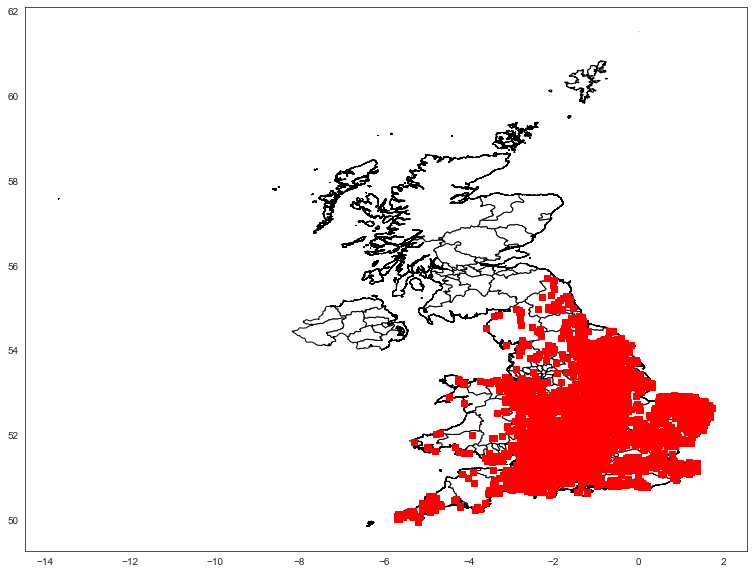

In [2250]:
gdf = gpd.GeoDataFrame(TEMPORAL_BROOCHES, 
                             geometry=gpd.points_from_xy(
                                 TEMPORAL_BROOCHES.fourFigureLon, 
                                 TEMPORAL_BROOCHES.fourFigureLat))

#world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# We restrict to South America.

gdf.plot(ax=UK_Map.plot(color='white', edgecolor = 'black'), color='red', marker='s')
plt.show()



In [2203]:
zeroes = []
tp = trim_plots()
for i in range(len(tp)):
    zeroes.append(0)
SUBSET = zeroes

outfile = open('fuckme.csv', 'w')
writer = csv.writer(outfile)
writer.writerow(['latitude', 'longitude', 'eval'])
for item in map_plot_values(zeroes):
    writer.writerow(item)
outfile.close()

In [1921]:
ls = []
lons = []
for index, row in ALL_BROOCHES.iterrows():
    if not np.isnan(row['fourFigureLat']):
        ls.append(row['fourFigureLat'])
    if not np.isnan(row['fourFigureLon']):
        lons.append(row['fourFigureLon'])
        

In [2295]:
# --------------- METAL PRODUCTION ---------------

In [2311]:
ice_core_df = pd.read_excel (r'MP_MCK.xlsx')

In [2312]:
for k in ice_core_df.keys():
    print(k)

Year
Lead
Copper


In [2320]:
icmp = {}
for year in ice_core_df['Year'].unique():
    tmp = ice_core_df[ice_core_df['Year']==year]
    cu_avg = tmp['Copper'].mean(skipna=True)
    pb_avg = tmp['Lead'].mean(skipna=True)
    icmp[year] = {'cu': cu_avg, 'pb': pb_avg}

In [2321]:
icmp

{499: {'cu': 20843.804545275587, 'pb': 10334.454918032787},
 498: {'cu': 20727.537884020654, 'pb': 10290.671568627451},
 497: {'cu': 20474.865545180746, 'pb': 10132.7078313253},
 496: {'cu': 20759.62419680854, 'pb': 10232.637096774193},
 495: {'cu': 20394.51675000002, 'pb': 10063.1375},
 494: {'cu': 20550.35193518521, 'pb': 10071.410493827161},
 493: {'cu': 20834.709554347795, 'pb': 10165.657873211261},
 492: {'cu': 20449.396521604915, 'pb': 10171.32564017283},
 491: {'cu': 22151.562416666635, 'pb': 10335.343773239572},
 490: {'cu': 23331.027870253136, 'pb': 10678.510044430372},
 489: {'cu': 26091.447138888874, 'pb': 11240.308356666657},
 488: {'cu': 38822.59825000003, 'pb': 11749.562098163264},
 487: {'cu': 45569.734845744744, 'pb': 12102.860838936169},
 486: {'cu': 40227.27075000005, 'pb': 11151.610111052622},
 485: {'cu': 25770.334793209833, 'pb': 10494.819467740732},
 484: {'cu': 20282.474787037037, 'pb': 10153.659960419764},
 483: {'cu': 39226.625, 'pb': 10819.167468504957},
 482:

In [2518]:
def create_row(year):
    # year, ice_core_copper, ice_core_lead, coin_copper, coin_silver_lead, obj_copper, obj_silver_lead, obj_lead (for fyi purposes)
    row = [year]
    try:
        icmp_vals = icmp[year]
    except:
        icmp_vals = {'cu': 0, 'pb': 0}
    row.append(icmp_vals['cu'])
    row.append(icmp_vals['pb'])
    
    #Format --> MP_roman_obj_metals[year] = {'all': total, 'silver': silver, 'lead': lead, 'copper': copper}
    try:
        roman_coins = MP_roman_coin_metals[year]
    except:
        roman_coins = {'all': 0, 'silver': 0, 'lead': 0, 'copper': 0}
    try:
        iron_coins = MP_iron_coin_metals[year]
    except:
        iron_coins = {'all': 0, 'silver': 0, 'lead': 0, 'copper': 0}
        
    coin_copper = roman_coins['copper'] + iron_coins['copper']
    coin_silver_lead = roman_coins['silver'] + iron_coins['silver'] + roman_coins['lead'] + iron_coins ['lead']
    
    try:
        roman_objs = MP_roman_obj_metals[year]
    except:
        roman_objs = {'all': 0, 'silver': 0, 'lead': 0, 'copper': 0}
    try:
        iron_objs = MP_iron_obj_metals[year]
    except:
        iron_objs = {'all': 0, 'silver': 0, 'lead': 0, 'copper': 0}
        
    try:
        BRITISH = MP_BRITISH_COINS[year]
    except:
        BRITISH = {'silver': 0, 'copper': 0}
        
    obj_copper = roman_objs['copper'] + iron_objs['copper']
    obj_silver_lead = roman_objs['silver'] + iron_objs['silver'] + roman_objs['lead'] + iron_objs['lead']
    obj_lead = roman_objs['lead'] + iron_objs['lead']
    
    BRITISH_copper = BRITISH['copper']
    BRITISH_silver = BRITISH['silver']
    
    # year, ice_core_copper, ice_core_lead, coin_copper, coin_silver_lead, obj_copper, obj_silver_lead, obj_lead (for fyi purposes)
    #row.append(coin_copper)
    #row.append(coin_silver_lead)
    #row.append(obj_copper)
    #row.append(obj_silver_lead)
    #row.append(obj_lead)
    row.append(BRITISH_copper)
    row.append(BRITISH_silver)
    
    return row

In [2516]:
MP_BRITISH_COINS

{30: {'all': 6, 'silver': 5, 'lead': 0, 'copper': 0},
 -12: {'all': 6, 'silver': 0, 'lead': 0, 'copper': 6},
 38: {'all': 2, 'silver': 1, 'lead': 0, 'copper': 1},
 15: {'all': 6, 'silver': 0, 'lead': 0, 'copper': 2},
 -55: {'all': 4, 'silver': 0, 'lead': 0, 'copper': 0},
 -22: {'all': 4, 'silver': 1, 'lead': 0, 'copper': 3},
 -10: {'all': 3, 'silver': 2, 'lead': 0, 'copper': 1},
 -18: {'all': 3, 'silver': 1, 'lead': 0, 'copper': 1},
 13: {'all': 2, 'silver': 0, 'lead': 0, 'copper': 0},
 -38: {'all': 1, 'silver': 1, 'lead': 0, 'copper': 0},
 45: {'all': 1, 'silver': 1, 'lead': 0, 'copper': 0},
 32: {'all': 6, 'silver': 1, 'lead': 0, 'copper': 2},
 -2: {'all': 1, 'silver': 0, 'lead': 0, 'copper': 0},
 39: {'all': 1, 'silver': 1, 'lead': 0, 'copper': 0},
 6: {'all': 1, 'silver': 0, 'lead': 0, 'copper': 1},
 36: {'all': 1, 'silver': 0, 'lead': 0, 'copper': 1},
 -11: {'all': 1, 'silver': 1, 'lead': 0, 'copper': 0},
 -15: {'all': 1, 'silver': 0, 'lead': 0, 'copper': 1},
 35: {'all': 1, 'silv

In [2519]:
def output_metal_production():
    outfile = open('BRITISHmetal_results.csv', 'w')
    writer = csv.writer(outfile)
    #writer.writerow(['year', 'ice_core_copper', 'ice_core_lead', 'coin_copper', 'coin_silver_lead', 'obj_copper', 'obj_silver_lead', 'obj_lead'])
    writer.writerow(['year', 'ice_core_copper', 'ice_core_lead','bcopper', 'bsilver'])
    for i in range(-55, 400):
        row = create_row(i)
        writer.writerow(row)
    outfile.close()
        

In [2520]:
output_metal_production()

In [2393]:
# copper, lead
bucket_0 = [0,0]
bucket_1 = [0,0]
bucket_2 = [0,0]
bucket_3 = [0,0]
bucket_4 = [0,0]
bucket_5 = [0,0]
bucket_6 = [0,0]
bucket_7 = [0,0]
bucket_8 = [0,0]
bucket_9 = [0,0]
for item in icmp:
    cu = icmp[item]['cu']
    pb = icmp[item]['pb']
    if 0<=item<=50:
        bucket_0[0]+=cu
        bucket_0[1]+=pb
    elif 50<=item<=100:
        bucket_1[0]+=cu
        bucket_1[1]+=pb
    elif 100<=item<=150:
        bucket_2[0]+=cu
        bucket_2[1]+=pb
    elif 150<=item<=200:
        bucket_3[0]+=cu
        bucket_3[1]+=pb
    elif 200<=item<=250:
        bucket_4[0]+=cu
        bucket_4[1]+=pb
    elif 250<=item<=300:
        bucket_5[0]+=cu
        bucket_5[1]+=pb
    elif 300<=item<=350:
        bucket_6[0]+=cu
        bucket_6[1]+=pb
    elif 350<=item<=400:
        bucket_7[0]+=cu
        bucket_7[1]+=pb
    elif 400<=item<=450:
        if not np.isnan(cu):
            bucket_8[0]+=cu
            bucket_8[1]+=pb
    elif 450<=item<=500:
        if not np.isnan(cu):
            bucket_9[0]+=cu
            bucket_9[1]+=pb
bkts = [bucket_0,bucket_1,bucket_2,bucket_3,bucket_4,bucket_5,bucket_6,bucket_7,bucket_8,bucket_9]

In [2491]:
bkts = make_buckets(0,500,50)
for i in range(len(bkts)-1):
    start = bkts[i]
    end = bkts[i+1]
    cus = []
    pbs = []
    for item in icmp:
        if start<=item<=end:
            cu = icmp[item]['cu']
            pb = icmp[item]['pb']
            if (not np.isnan(cu)) and cu != 0:
                cus.append(cu)
            if (not np.isnan(pb)) and pb != 0:
                pbs.append(pb)
    print(str(sum(cus)/len(cus)) + ',' + str(sum(pbs)/len(pbs)))
            

22161.914393306197,10355.839903241178
22549.67504046655,10340.541866998965
21024.285750749703,10143.888498097853
21809.22797629356,10884.962697332718
22089.50987697823,11282.634025911879
24336.3100108454,11209.262955939466
25329.424803513633,10551.538774292792
20988.44848454676,10170.09979590845
23465.17470933135,11119.080881239614
31009.589543331578,10974.53816167371
nan,nan


//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in double_scalars
  from ipykernel import kernelapp as app


In [2496]:
mints = collections.Counter()
COINS['mintName'].unique()
for index, row in COINS.iterrows():
    mints[row['mintName']]+=1
print(mints.most_common())

[(nan, 179839), ('Rome', 26391), ('Uncertain', 26034), ('Trier', 22223), ('Lugdunum', 9458), ('Gallic mint', 9378), ('Londinium', 8472), ('Arelatum', 7349), ('Mint I, Gaul (Uncertain, France or Germany)', 1789), ('Siscia', 1503), ('Colchester', 1488), ('C mint (Uncertain, England)', 1439), ('Mediolanum', 959), ('Aquileia', 868), ('Ticinum', 789), ('Mint II, Gaul (Uncertain, France or Germany)', 731), ('Unattributed', 566), ('Arles or Lyons (Valentinianic, 364-75)', 560), ('Verulamium', 456), ('Moving with Republican issuer', 360), ('Constantinople', 346), ('Ambianum', 326), ('Thessalonica', 256), ('Antioch (Antakya, Turkey)', 218), ('Cyzicus', 143), ('Eastern mint', 137), ('Calleva', 135), ('Cologne', 127), ('Spain', 80), ('Perinthus/Heraclea', 79), ('Nicomedia', 70), ('Alexandria, Egypt', 62), ('Carthage', 53), ('Ostia', 46), ('Sirmium', 33), ('Italian mint', 33), ('African Mint', 31), ('Serdica', 18), ('Rotomagus', 17), ('Ravenna', 15), ('Viminacium', 9), ('Sicilian mint', 9), ('Tarr

In [69]:
britishmints = ['Londinium', 'Colchester', 'C mint (Uncertain, England)', 'Verulamium', 'Calleva']
BRITISHCOINS = COINS[COINS['mintName'].isin(britishmints)]

In [70]:
len(BRITISHCOINS)

11990

In [2394]:
for item in bkts:
    print(str(item[0]) + "," + str(item[1]))

1019448.0620920849,476368.6355490943
1039909.2425269281,475953.5650901034
1047477.6053028505,507045.9257148166
807459.147892461,403163.4547472052
994027.9444640207,507718.5311660346
1070797.640477197,493207.5700613366
1068480.969328864,443334.1312316646
545409.6964811365,264290.8205291217
941782.4746240897,455095.7129604344
1530297.868916578,538615.8113942854


In [81]:
make_buckets(0,500,100)

[0, 100, 200, 300, 400, 500, 600]

In [85]:
tot = 0
for index, row in COINS.iterrows():
    if (row['quantity'] >= 1) and (row['quantity'] <= 10):
        tot+=row['quantity']
print(tot)

315656.0


In [93]:
x = 0
for item in MCL['not_classified']:
    x+=item[1]
print(x)

255


In [94]:
x = 0
ks = MCL.keys()
for k in ks:
    for item in MCL[k]:
        x+=item[1]
print(x)

23663


In [96]:
1 - 255/23663

0.9892236825423657

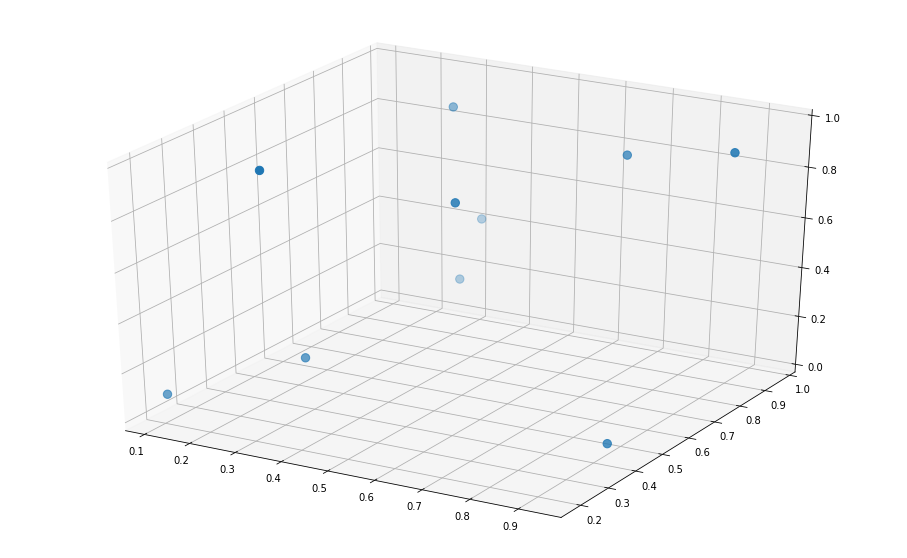

In [115]:
from mpl_toolkits.mplot3d import Axes3D
N = 10
x = np.random.rand(N)
y = np.random.rand(N)
z = np.random.rand(N)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, s=70)

#ax.set_xlabel('First pixel value')
#ax.set_ylabel('Second pixel value')
#ax.set_zlabel('Third pixel value')
plt.show()

In [116]:
len(ALL_DATA)

385029

In [117]:
outfile = open('fuckme2.csv', 'w')
writer = csv.writer(outfile)
writer.writerow(['latitude', 'longitude'])
for index, row in ALL_DATA.iterrows():
    writer.writerow([row['fourFigureLat'], row['fourFigureLon']])
outfile.close()

In [46]:
print(len(ALL_BROOCHES))
print(len(TEMPORAL_BROOCHES))

33122
14450


In [179]:
preconq_bs = []
conq_bs = []
early_bs = []
mid_bs = []
late_bs = []
non_discrete = []
b_060 = []
b_40100 = []
b_0150 = []
b_150450 = []
b_43200 = []
ds = collections.Counter()

for index, row in TEMPORAL_BROOCHES.iterrows():
    n1 = row['numdate1']
    n2 = row['numdate2']
    if (n1 >= 150) and (n2 <= 175):
        print("FUKKKK")
    distance = abs(n2-n1)
    if (n1 <= 43) and (n2 <= 43):
        preconq_bs.append(row)
    elif (n1 >= 43) and (n2 <= 80):
        conq_bs.append(row)
    elif (n1 >= 75) and (n2 <= 175):
        early_bs.append(row)
    elif (n1 >= 150) and (n2 <= 300):
        mid_bs.append(row)
    elif (n1 >= 300) and (n2 <= 450):
        late_bs.append(row)
    # --------
    elif (n1 >= 0) and (n2 <= 60):
        b_060.append(row)
    elif (n1 >= 40) and (n2 <= 100):
        b_40100.append(row)
    elif (n1 >= 0) and (n2 <= 150):
        b_0150.append(row)
    elif (n1 >= 100) and (n2 <= 450):
        b_150450.append(row)
    elif (n1 >= 43) and (n2 <= 200):
        b_43200.append(row)
    #elif (n)
        
    else:
        non_discrete.append(row)
        ds[str((n1, n2))]+=1


FUKKKK
FUKKKK
FUKKKK
FUKKKK
FUKKKK
FUKKKK
FUKKKK
FUKKKK
FUKKKK
FUKKKK


In [177]:
len(non_discrete)

1277

In [178]:
len(b_43200)

1590

In [165]:
x = 0
y = 0
for i in ds.items():
    if i[0] > 100:

(200.0, 129)
(100.0, 1261)
(78.0, 6)
(150.0, 262)
(800.0, 5)
(75.0, 11)
(450.0, 4)
(250.0, 28)
(500.0, 15)
(85.0, 14)
(1000.0, 1)
(118.0, 1)
(160.0, 23)
(90.0, 11)
(300.0, 14)
(175.0, 14)
(110.0, 16)
(70.0, 10)
(125.0, 614)
(130.0, 34)
(180.0, 7)
(140.0, 7)
(145.0, 4)
(120.0, 51)
(400.0, 10)
(80.0, 14)
(699.0, 2)
(510.0, 3)
(600.0, 2)
(710.0, 4)
(700.0, 2)
(350.0, 33)
(1200.0, 1)
(1866.0, 1)
(1210.0, 3)
(225.0, 3)
(199.0, 264)
(95.0, 20)
(115.0, 7)
(170.0, 110)
(357.0, 12)
(157.0, 491)
(182.0, 1)
(105.0, 10)
(367.0, 193)
(190.0, 1)
(757.0, 1)
(257.0, 37)
(354.0, 2)
(270.0, 1)
(132.0, 43)
(320.0, 3)
(315.0, 1)
(307.0, 11)
(146.0, 1)
(198.0, 15)
(325.0, 17)
(240.0, 2)
(131.0, 18)
(156.0, 32)
(207.0, 15)
(165.0, 1)
(365.0, 2)
(98.0, 1)
(335.0, 1)
(366.0, 11)
(106.0, 3)
(1829.0, 1)
(97.0, 1)
(220.0, 4)
(117.0, 1)
(197.0, 6)
(399.0, 6)
(149.0, 10)
(137.0, 1)
(360.0, 3)
(850.0, 1)
(645.0, 1)
(168.0, 1)
(1357.0, 1)
(407.0, 2)
(102.0, 1)
(255.0, 1)
(1022.0, 1)
(359.0, 3)
(124.0, 31)
(135.0, 1)

In [144]:
len(b_060)

672

In [145]:
len(b_40100)

1495

In [146]:
len(b_0100)

857

In [95]:
TEMPORAL_BROOCHES.to_excel("TEMPORAL_BROOCHES.xlsx")

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


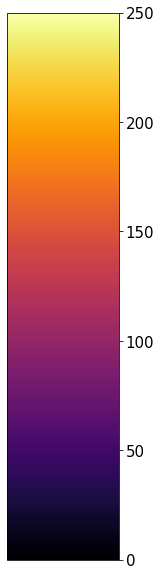

In [95]:
import matplotlib.pyplot as plt
import matplotlib as mpl

fig, ax = plt.subplots(figsize=(2, 20))
fig.subplots_adjust(bottom=0.5)

cmap = mpl.cm.inferno
norm = mpl.colors.Normalize(vmin=0, vmax=250)

cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='vertical')

cb1.ax.tick_params(labelsize=15)

#cb1.set_label('Intensity Value')
fig.show()

In [83]:
TEMPORAL_BROOCHES.head()

,id,old_findID,uniqueID,objecttype,classification,subclass,length,height,width,weight,...,calc_thickness,calc_numdate1,calc_numdate2,calc_dateBucket,calc_fourFigureLat,calc_fourFigureLat_zoom,calc_fourFigureLon,calc_fourFigureLon_zoom,calc_broadDateBucket,classifiedas
26,964389,NARC-9CF605,PAS5D39CF600014E8,BROOCH,Colchester one Piece,NaN,42.24,NaN,15.42,4.20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,colchester
28,964235,PUBLIC-98B3F9,PAS5D398B3F001952,BROOCH,Colchester Brooch,One Piece,52.50,NaN,15.60,5.76,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,colchester
30,964228,PUBLIC-989939,PAS5D398993001A0D,BROOCH,Colchester Brooch,One Piece,64.50,NaN,10.00,4.95,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,colchester
31,964225,PUBLIC-988911,PAS5D3988910010C2,BROOCH,Colchester Brooch,One Piece,64.50,NaN,10.00,4.95,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,colchester
32,964198,SWYOR-980C55,PAS5D3980C500156D,BROOCH,La Tene B,NaN,43.50,NaN,17.50,4.27,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,misclatene


In [84]:
# iceni peak bounds 
iceni_lats = [52.208650, 53.009198]
iceni_lons = [0.233828, 1.917483]
iceni_peak_brooches_allyears = []
for index, row in TEMPORAL_BROOCHES.iterrows():
    if iceni_lats[0] <= row['fourFigureLat'] <= iceni_lats[1]:
        if iceni_lons[0] <= row['fourFigureLon'] <= iceni_lons[1]:
            iceni_peak_brooches_allyears.append(row)

In [85]:
IPB = iceni_peak_brooches_allyears

In [86]:
len(IPB)

1907

In [87]:
# look at 600-101BC, 100BC - 42AD, 43-65AD, 66-90AD, 91-120AD, 121-150AD, 151-180AD, 181-210AD (pause there)
IPB_buckets = {'pre100': [], '10042': [], '4365': [], '6690':[], '91120':[], '121150':[], '151180':[], '181210':[]}
for b in IPB:
    start = b['numdate1']
    end = b['numdate2']
    if (start < -100) and (end < - 100):
        IPB_buckets['pre100'].append(b)
    elif (start >= -100) and (end <= 42):
        IPB_buckets['10042'].append(b)
    elif (start >= 43) and (end <= 65):
        IPB_buckets['4365'].append(b)
    elif (start >= 66) and (end <= 90):
        IPB_buckets['6690'].append(b)
    elif (start >= 91) and (end <= 120):
        IPB_buckets['91120'].append(b)
    elif (start >= 121) and (end <= 150):
        IPB_buckets['121150'].append(b)
    elif (start >= 151) and (end <= 180):
        IPB_buckets['151180'].append(b)
    elif (start >= 181) and (end <= 210):
        IPB_buckets['181210'].append(b)
        

In [88]:
all_classes = collections.Counter()
for b in IPB:
    start = b['numdate1']
    end = b['numdate2']
    c = b['classifiedas']
    all_classes[c]+=1
print(all_classes.most_common)

<bound method Counter.most_common of Counter({None: 735, 'cd': 316, 'mack': 257, 'colchester': 73, 'NaN': 60, 'HH': 59, 'langtondown': 45, 'c': 27, 'd': 27, 't': 25, 'h': 25, 'di': 24, 'ph': 20, 'aes': 19, 'miscmack': 18, 'p': 17, 'rosette': 16, 'bow': 13, 'z': 13, 'nauheim': 11, 'cdp': 10, 'pen': 9, 'kn': 7, 'lateneI': 6, 'auc': 6, 'ld': 5, 'ps': 5, 'ts': 5, 'cross': 5, 'lateneIII': 4, 'u': 4, 'fan': 4, 'misclatene': 3, 'lion': 3, 'birdlip': 3, 'tut': 3, 'chat': 3, 'rose': 3, 'adam': 2, 'alesia': 2, 'oval': 2, 'hrider': 2, 'hook': 2, 'aucissa': 1, 'hawkeshull': 1, 'knoten': 1, 'penannular': 1, 'lateneII': 1, 'skeuo': 1, 'cruciform': 1, 'protocross': 1, 'equal': 1})>


In [89]:
# class expected values
ALL_ICENI_CLASSES = {}
def class_object():
    years = {}
    for i in range(-600, 451):
        years[i] = 0
    return years

def set_classes():
    for item in all_classes:
        ALL_ICENI_CLASSES[item] = class_object()

def update_class(c, brooch_n1, brooch_n2):
    value = 1/(abs(brooch_n2 - brooch_n1)+1)
    value_given = 0
    current_vals = ALL_ICENI_CLASSES[c]
    if brooch_n1 < (-600):
        start = (-600)
    else:
        start = brooch_n1
    if brooch_n2 > 450:
        end = 450
    else:
        end = brooch_n2
    for i in range(start, (end + 1)):
        current_vals[i]+=value
        value_given+=value
    ALL_ICENI_CLASSES[c] = current_vals


In [90]:
set_classes()
for b in IPB:
    n1 = int(b['numdate1'])
    n2 = int(b['numdate2'])
    c = b['classifiedas']
    update_class(c, n1, n2)

In [91]:
ALL_ICENI_CLASSES.keys()

dict_keys(['NaN', 'langtondown', 'colchester', 'miscmack', 'misclatene', 'lateneI', 'rosette', 'lion', 'nauheim', 'adam', 'aucissa', 'hawkeshull', 'birdlip', 'bow', 'knoten', 'alesia', 'lateneIII', 'penannular', 'lateneII', 'di', None, 'cd', 'aes', 'mack', 'ld', 'ps', 't', 'c', 'HH', 'h', 'd', 'tut', 'p', 'z', 'ph', 'cdp', 'oval', 'u', 'skeuo', 'ts', 'kn', 'chat', 'cruciform', 'auc', 'pen', 'protocross', 'rose', 'cross', 'hrider', 'fan', 'hook', 'equal'])

In [105]:
outfile = open('iceni_peak_classes_nomack.csv', 'w')
writer = csv.writer(outfile)
cols = ['class']
for i in range(-600, 451):
    cols.append(i)
writer.writerow(cols)

for CLASS in ALL_ICENI_CLASSES.keys():
    new_row = [CLASS]
    for i in range(-600, 451):
        new_row.append(ALL_ICENI_CLASSES[CLASS][i])
    writer.writerow(new_row)
outfile.close()

In [106]:
len(IPB)

1907

In [107]:
outfile = open('iceni_peak_mackreths2.csv', 'w')
writer = csv.writer(outfile)
for row in IPB:
    if (row['classifiedas']=='mack') or (row['classifiedas']=='miscmack'):
        examine = [row['classification'], row['numdate1'], row['numdate2'], row['description']]
        writer.writerow(examine)
outfile.close()

In [108]:
infile = open('iceni_peak_mackreths.csv','r')
reader = csv.reader(infile)
fix_macks = []
for row in reader:
    fix_macks.append([row[0], row[1]])
infile.close()

In [109]:
len(fix_macks)
len(IPB)

1907

In [110]:
IPB_v2 = []
adjusted = []
for row in IPB:
    if (row['classifiedas']=='mack') or (row['classifiedas']=='miscmack'):
        print("hey")
        temp = row
        c = row['classification']
        for pair in fix_macks:
            if pair[0]==c:
                temp['classifiedas'] = pair[1]
                IPB_v2.append(temp)
                adjusted.append(pair[1])
    else:
        IPB_v2.append(row)
    

hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey
hey


In [111]:
len(adjusted)

0

In [376]:
for row in IPB:
    if row['description']== "<p>Two incomplete Roman copper alloy Hod Hill brooches, c.43 - c.75:</p>":
        

In [92]:
newcs = collections.Counter()
for row in IPB:
    newcs[row['classifiedas']]+=1
print(newcs)

Counter({None: 735, 'cd': 316, 'mack': 257, 'colchester': 73, 'NaN': 60, 'HH': 59, 'langtondown': 45, 'c': 27, 'd': 27, 't': 25, 'h': 25, 'di': 24, 'ph': 20, 'aes': 19, 'miscmack': 18, 'p': 17, 'rosette': 16, 'bow': 13, 'z': 13, 'nauheim': 11, 'cdp': 10, 'pen': 9, 'kn': 7, 'lateneI': 6, 'auc': 6, 'ld': 5, 'ps': 5, 'ts': 5, 'cross': 5, 'lateneIII': 4, 'u': 4, 'fan': 4, 'misclatene': 3, 'lion': 3, 'birdlip': 3, 'tut': 3, 'chat': 3, 'rose': 3, 'adam': 2, 'alesia': 2, 'oval': 2, 'hrider': 2, 'hook': 2, 'aucissa': 1, 'hawkeshull': 1, 'knoten': 1, 'penannular': 1, 'lateneII': 1, 'skeuo': 1, 'cruciform': 1, 'protocross': 1, 'equal': 1})


In [75]:
#--------------------------------------------------------------------------------------------------
# GOAL: create 1571 rows (one for each trimmed plot) and 550 columns (100 BC to 450 AD)
#--------------------------------------------------------------------------------------------------
ALL_PLOTS = trim_plots()
PLOT_OBJECTS = []
ERRORS = 0
# make an empty plot object for each trimmed plot
def plot_object(pbounds):
    years = {}
    for i in range((-600), 451):
        years[i] = 0
    # return ((latmin, latmax), (lonmin, lonmax), years_dict)
    return [pbounds[0], pbounds[1], years]

def match_brooch_to_plot(lat, lon):
    found = 0
    for i in range(len(ALL_PLOTS)):
        if found == 0:
            plot = ALL_PLOTS[i]
            if (plot[0][0] <= lat <= plot[0][1]) and (plot[1][0] <= lon <= plot[1][1]):
                # execute
                found = 1
                #print(i)
                return(i)
        else:
            break
    return "ERROR"

def update_plot(index, brooch_n1, brooch_n2):
    value = 1/(abs(brooch_n2 - brooch_n1)+1)
    value_given = 0
    plot = PLOT_OBJECTS[index]
    years = plot[2]
    if brooch_n1 < (-600):
        start = (-600)
    else:
        start = brooch_n1
    if brooch_n2 > 450:
        end = 450
    else:
        end = brooch_n2
        
    for i in range(start, (end + 1)):
        years[i]+=value
        value_given+=value

    plot[2] = years
    PLOT_OBJECTS[index] = plot
    
def evaluate_brooch(lat, lon, n1, n2):
    index = match_brooch_to_plot(lat, lon)
    if index != "ERROR":
        update_plot(index, n1, n2)
        return 0
    else:
        return 1
        
#--------------------------------------------------------------------------------------------------

In [93]:
for item in newcs:
    print(str(item) + ',' + str(newcs[item]))

NaN,60
langtondown,45
colchester,73
miscmack,18
misclatene,3
lateneI,6
rosette,16
lion,3
nauheim,11
adam,2
aucissa,1
hawkeshull,1
birdlip,3
bow,13
knoten,1
alesia,2
lateneIII,4
penannular,1
lateneII,1
di,24
None,735
cd,316
aes,19
mack,257
ld,5
ps,5
t,25
c,27
HH,59
h,25
d,27
tut,3
p,17
z,13
ph,20
cdp,10
oval,2
u,4
skeuo,1
ts,5
kn,7
chat,3
cruciform,1
auc,6
pen,9
protocross,1
rose,3
cross,5
hrider,2
fan,4
hook,2
equal,1


In [94]:
rearhooks = 0
classes = collections.Counter()
for row in IPB:
    d = row['description']
    tokens = word_tokenize(d.lower())
    for i in range(len(tokens)):
        t = tokens[i]
        if t == 'rearhook':
            rearhooks+=1
            classes[row['classifiedas']]+=1
            #stitch = [tokens[i-2], tokens[i-1], tokens[i], tokens[i+1], tokens[i+2]]
            #print(stitch)
        elif t == 'rear':
            if tokens[i+1]=='hook':
                rearhooks+=1
                #stitch = [tokens[i-2], tokens[i-1], tokens[i], tokens[i+1], tokens[i+2]]
                #print(stitch)
                classes[row['classifiedas']]+=1
        if t == 'crossbow':
            print('crossbow')
print(rearhooks)
    

crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
crossbow
699


In [115]:
# IPB has 1907
# 699 rearhooks
classes

Counter({None: 280,
         'cd': 252,
         'aes': 15,
         'mack': 117,
         'c': 13,
         'cdp': 3,
         'ph': 6,
         'bow': 1,
         'fan': 3,
         'hook': 4,
         'd': 5})

In [116]:
cs = TEMPORAL_BROOCHES['classifiedas'].unique()
print(cs)
i = 0
for index, row in TEMPORAL_BROOCHES.iterrows():
    if row['classifiedas']=='NaN':
        print(row['classification'])
print(i)

['colchester' 'misclatene' 'lateneIII' 'strip' 'rosette' 'NaN' 'bow'
 'langtondown' 'lateneI' 'hawkeshull' 'plate' 'birdlip' 'nauheim' 'lion'
 '2bb2' 'penannular' 'miscmack' 'ungrouped' 'adam' 'aucissa' 'alesia'
 'knoten' 'feugere' 'lateneII' 'hodhill' 'lowbury' 'hallstatt' 'aesica'
 'drahtfibel' 'onepiece' 'thistle' '1b' 'dragonesque' 'eye' 'trumpet'
 'wir' 'cd' 't' None 'di' 'ph' 'skeuo' 'aes' 'cdp' 'mack' 'auc' 'p' 'drag'
 'h' 'theal' 'HH' 'ts' 'bagendon' 'kn' 'z' 'c' 'd' 'rose' 'hrider' 'ld'
 'ps' 'blip' 'cross' 'pen' 'u' 'oval' 'fan' 'wrox' 'nau' 'chat' 'loz'
 'tut' 'wheel' 'hook' 'pin' 'latene' 'this' 'saw' 'kraftig' 'equal'
 'swastika' 'openwork' 'centreboss' 'hingehead' 'bridge' 'protocross'
 'cruciform' 'alcester' 'star' 'fib']
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
n

In [49]:
# --- GROUP BY SIGNIFICANCE
def group_by_significance(classified):
    G_Colchester = [['colchester', 'c'], 'COLCHESTER']
    G_Colchester_Derivative = [['cd', 'd'], 'DERIVATIVE']
    G_Polden = [['ph', 'cdp'], 'POLDEN']
    G_Military = [['aucissa', 'hodhill', 'auc', 'HH', 'kn', 'ps', 'cross', 'protocross'], 'MILITARY']
    G_Importation = [['rosette', 'langtondown', 'alesia', 'thistle', 'rose', 'ld', 'this', 'kraftig'], 'IMPORT']
    G_ImportProd = [['misclatene', 'lateneIII', 'strip', 'lateneI', 'nauheim', '2bb2', 'lateneII', 'lowbury',
                   'drahtfibel', 'nau', 'latene'], 'IMPORTPROD']
    G_Production = [['birdlip','aesica', 'aes', 'blip'], 'PROD']
    G_Pen = [['penannular', 'pen'], 'PEN']
    G_Bows = [['bow', 'hawkeshull', 'lion', 'trumpet', 'wir', 't', 'h', 'theal', 'ts', 'bagendon', 'fan', 'wrox',
             'hook', 'saw', 'hingehead', 'fib', 'alcester'], 'BOWS']
    G_Plates = [['plate', 'hallstatt', 'dragonqesque', 'di', 'skeuo', 'p', 'drag', 'z', 'hrider', 'u', 'oval',
               'loz', 'tut', 'wheel', 'chat', 'equal', 'swastika', 'centreboss', 'bridge', 'cruciform', 'star'], 'PLATE']
    G_Unknown = [['adam', 'knoten', 'feugere', 'onepiece', '1b', 'eye', None, 'mack', 'miscmack', 'pin', 'openwork'], 'UNKNOWN']
    
    GROUPS = [G_Colchester, G_Colchester_Derivative, G_Polden, G_Military, G_Importation,
             G_ImportProd, G_Production, G_Pen, G_Bows, G_Plates, G_Unknown]
    for G in GROUPS:
        if classified in G[0]:
            return G[1]
    

In [50]:
def re_classify(row):
    c = row['classifiedas']
    if (c == None) or (c=='miscmack') or (c=='mack') or (c=='ungrouped') or (c=='NaN'):
        try:
            desc = row['description'].replace('catch plate', 'catchPT')
            desc = desc.replace('catchplate', 'catchPT')
            new_c = classify(desc)
            new_row = row
            new_row['classifiedas'] = new_c
            return new_row
        except:
            return row
    else:
        return row

In [122]:
#BACKUP_TB172020=TEMPORAL_BROOCHES

In [51]:
UPDATED_BROOCHES = []
for index, row in TEMPORAL_BROOCHES.iterrows():
    UPDATED_BROOCHES.append(re_classify(row))

In [52]:
ALL_BROOCHES_V2 = []
for index, row in ALL_BROOCHES.iterrows():
    ALL_BROOCHES_V2.append(re_classify(row))

In [50]:
classes = collections.Counter()
for row in UPDATED_BROOCHES:
    classes[row['classifiedas']]+=1
print(classes)

Counter({'cd': 1604, 't': 1507, 'ts': 1223, 'cdp': 1159, 'c': 900, 'h': 827, 'bow': 816, 'd': 670, 'di': 611, 'HH': 578, 'p': 538, 'ph': 449, 'colchester': 315, 'fan': 204, 'z': 202, 'kn': 193, 'cross': 179, 'u': 179, 'ld': 161, 'langtondown': 158, 'aes': 139, 'pen': 130, 'drag': 130, 'lateneIII': 118, 'nauheim': 109, 'auc': 104, 'mack': 82, 'lateneI': 75, 'nau': 73, 'oval': 63, None: 61, 'latene': 59, 'rose': 59, 'loz': 57, 'rosette': 43, 'wir': 38, 'misclatene': 37, 'ps': 37, 'hingehead': 35, 'penannular': 34, 'theal': 32, 'equal': 32, 'strip': 28, 'birdlip': 28, 'openwork': 23, 'saw': 23, 'hook': 22, 'hrider': 22, 'wrox': 22, 'skeuo': 21, 'blip': 17, 'fib': 16, 'tut': 15, 'pin': 15, 'chat': 13, 'kraftig': 13, '2bb2': 11, 'aucissa': 11, 'onepiece': 11, 'lateneII': 9, 'star': 9, 'wheel': 8, 'hawkeshull': 6, 'lion': 6, 'adam': 6, 'eye': 6, 'this': 6, 'bridge': 6, 'alcester': 6, 'alesia': 5, 'centreboss': 5, 'cruciform': 5, 'plate': 4, 'knoten': 4, 'swastika': 4, 'hodhill': 3, 'lowbury'

In [99]:
oldclasses = collections.Counter()
for index, row in BACKUP_TB172020.iterrows():
    oldclasses[row['classifiedas']]+=1
print(oldclasses)

NameError: name 'BACKUP_TB172020' is not defined

In [124]:
for item in oldclasses:
    stem = str(item) + ':  ' + str(oldclasses[item]) + ' --> '
    try:
        new = str(classes[item])
    except:
        new = 0
    stem = stem + str(new)
    print(stem)

colchester:  315 --> 315
misclatene:  37 --> 37
lateneIII:  118 --> 118
strip:  28 --> 28
rosette:  43 --> 43
NaN:  343 --> 0
bow:  546 --> 816
langtondown:  158 --> 158
lateneI:  75 --> 75
hawkeshull:  6 --> 6
plate:  4 --> 4
birdlip:  28 --> 28
nauheim:  109 --> 109
lion:  6 --> 6
2bb2:  11 --> 11
penannular:  34 --> 34
miscmack:  21 --> 0
ungrouped:  10 --> 0
adam:  6 --> 6
aucissa:  11 --> 11
alesia:  5 --> 5
knoten:  4 --> 4
feugere:  2 --> 2
lateneII:  9 --> 9
hodhill:  3 --> 3
lowbury:  3 --> 3
hallstatt:  3 --> 3
aesica:  2 --> 2
drahtfibel:  2 --> 2
onepiece:  11 --> 11
thistle:  1 --> 1
1b:  1 --> 1
dragonesque:  1 --> 1
eye:  5 --> 6
trumpet:  1 --> 1
wir:  37 --> 38
cd:  998 --> 1604
t:  1209 --> 1507
None:  2980 --> 61
di:  474 --> 611
ph:  400 --> 449
skeuo:  19 --> 21
aes:  103 --> 139
cdp:  1115 --> 1159
mack:  287 --> 82
auc:  94 --> 104
p:  484 --> 538
drag:  127 --> 130
h:  690 --> 827
theal:  32 --> 32
HH:  432 --> 578
ts:  668 --> 1223
bagendon:  2 --> 2
kn:  167 -

In [53]:
SIGS = []
for row in UPDATED_BROOCHES:
    SIGS.append(group_by_significance(row['classifiedas']))

In [54]:
SIG_BROOCHES = []
for row in UPDATED_BROOCHES:
    new_row = row
    new_row['significance']=group_by_significance(row['classifiedas'])
    SIG_BROOCHES.append(row)
UPDATED_BROOCHES = SIG_BROOCHES

In [55]:
# for all brooches
SIGS = []
for row in ALL_BROOCHES_V2:
    SIGS.append(group_by_significance(row['classifiedas']))
SIG_BROOCHES = []
for row in ALL_BROOCHES_V2:
    new_row = row
    new_row['significance']=group_by_significance(row['classifiedas'])
    SIG_BROOCHES.append(row)
ALL_BROOCHES_V2 = SIG_BROOCHES

In [218]:
TOTAL_EVS = []
infile = open("EVals_AllBrooches.csv", 'r')
reader = csv.reader(infile)
next(reader)
for row in reader:
    TOTAL_EVS.append(float(row[6]))
infile.close()

In [219]:
sum(TOTAL_EVS)

14397.050384137947

In [129]:
def CALC_SIG_EVAL_MAP(sig):
    tracker = 0
    ERRORS = 0
    for row in UPDATED_BROOCHES:
        # KEY ROW -----------
        if row['significance'] == sig:
            #print("hey")
        # -------------------
            lat = row['fourFigureLat']
            lon = row['fourFigureLon']
            n1 = int(row['numdate1'])
            n2 = int(row['numdate2'])
            ERRORS+=evaluate_brooch(lat, lon, n1, n2)
            tracker +=1
            #print(tracker)
    outfile = open('EVals_' + str(sig) + '.csv', 'w')
    #outfile=open('EVals_AllBrooches.csv', 'w')
    writer = csv.writer(outfile)
    cols = ['LAT', 'LON','latmin', 'latmax', 'lonmin', 'lonmax','PLOT_ALLTIME_EV','RATIO','SIG_TOTAL',
           '600_101','100_42','43_65','66_90','91_120','121_150',
            '151_180','181_210','211_250','251_300','301_350','351_450',
           'R600_101','R100_42','R43_65','R66_90','R91_120','R121_150',
            'R151_180','R181_210','R211_250','R251_300','R301_350','R351_450']
    for i in range(-600, 451):
        cols.append(i)
    writer.writerow(cols)
    #for p in PLOT_OBJECTS:
        #print(p[2][45])

    #for p in PLOT_OBJECTS:
    for track in range(len(PLOT_OBJECTS)):
        p = PLOT_OBJECTS[track]
        latmin = p[0][0]
        latmax = p[0][1]
        lonmin = p[1][0]
        lonmax = p[1][1]
        LAT = mean([latmin, latmax])
        LON = mean([lonmin, lonmax])
        YV = p[2]
        yearvals = []
        for i in range(-600, 451):
            add = p[2][i]
            yearvals.append(add)
        
        pcols = [LAT, LON, latmin, latmax, lonmin, lonmax, TOTAL_EVS[track],0]
        TOTAL = sum(yearvals[0:])
        A = sum(yearvals[0:500])
        B = sum(yearvals[500:643])
        C = sum(yearvals[643:666])
        D = sum(yearvals[666:691])
        E = sum(yearvals[691:721])
        F = sum(yearvals[721:751])
        G = sum(yearvals[751:781])
        H = sum(yearvals[781:811])
        I = sum(yearvals[811:851])
        J = sum(yearvals[851:901])
        K = sum(yearvals[901:951])
        L = sum(yearvals[951:])
        for item in [TOTAL,A,B,C,D,E,F,G,H,I,J,K,L]:
            pcols.append(item)
        if TOTAL_EVS[track] == 0:
            pcols[7] = 0
        else:
            pcols[7] = (TOTAL/TOTAL_EVS[track])
        for item in [A,B,C,D,E,F,G,H,I,J,K,L]:
            if TOTAL_EVS[track] == 0:
                pcols.append(0)
            else:
                pcols.append(item/TOTAL_EVS[track])
        for i in range(len(yearvals)):
            pcols.append(yearvals[i])
        #for i in range (-600, 451):
            #pcols.append(yearvals[i])
        writer.writerow(pcols)

    outfile.close()

In [804]:

PLOT_OBJECTS = []
for p in ALL_PLOTS:
    PLOT_OBJECTS.append(plot_object(p))
CALC_SIG_EVAL_MAP('IMPORT')

In [130]:
len(ALL_PLOTS)

1571

In [10]:
import matplotlib.pyplot as plt
import matplotlib as mpl



fig, ax = plt.subplots(figsize=(0.5, 10))
fig.subplots_adjust(bottom=0.5)

cmap = mpl.cm.Greens
norm = mpl.colors.Normalize(vmin=0, vmax=1)

cb1 = mpl.colorbar.ColorbarBase(ax, cmap=cmap,
                                norm=norm,
                                orientation='vertical')

cb1.ax.tick_params(labelsize=15, color='black', labelcolor='black', bottom)
#cb1.ax.yaxis.set_ticks_position('left')
fig.patch.set_facecolor('white')


#cb1.set_label('Intensity Value')
fig.show()

SyntaxError: positional argument follows keyword argument (<ipython-input-10-d8d77eee0d78>, line 16)

In [100]:
# Rearhooks
OK=0
for row in UPDATED_BROOCHES:
    if row['region']=='South West':
        try:
            ts = word_tokenize(row['description'].lower())
            for i in range(len(ts)):
                if ts[i] == 'rearhook':
                    OK+=1
                elif ts[i] == 'rear':
                    if ts[i+1]=='hook':
                        OK+=1
        except:
            pass
print(OK)

2


In [132]:
TEMPORAL_BROOCHES['region'].unique()

array(['Eastern', 'South West', 'Yorkshire and the Humber', nan,
       'South East', 'West Midlands', 'East Midlands', 'London',
       'North West', 'North East', 'Wales'], dtype=object)

In [ ]:
# Rearhooks (Wales=0)

# North West, 1     # North East 0
                   # Yorkshire, 5
# West Mid., 8   # East Mid., 19     
                           # Eastern, 509
#South West, 2   # South East, 22




In [134]:
UPDATED_BROOCHES_V2 = []
for row in UPDATED_BROOCHES:
    if row['significance']=='BOWS':
        UPDATED_BROOCHES_V2.append(re_classify(row))

#print(NEW_BOW_CLASSES)


In [135]:
cas = collections.Counter()
for row in UPDATED_BROOCHES:
    if row['significance'] == "BOWS":
        cas[row['classifiedas']]+=1
print(cas)

Counter({'t': 1507, 'ts': 1223, 'h': 827, 'bow': 816, 'fan': 204, 'wir': 38, 'hingehead': 35, 'theal': 32, 'saw': 23, 'hook': 22, 'wrox': 22, 'fib': 16, 'hawkeshull': 6, 'lion': 6, 'alcester': 6, 'trumpet': 1})


In [101]:
# iceni peak bounds 
iceni_lats = [52.208650, 53.009198]
iceni_lons = [0.233828, 1.917483]
iceni_peak_brooches_allyears = []
for row in UPDATED_BROOCHES:
    if iceni_lats[0] <= row['fourFigureLat'] <= iceni_lats[1]:
        if iceni_lons[0] <= row['fourFigureLon'] <= iceni_lons[1]:
            iceni_peak_brooches_allyears.append(row)
IPB = iceni_peak_brooches_allyears

In [591]:
MIDB = []
for row in UPDATED_BROOCHES:
    if row['region']=='West Midlands':
        MIDB.append(row)

In [102]:
TEMPORAL_BROOCHES['completeness'].unique()

array(['Incomplete', 'Complete', 'Fragment', 'Uncertain', nan],
      dtype=object)

In [661]:
#outfile = open('iceni_size_stats.csv', 'w')
#writer = csv.writer(outfile)
#writer.writerow(['length', 'height', 'width', 'weight', 'thickness'])
#for i in range(len(iceni_stats['length'])):
#    tmp = []
#    tmp.append(iceni_stats['length'][i])
#    tmp.append(iceni_stats['height'][i])
#    tmp.append(iceni_stats['width'][i])
#    tmp.append(iceni_stats['weight'][i])
#    tmp.append(iceni_stats['thickness'][i])
#    writer.writerow(tmp)
#outfile.close()

In [137]:
b_stats = {'length':[], 'height':[], 'width':[], 'weight':[], 'thickness':[]}
for brooch in UPDATED_BROOCHES:
    if brooch['completeness']!= 'Fragment':
        #if brooch['classifiedas'] in ['cross']:
        if True:
            try:
                b_stats['length'].append(brooch['length'])
            except:
                b_stats['length'].append('None')
            try:
                b_stats['height'].append(brooch['height'])
            except:
                b_stats['height'].append('None')
            try:
                b_stats['width'].append(brooch['width'])
            except:
                b_stats['width'].append('None')
            try:
                b_stats['weight'].append(brooch['weight'])
            except:
                b_stats['weight'].append('None')
            try:
                b_stats['thickness'].append(brooch['thickness'])
            except:
                b_stats['thickness'].append('None')

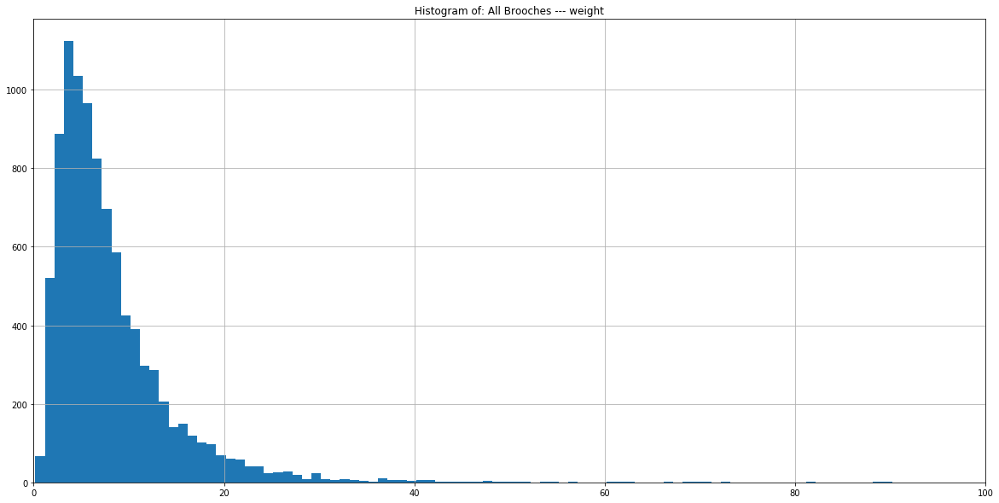

[ 66. 521. 888. ...   0.   0.   1.]


In [138]:
stat = 'weight'
to_test = 'All Brooches'
test_me = b_stats[stat]
fig, ax = plt.subplots(figsize=(20, 10))
binwidth = 1
n, bins, patches = plt.hist(test_me, bins=np.arange(min(test_me), max(test_me) + binwidth, binwidth))
plt.xlim(xmin=0, xmax = 100)
plt.grid(True)
plt.title('Histogram of: ' + str(to_test) + ' --- ' + str(stat))
VAL = 18
#ax.plot((31,31),(0,VAL), color='yellow')
#ax.plot((18.5,18.5),(0,VAL), color='red')
#ax.plot((37,37),(0,VAL), color='red')
#ax.plot((55.5,55.5),(0,VAL), color='red')
#ax.plot((24.6,24.6),(0,VAL), color='black')
#ax.plot((49.2,49.2),(0,VAL), color='black')
#ax.plot((73.8,73.8),(0,VAL), color='blue')
plt.show()
print(n)

In [103]:
DIMENSION_BUCKETS = []
for i in range(0,150):
    tmp = [[i,i+0.9999], [i,i+0.9999],{}]
    for j in range(-600,451):
        tmp[2][j]=0
    DIMENSION_BUCKETS.append(tmp)
#CALC_SIG_EVAL_MAP(['colchester','c'])


In [104]:
def match_brooch_to_plot_dims(lat, lon):
    found = 0
    for i in range(len(DIMENSION_BUCKETS)):
        if found == 0:
            plot = DIMENSION_BUCKETS[i]
            if (plot[0][0] <= lat <= plot[0][1]) and (plot[1][0] <= lon <= plot[1][1]):
                # execute
                found = 1
                #print(i)
                return(i)
        else:
            break
    return "ERROR"

def update_plot_dims(index, brooch_n1, brooch_n2):
    value = 1/(abs(brooch_n2 - brooch_n1)+1)
    value_given = 0
    plot = DIMENSION_BUCKETS[index]
    years = plot[2]
    if brooch_n1 < (-600):
        start = (-600)
    else:
        start = brooch_n1
    if brooch_n2 > 450:
        end = 450
    else:
        end = brooch_n2
        
    for i in range(start, (end + 1)):
        years[i]+=value
        value_given+=value

    plot[2] = years
    DIMENSION_BUCKETS[index] = plot
    
def evaluate_brooch_dims(lat, lon, n1, n2):
    index = match_brooch_to_plot_dims(lat, lon)
    if index != "ERROR":
        update_plot_dims(index, n1, n2)
        return 0
    else:
        return 1

In [105]:
# measure size changes over time using expected values
def CALC_SIZE_EVAL_TIMELINE(clist, metric, dset):
    tracker = 0
    ERRORS = 0
    for row in dset:
        # KEY ROW -----------
        if row['classifiedas'] in clist:
        #if True:
            #print("hey")
        # -------------------
            #lat = row['fourFigureLat']
            #lon = row['fourFigureLon']
            val = row[str(metric)]
            n1 = int(row['numdate1'])
            n2 = int(row['numdate2'])
            ERRORS+=evaluate_brooch_dims(val, val, n1, n2)
            tracker +=1
            #print(tracker)
    outfile = open('EVals_' + str(metric) +'_'+ str(clist[0]) +'_etc_.csv', 'w')
    #outfile=open('EVals_AllBrooches.csv', 'w')
    writer = csv.writer(outfile)
    cols = ['LAT', 'LON','latmin', 'latmax', 'lonmin', 'lonmax','TOTAL',
           '600_101','100_42','43_65','66_90','91_120','121_150',
            '151_180','181_210','211_250','251_300','301_350','351_450']
    for i in range(-600, 451):
        cols.append(i)
    writer.writerow(cols)

    for p in DIMENSION_BUCKETS:
        latmin = p[0][0]
        latmax = p[0][1]
        lonmin = p[1][0]
        lonmax = p[1][1]
        LAT = mean([latmin, latmax])
        LON = mean([lonmin, lonmax])
        YV = p[2]
        yearvals = []
        for i in range(-600, 451):
            add = p[2][i]
            yearvals.append(add)
        
        pcols = [LAT, LON, latmin, latmax, lonmin, lonmax]
        TOTAL = sum(yearvals[0:])
        A = sum(yearvals[0:500])
        B = sum(yearvals[500:643])
        C = sum(yearvals[643:666])
        D = sum(yearvals[666:691])
        E = sum(yearvals[691:721])
        F = sum(yearvals[721:751])
        G = sum(yearvals[751:781])
        H = sum(yearvals[781:811])
        I = sum(yearvals[811:851])
        J = sum(yearvals[851:901])
        K = sum(yearvals[901:951])
        L = sum(yearvals[951:])
        for item in [TOTAL,A,B,C,D,E,F,G,H,I,J,K,L]:
            pcols.append(item)
        for i in range(len(yearvals)):
            pcols.append(yearvals[i])
        #for i in range (-600, 451):
            #pcols.append(yearvals[i])
        writer.writerow(pcols)

    outfile.close()
    return str('EVals_' + str(metric) +'_'+ str(clist[0]) +'_etc_.csv')

In [106]:
def calc_avg(xlist, ylist):
        total = 0
        freq = 0
        for i in range(len(xlist)):
            freq+=ylist[i]
            total+=(xlist[i]*ylist[i])
        try:
            return total/freq, max(ylist)
        except:
            return 0, max(ylist)
    
def make_plots_12(file):
    infile = open(file,'r')
    reader = csv.reader(infile)
    As = []
    Bs = []
    Cs = []
    Ds = []
    Es = []
    Fs = []
    Gs = []
    Hs = []
    Is = []
    Js = []
    Ks = []
    Ls = []
    next(reader)
    for row in reader:
        num = float(row[4])
        As.append(float(row[7]))
        Bs.append(float(row[8]))
        Cs.append(float(row[9]))
        Ds.append(float(row[10]))
        Es.append(float(row[11]))
        Fs.append(float(row[12]))
        Gs.append(float(row[13]))
        Hs.append(float(row[14]))
        Is.append(float(row[15]))
        Js.append(float(row[16]))
        Ks.append(float(row[17]))
        Ls.append(float(row[18]))
    infile.close()

    data = [As,Bs,Cs,Ds,Es,Fs,Gs,Hs,Is,Js,Ks,Ls]
    fig, ((ax1, ax5, ax9), (ax2, ax6, ax10), (ax3, ax7, ax11), (ax4, ax8, ax12)) = plt.subplots(4, 3, sharex='col', figsize=(18,10))
    axes = [ax1,ax2,ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12]
    labels = ['600-101BC', '100BC-42AD', '43-65AD', '66-90AD', '91-120AD', '121-150AD',
             '151-180AD', '210-250AD', '251-300AD', '301-350AD', '351-400AD', '401-450AD']
    order = [[0,0],[1,0],[2,0],[3,0],[0,1],[1,1],[2,1],[3,1], [0,2],[1,2],[2,2],[3,2]]

    xs = []
    for i in range(0,150):
        xs.append(i)


    for i in range(len(order)):

        #d = data[i]
        ys = data[i]
        ax = axes[i]
        ax.plot(xs, ys, color='blue')
        line_x, line_height = calc_avg(xs, ys)
        ax.plot((line_x, line_x),(0,line_height), color='red')
        axes[i].text(145, 0.85*line_height, labels[i],fontsize=10, ha='right')
        axes[i].text(145, 0.65*line_height, str("Avg: " + str(round(line_x,2))),fontsize=10, ha='right')
        VAL = max(ys)
        #ax.plot((18.5,18.5),(0,VAL), color='green')
        #ax.plot((37,37),(0,VAL), color='green')
        #ax.plot((55.5,55.5),(0,VAL), color='green')
        #ax.plot((24.6,24.6),(0,VAL), color='black')
        #ax.plot((49.2,49.2),(0,VAL), color='black')
        #ax.plot((73.8,73.8),(0,VAL), color='blue')
        #histogram([0,1,2,3,4,3,4,5,65,4,5,6,5,1,23,3,4,5,6,4], axes[i])
        #axes[i]
    #for i in range(4):
    #    for j in range(3):
    #        ax[i, j].text(0.5, 0.5, str((i,j)),
    #                      fontsize=8, ha='center')
    #        lbl+=1
    #print(Bs)

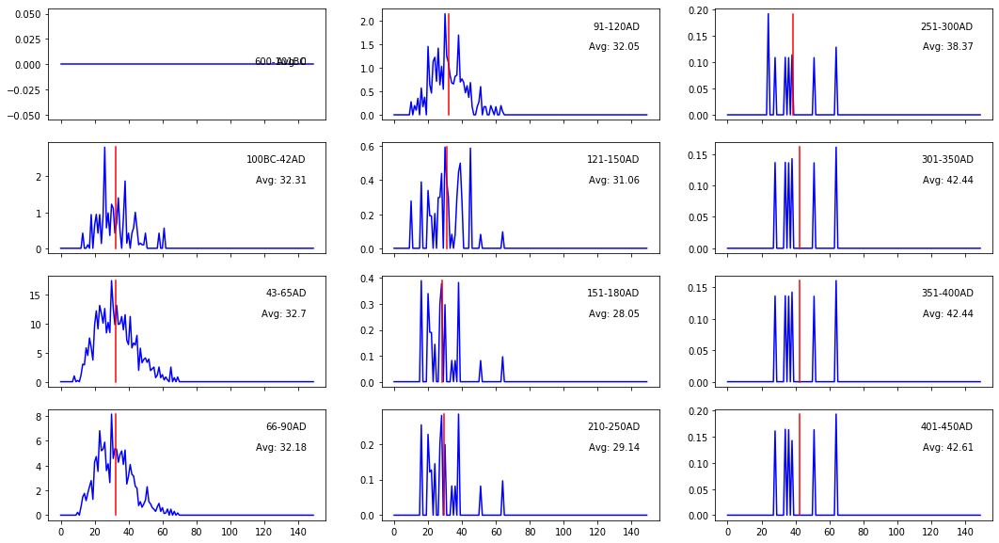

In [187]:
DIMENSION_BUCKETS = []
for i in range(0,150):
    tmp = [[i,i+0.9999], [i,i+0.9999],{}]
    for j in range(-600,451):
        tmp[2][j]=0
    DIMENSION_BUCKETS.append(tmp)
CLIST = ['HH']
dset = UPDATED_BROOCHES
metric = 'length'
file = CALC_SIZE_EVAL_TIMELINE(CLIST, metric, dset)
make_plots_12(file)

In [782]:
i = 0
for row in IPB:
    if row['significance'] == 'IMPORT':
        i+=1
print(i)

131


In [783]:
131/len(IPB)
54.003927, 0.176150
53.379429, -1.235593

0.06869428421604615

In [784]:
# iceni peak bounds 
parisi_lats = [53.379429, 54.003927]
parisi_lons = [-1.235593, 0.176150]
parisi_peak_brooches_allyears = []
for row in UPDATED_BROOCHES:
    if parisi_lats[0] <= row['fourFigureLat'] <= parisi_lats[1]:
        if parisi_lons[0] <= row['fourFigureLon'] <= parisi_lons[1]:
            parisi_peak_brooches_allyears.append(row)
PBS = parisi_peak_brooches_allyears

In [785]:
i = 0
for row in PBS:
    if row['significance'] == 'IMPORT':
        i+=1
print(i)

21


In [788]:
21/len(PBS)

0.01731244847485573

In [789]:
131/len(IPB)

0.06869428421604615

In [816]:
# control for different levels of finder activity by dividing the expected value of a significance
# by the total expected value of the region
i = 0
for row in UPDATED_BROOCHES:
    if row['classifiedas'] == 'fan':
        i+=1
print(i)

204


In [144]:
len(IPB)

1907

In [260]:
i = 0
j = 0
years = {}
for k in range(0,301):
    years[k]=0
for row in IPB:
    if (row['significance']=='DERIVATIVE'):
        j+=1
        if not(('rearhook' in row['description'].lower()) or ('rear hook' in row['description'].lower())):
            i+=1
            value = 1/abs(row['numdate2'] - row['numdate1'])
            if row['numdate1'] < 0:
                start = 0
            else:
                start = row['numdate1']
            if row['numdate2'] > 300:
                end = 300
            else:
                end = row['numdate2']
            for m in range(int(start), int(end)):
                years[m] = years[m] + value
print(i)
print(j)
print(years)
outfile = open('rearhook_dist.csv', 'w')
writer = csv.writer(outfile)
pcols = []
for z in range (0,301):
    pcols.append(z)
writer.writerow(pcols)
vals = []
for z in range (0, 301):
    vals.append(years[z])
writer.writerow(vals)
outfile.close()

434
838
{0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0, 6: 0, 7: 0, 8: 0, 9: 0, 10: 0, 11: 0, 12: 0, 13: 0, 14: 0, 15: 0, 16: 0, 17: 0, 18: 0, 19: 0, 20: 0.08333333333333333, 21: 0.08333333333333333, 22: 0.08333333333333333, 23: 0.08333333333333333, 24: 0.08333333333333333, 25: 0.08333333333333333, 26: 0.08333333333333333, 27: 0.08333333333333333, 28: 0.08333333333333333, 29: 0.08333333333333333, 30: 0.08333333333333333, 31: 0.08333333333333333, 32: 0.08333333333333333, 33: 0.08333333333333333, 34: 0.08333333333333333, 35: 0.08333333333333333, 36: 0.08333333333333333, 37: 0.08333333333333333, 38: 0.08333333333333333, 39: 0.08333333333333333, 40: 0.18833333333333332, 41: 0.18833333333333332, 42: 0.18833333333333332, 43: 7.6410220097767745, 44: 7.6410220097767745, 45: 7.707688676443441, 46: 7.707688676443441, 47: 7.707688676443441, 48: 7.707688676443441, 49: 7.707688676443441, 50: 8.181022009776772, 51: 8.181022009776772, 52: 8.181022009776772, 53: 8.181022009776772, 54: 8.181022009776772, 55: 12.3

In [332]:
rh = 0
regs = collections.Counter()
for index, row in ALL_BROOCHES.iterrows():
    desc = str(row['description']).lower()
    if ('rearhook' in desc) or ('rear hook' in desc):
        rh+=1
        regs[row['region']]+=1
print(regs)

Counter({'Eastern': 858, nan: 153, 'East Midlands': 28, 'South East': 26, 'West Midlands': 6, 'Yorkshire and the Humber': 4, 'South West': 3, 'North West': 1})


In [269]:
total = 0
mappable = 0
outfile = open('full_CD_spread.csv', 'w')
writer = csv.writer(outfile)
writer.writerow(['lat', 'lon'])
for index,row in ALL_BROOCHES.iterrows():
    new_row = row
    new_row['classifiedas'] = classify(new_row)
    new_row = re_classify(new_row)
    if new_row['classifiedas'] in ['cd', 'd']:
        total+=1
        if (not np.isnan(new_row['fourFigureLat'])) and (not np.isnan(new_row['fourFigureLon'])):
            mappable+=1
            writer.writerow([str(new_row['fourFigureLat']), str(new_row['fourFigureLon'])])
outfile.close()

In [267]:
len(ALL_BROOCHES)

33122

In [268]:
len(TEMPORAL_BROOCHES)

14450

In [270]:
print(total)

4891


In [271]:
print(mappable)

1765


In [291]:
i =0
reg = collections.Counter()
for index, row in ALL_BROOCHES.iterrows():
    reg[row['region']]+=1
    #if row['classifiedas'] in ['cd', 'd']:
    #    i+=1
    #    reg[row['region']]+=1
print(i)
print(reg)

0
Counter({'Eastern': 7830, 'East Midlands': 6552, 'South East': 4772, 'South West': 4646, 'Yorkshire and the Humber': 3764, 'West Midlands': 3093, nan: 1137, 'North West': 628, 'Wales': 401, 'North East': 225, 'London': 74})


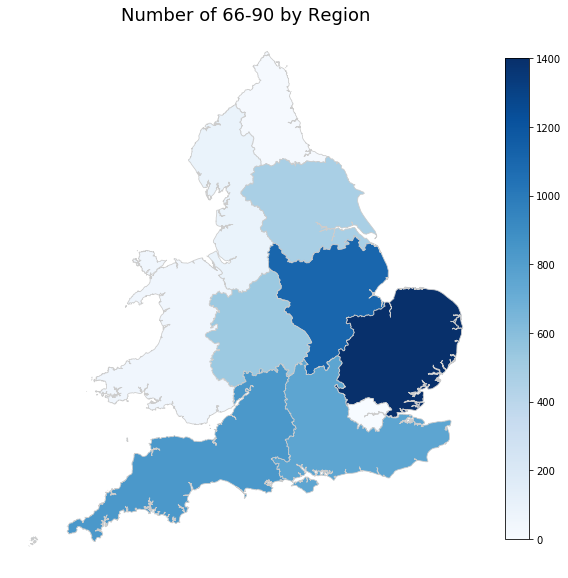

In [159]:
for variable in ['66-90']:
    # set the range for the choropleth
    vmin, vmax = 0, 1400
    # create figure and axes for Matplotlib
    fig, ax = plt.subplots(1, figsize=(8, 10))
    # create map
    geodf = pd.read_excel(r'manual_choropleth.xlsx')
    merged = map_df.set_index('name').join(geodf.set_index('region'))
    merged.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')
    ax.axis('off')
    ax.set_title("Number of " + str(variable) + ' by Region', fontdict={'fontsize': '18', 'fontweight' : '3'})
    # Create colorbar as a legend
    sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    # empty array for the data range
    sm._A = []
    # add the colorbar to the figure
    #cbar.ax.tick_params(labelsize=12)
    #plt.colorbar(sm, fraction=0.046, pad=0.04, format='%.1f%%')
    plt.colorbar(sm, fraction=0.046, pad=0.04)
    plt.tight_layout()
    #plt.savefig(os.path.join('RegionalVariations', str("Regional_Variation_" + variable + '.png')),format = 'png',bbox_inches='tight')
    plt.savefig('Manual_choropleth_' + str(variable) + '.png', format='png', bbox_inches='tight')
    plt.show()

In [119]:
REGION_DATE_BROOCHES = []
for index,row in ALL_BROOCHES.iterrows():
    if not np.isnan(row['numdate1']):
        if not np.isnan(row['numdate2']):
            if type(row['region'])==type('string'):
                new_row = re_classify(row)
                new_row['significance']=group_by_significance(new_row['classifiedas'])
                REGION_DATE_BROOCHES.append(new_row)

In [108]:
all_regions = TEMPORAL_BROOCHES['region'].unique()

In [120]:
len(REGION_DATE_BROOCHES)

30829

In [109]:
def gather_midlands(region):
    outfile = open('regional_sigdist_' + str(region) + '.csv', 'w')
    writer=csv.writer(outfile)
    keys = ['COLCHESTER', 'DERIVATIVE', 'POLDEN', 'MILITARY', 'IMPORTPROD', 'PROD', 'IMPORT', 'BOWS', 'PLATE', 'PEN', 'UNKNOWN']
    x = ['sigs']
    for i in range(0, 301):
        x.append(i)
    writer.writerow(x)
    data_stacks = {}
    for k in keys:
        tmp = {}
        for i in range(0,301):
            tmp[i]=0
        data_stacks[k]=tmp
    for row in REGION_DATE_BROOCHES:
        if row['region'] == region:
            value = 1/(abs(row['numdate2'] - row['numdate1'])+1)
            if row['numdate1'] < 0:
                start = 0
            else:
                start = int(row['numdate1'])
            if row['numdate2'] > 300:
                end = 300
            else:
                end = int(row['numdate2'])
            try:
                data = data_stacks[row['significance']]
                for j in range(start, (end+1)):
                    data[j] = data[j]+value
                data_stacks[row['significance']] = data
            except:
                pass
    #print(data_stacks)
    ss = 0
    for item in data_stacks:
        s = 0
        new_row = [item]
        for lmao in data_stacks[item].keys():
            nxt = data_stacks[item][lmao]
            new_row.append(nxt)
            s+=nxt
        print(s)
        ss+=s
        writer.writerow(new_row)
    print('---')
    print(ss)
    outfile.close()

In [411]:
for reg in all_regions:
    gather_midlands(reg)

841.6987327998688
2596.7750747718496
197.8043478260875
694.1305945241248
134.56331601555698
113.74387951018394
446.24115865582905
1121.793773025875
920.0834256243869
38.18451650776929
110.68353706067259
---
7215.702356322205
221.90466147523296
468.6870093333924
472.1253610478728
368.5574949023087
161.3320417886873
76.48921268645063
76.67105263157879
1882.4299862745568
555.3046149087953
22.646949380153142
24.676616323540337
---
4330.825000752569
94.12381553198053
243.1016684457806
21.4021739130434
261.7190735930517
32.85602481566413
9.569351529747586
37.27970906961657
2011.3306210074165
627.9457175018829
60.07162426534366
25.663431349231775
---
3425.06321102276
0
0
0
0
0
0
0
0
0
0
0
---
0
660.4501383266121
486.49479172311953
173.18994232773028
491.8225162098252
240.74681836193272
23.91081407507212
243.2059085584551
993.7485791789456
807.4436811394194
18.06206154397542
61.534732396787724
---
4200.609983841876
236.9701316347993
213.16092084336174
1171.436155048615
60.645506870026665
19.79

In [410]:
c = collections.Counter()
for row in UPDATED_BROOCHES:
    c[row['significance']]+=1
print(c)

Counter({'BOWS': 4784, 'DERIVATIVE': 2274, 'PLATE': 1927, 'POLDEN': 1608, 'COLCHESTER': 1215, 'MILITARY': 1108, 'IMPORTPROD': 524, 'IMPORT': 446, 'UNKNOWN': 211, 'PROD': 186, 'PEN': 164, None: 3})


In [139]:
def misc_bows_unpack(region):
    subset = []
    unique_classes = []
    outfile = open(str(region)+'_miscbows.csv', 'w')
    writer = csv.writer(outfile)
    for row in REGION_DATE_BROOCHES:
        if row['region'] == region:
            if row['significance'] == 'BOWS':
                subset.append(row)
                if row['classifiedas'] in unique_classes:
                    pass
                else:
                    unique_classes.append(row['classifiedas'])
    print(len(subset))
    vals = {}
    for i in range(len(unique_classes)):
        vals[unique_classes[i]] = []
        for j in range(0, 301):
            vals[unique_classes[i]].append(0)
    for row in subset:
        value = 1/(abs(row['numdate2'] - row['numdate1'])+1)
        if row['numdate1'] < 0:
            start = 0
        else:
            start = int(row['numdate1'])
        if row['numdate2'] > 300:
            end = 300
        else:
            end = int(row['numdate2'])
        try:
            data = vals[row['classifiedas']]
            for k in range(start, (end+1)):
                data[k] = data[k]+value
            vals[row['classifiedas']] = data
        except:
            pass
    tmp = ['class']
    for i in range(0,301):
        tmp.append(i)
    writer.writerow(tmp)
    
    print(region)
    for i in range(len(unique_classes)):
        output = [unique_classes[i]]
        for item in vals[unique_classes[i]]:
            output.append(item)
        v66_90 = 0
        for j in range(66,91):
            v66_90+=vals[unique_classes[i]][j]
        v91_120 = 0
        for j in range(91,121):
            v91_120+=vals[unique_classes[i]][j]
        print(str(unique_classes[i]) + ',' + str(v66_90) + ',' + str(v91_120))
        writer.writerow(output)
    
 
    outfile.close()
        
            

In [140]:
for reg in all_regions:
    misc_bows_unpack(reg)

1188
Eastern
bow,51.43666976516768,34.18535741451854
ts,46.15863355011279,53.85272072619656
lion,0.5547740835464622,0.09999999999999999
hawkeshull,0,0
hingehead,2.2380688668786926,4.631793640255177
t,34.869800113570065,63.77204966615916
fan,16.68323009008877,12.650098306963601
h,23.91525518280009,44.762631241078296
hook,1.9142595193999647,0.5987631184407787
saw,1.6053415997104434,2.37339378432488
wir,0,0.20792079207920797
fib,6.348893158276774,3.818529446243289
wrox,0.280497651203758,0.3732384028185554
1910
South West
ts,229.8579067381756,265.23137338273796
bow,59.8549247325081,53.28353171547175
hingehead,2.8263291439909226,1.7917544379308248
fib,0.27856826661607526,0.23904382470119506
t,60.317948249870774,110.5635148443295
h,15.067299325590414,26.741959329020233
hook,3.388393492829456,1.2633637598041068
wir,0.9995170248732195,1.1881188118811885
saw,1.1837183718371833,1.7051705170517044
wrox,0.9406654951209404,1.6741479342739465
fan,3.1618606878537423,3.2770278929523817
theal,0,0.20792

In [136]:
all_regions

array(['Eastern', 'South West', 'Yorkshire and the Humber', nan,
       'South East', 'West Midlands', 'East Midlands', 'London',
       'North West', 'North East', 'Wales'], dtype=object)

In [141]:
len(Roman_data)

334855

In [143]:
lats = []
lons = []
outfile = open('hoardlocs.csv', 'w')
writer = csv.writer(outfile)
for index, row in Roman_data.iterrows():
    if 'hoard' in row['objecttype'].lower():
        lat = (row['fourFigureLat'])
        lon =(row['fourFigureLon'])
        if (not np.isnan(lat)) and (not np.isnan(lon)):
            writer.writerow([lat, lon])
outfile.close()


In [160]:
reg = collections.Counter()
for index, row in ALL_BROOCHES.iterrows():
    reg[row['region']]+=1
print(reg)

Counter({'Eastern': 7830, 'East Midlands': 6552, 'South East': 4772, 'South West': 4646, 'Yorkshire and the Humber': 3764, 'West Midlands': 3093, nan: 1137, 'North West': 628, 'Wales': 401, 'North East': 225, 'London': 74})


In [182]:
tmp = collections.Counter()
tmpdict = {'t':0,'ts':0,'bow':0,'h':0,'fan':0}
maxdict = {'t':0,'ts':0,'bow':0,'h':0,'fan':0}
keys = tmpdict.keys()
loops = ['head loop', 'headloop', 'suspension loop', 'chain loop', 'integrally cast loop', 'integral loop', 
        'integral top loop', 'integral head loop', 'attachment loop', 'top loop', 'loop surmounts the top',
        'connecting chain', 'cast loop', 'loop projects from head', 'chain', 'head-loop', 'loop is located at the top of the head',
        'loop is located above', 'upper loop', 'loop on the head', 'loop on the top', 'loop at the head',
        'loop at the top', 'loop from the top', 'circular loop']
for row in REGION_DATE_BROOCHES:
    if row['significance'] == 'BOWS':
        c = row['classifiedas']
        tmp[c]+=1
        if c in keys:
            description = str(row['description']).lower()
            gurgle = 0
            if 'loop' in description:
                maxdict[c]+=1
            for item in loops:
                if item in description:
                    gurgle = 1
                else:
                    pass
            if gurgle == 1:
                tmpdict[c]+=1
            #if (gurgle == 0) and (c=='h') and ('loop' in description):
                #print(row['thumbnail'])
                #print(row['description'])
                #if c=='fan':
                    #print(description)
print(tmp)
print("Lower Bounds: ----------")
print(tmpdict)
print('------------------------')
print("Upper Bounds: ----------")
print(maxdict)
print('------------------------')
        

Counter({'t': 3008, 'ts': 2697, 'bow': 1760, 'h': 1596, 'fan': 494, 'fib': 119, 'wir': 93, 'hingehead': 71, 'theal': 65, 'saw': 53, 'hook': 40, 'wrox': 33, 'lion': 17, 'hawkeshull': 12, 'alcester': 10, 'trumpet': 3})
Lower Bounds: ----------
{'t': 999, 'ts': 472, 'bow': 174, 'h': 757, 'fan': 151}
------------------------
Upper Bounds: ----------
{'t': 1428, 'ts': 644, 'bow': 215, 'h': 875, 'fan': 176}
------------------------


In [187]:
def headloop_check(desc):
    loops = ['head loop', 'headloop', 'suspension loop', 'chain loop', 'integrally cast loop', 'integral loop', 
        'integral top loop', 'integral head loop', 'attachment loop', 'top loop', 'loop surmounts the top',
        'connecting chain', 'cast loop', 'loop projects from head', 'chain', 'head-loop', 'loop is located at the top of the head',
        'loop is located above', 'upper loop', 'loop on the head', 'loop on the top', 'loop at the head',
        'loop at the top', 'loop from the top', 'circular loop']
    for item in loops:
        if item in str(desc).lower():
            return 1
    return 0

In [194]:
def calc_headloops(mode, match):
    upper = 0
    lower = 0
    total = 0
    for row in REGION_DATE_BROOCHES:
        if row[str(mode)] == str(match):
            total+=1
            if 'loop' in str(row['description']):
                upper+=1
                lower+=headloop_check(row['description'])
    output = str(match) + ":  Between " + str(lower) + " (" + str(100*lower/total) + ") " + "and "+ str(upper) + " (" + str(100*upper/total) + ") out of a total " + str(total)
    print(output)

In [197]:
# Colchester 71-207 (2.8 - 8.4%) / 2477 total
# Derivative 110-235 (2.1 - 4.4%) / 5288 total
for c in tmp.keys():
    calc_headloops('classifiedas', c)

ts:  Between 468 (17.352614015572858) and 644 (23.878383388950684) out of a total 2697
bow:  Between 171 (9.715909090909092) and 213 (12.102272727272727) out of a total 1760
hawkeshull:  Between 1 (8.333333333333334) and 2 (16.666666666666668) out of a total 12
lion:  Between 0 (0.0) and 0 (0.0) out of a total 17
hingehead:  Between 7 (9.859154929577464) and 11 (15.492957746478874) out of a total 71
hook:  Between 2 (5.0) and 4 (10.0) out of a total 40
t:  Between 996 (33.111702127659576) and 1427 (47.44015957446808) out of a total 3008
fib:  Between 1 (0.8403361344537815) and 5 (4.201680672268908) out of a total 119
h:  Between 753 (47.18045112781955) and 872 (54.636591478696744) out of a total 1596
fan:  Between 150 (30.364372469635626) and 176 (35.62753036437247) out of a total 494
trumpet:  Between 1 (33.333333333333336) and 1 (33.333333333333336) out of a total 3
wir:  Between 72 (77.41935483870968) and 77 (82.79569892473118) out of a total 93
theal:  Between 57 (87.6923076923077)

In [210]:
def CALC_SIG_EVAL_MAP2(sig):
    tracker = 0
    ERRORS = 0
    for row in UPDATED_BROOCHES:
        # KEY ROW -----------
        if row['significance'] == sig:
            #print("hey")
        # -------------------
            lat = row['fourFigureLat']
            lon = row['fourFigureLon']
            n1 = int(row['numdate1'])
            n2 = int(row['numdate2'])
            ERRORS+=evaluate_brooch(lat, lon, n1, n2)
            tracker +=1
            #print(tracker)
    outfile = open('EVals2_' + str(sig) + '.csv', 'w')
    #outfile=open('EVals_AllBrooches.csv', 'w')
    writer = csv.writer(outfile)
    cols = ['LAT', 'LON','latmin', 'latmax', 'lonmin', 'lonmax','PLOT_ALLTIME_EV','RATIO','SIG_TOTAL',
           '600_101','100_42','43_65','66_90','91_120','121_150',
            '151_180','181_210','211_250','251_300','301_350','351_450',
           'R600_101','R100_42','R43_65','R66_90','R91_120','R121_150',
            'R151_180','R181_210','R211_250','R251_300','R301_350','R351_450']
    for i in range(-600, 451):
        cols.append(i)
    writer.writerow(cols)
    #for p in PLOT_OBJECTS:
        #print(p[2][45])

    #for p in PLOT_OBJECTS:
    for track in range(len(PLOT_OBJECTS)):
        p = PLOT_OBJECTS[track]
        latmin = p[0][0]
        latmax = p[0][1]
        lonmin = p[1][0]
        lonmax = p[1][1]
        LAT = mean([latmin, latmax])
        LON = mean([lonmin, lonmax])
        YV = p[2]
        yearvals = []
        for i in range(-600, 451):
            add = p[2][i]
            yearvals.append(add)
        
        pcols = [LAT, LON, latmin, latmax, lonmin, lonmax, TOTAL_EVS[track],0]
        TOTAL = sum(yearvals[0:])
        A = sum(yearvals[0:500])
        B = sum(yearvals[500:643])
        C = sum(yearvals[643:666])
        D = sum(yearvals[666:691])
        E = sum(yearvals[691:721])
        F = sum(yearvals[721:751])
        G = sum(yearvals[751:781])
        H = sum(yearvals[781:811])
        I = sum(yearvals[811:851])
        J = sum(yearvals[851:901])
        K = sum(yearvals[901:951])
        L = sum(yearvals[951:])
        for item in [TOTAL,A,B,C,D,E,F,G,H,I,J,K,L]:
            pcols.append(item)
        if TOTAL_EVS[track] == 0:
            pcols[7] = 0
        else:
            pcols[7] = (TOTAL/TOTAL_EVS[track])
        for item in [A,B,C,D,E,F,G,H,I,J,K,L]:
            if TOTAL_EVS[track] == 0:
                pcols.append(0)
            else:
                pcols.append(item/TOTAL_EVS[track])
        for i in range(len(yearvals)):
            pcols.append(yearvals[i])
        #for i in range (-600, 451):
            #pcols.append(yearvals[i])
        writer.writerow(pcols)

    outfile.close()

In [213]:
UPDATED_BROOCHES[0]

id                                                                    964389
old_findID                                                       NARC-9CF605
uniqueID                                                   PAS5D39CF600014E8
objecttype                                                            BROOCH
classification                                          Colchester one Piece
subclass                                                                 NaN
length                                                                 42.24
height                                                                   NaN
width                                                                  15.42
weight                                                                   4.2
thickness                                                               5.72
diameter                                                                 NaN
quantity                                                                   1

In [217]:
asd = collections.Counter()
for row in UPDATED_BROOCHES:
    asd[row['significance']]+=1
print(asd)

Counter({'BOWS': 4784, 'DERIVATIVE': 2274, 'PLATE': 1927, 'POLDEN': 1608, 'COLCHESTER': 1215, 'MILITARY': 1108, 'IMPORTPROD': 524, 'IMPORT': 446, 'UNKNOWN': 211, 'PROD': 186, 'PEN': 164, None: 3})


In [220]:
CALC_SIG_EVAL_MAP2('BOWS')

In [222]:
print(all_regions)

['Eastern' 'South West' 'Yorkshire and the Humber' nan 'South East'
 'West Midlands' 'East Midlands' 'London' 'North West' 'North East'
 'Wales']


In [205]:
i = 0
for row in UPDATED_BROOCHES:
    if headloop_check(str(row['description']))==1:
        i+=1
print(i)

1678


In [228]:
def fuckthis():
    outfile = open('fuckingheadloops.csv', 'w')
    writer=csv.writer(outfile)
    row = ['region']
    for i in range(0,451):
        row.append(i)
    writer.writerow(row)
    regvals = {}
    for r in all_regions:
        regvals[r] = []
        for i in range(0, 451):
            regvals[r].append(0)
    
    for row in REGION_DATE_BROOCHES:
        if headloop_check(row['description']) == 1:
            region = row['region']
            n1 = row['numdate1']
            n2 = row['numdate2']
            try:
                val = 1/abs(n2-n1)
            except:
                val=0
            if n1 < 0:
                start = 0
            else:
                start = int(n1)
            if n2 > 450:
                end = 450
            else:
                end = int(n2)
            for loc in range(start, (end+1)):
                regvals[region][loc]+=val
    
    for REG in all_regions:
        outrow = [REG]
        for v in regvals[REG]:
            outrow.append(v)
        writer.writerow(outrow)
    outfile.close()
        

In [229]:
fuckthis()

In [230]:
for row in UPDATED_BROOCHES:
    row['headloop'] = headloop_check(row['description'].lower())

AttributeError: 'float' object has no attribute 'lower'

In [231]:
UPDATED_BROOCHES[0]

id                                                                    964389
old_findID                                                       NARC-9CF605
uniqueID                                                   PAS5D39CF600014E8
objecttype                                                            BROOCH
classification                                          Colchester one Piece
subclass                                                                 NaN
length                                                                 42.24
height                                                                   NaN
width                                                                  15.42
weight                                                                   4.2
thickness                                                               5.72
diameter                                                                 NaN
quantity                                                                   1

In [129]:
def sigh():
    outfile = open('groupedfuckme.csv', 'w')
    writer=csv.writer(outfile)
    tmp = []
    for i in range(0,451):
        tmp.append(i)
    writer.writerow(tmp)
    bowvals = []
    platevals = []
    for i in range(0, 451):
        bowvals.append(0)
        platevals.append(0)
    for row in REGION_DATE_BROOCHES:
        n1 = row['numdate1']
        n2 = row['numdate2']
        try:
            val = 1/abs(n2-n1)
        except:
            val = 0
        if n1 < 0:
            start = 0
        else:
            start = int(n1)
        if n2 > 450:
            end = 450
        else:
            end = int(n2)
        if row['significance'] not in ['PLATE', 'IMPORTPROD', 'PROD', 'PEN']:
            for j in range(start, (end+1)):
                bowvals[j]+=val
        elif row['significance'] == 'PLATE':
            for j in range(start, (end+1)):
                platevals[j]+=val
    writer.writerow(bowvals)
    writer.writerow(platevals)
    outfile.close()
    
        

In [130]:
sigh()

In [161]:
w = 0
outfile = open('coinlocs_wmats-mints.csv', 'w')
writer = csv.writer(outfile)
writer.writerow(['LAT', 'LON', 'MAT'])
for index, row in COINS.iterrows():
    lat = row['fourFigureLat']
    lon = row['fourFigureLon']
    mat = str(row['primaryMaterial']).lower()
    mint = str(row['mintName']).lower()
    if (not np.isnan(lat)) and (not np.isnan(lon)):
        writer.writerow([lat, lon, mat, mint])
    if row['region'] == 'Wales':
        w+=1
outfile.close()
print(w)

53342


In [160]:
W = 0
other = collections.Counter()
silver_mints = collections.Counter()
copper_mints = collections.Counter()
quantities = collections.Counter()
for index, row in COINS.iterrows():
    if row['region'] == 'Wales':
        W+=1
        mint = row['mintName']
        mat = str(row['primaryMaterial']).lower()
        if (mat == 'silver') or (mat == 'base silver'):
            silver_mints[mint]+=1
        elif (mat == 'copper') or (mat == 'copper alloy'):
            copper_mints[mint]+=1
        else:
            other[mint]+=1
        quantities[str(row['quantity'])]+=1
    #elif row['region'] == 'Eastern':
       #E+=1
print(W)
print("SILVER:    ")
print(silver_mints)
print("-----")
print("COPPER:    ")
print(copper_mints)
print("-----")
print(other)
print(quantities)
#print(E)

53342
SILVER:    
Counter({'Rome': 2553, 'Uncertain': 1229, nan: 83, 'Lugdunum': 53, 'Moving with Republican issuer': 41, 'Antioch (Antakya, Turkey)': 35, 'Trier': 29, 'Mediolanum': 12, 'Spain': 8, 'African Mint': 6, 'Siscia': 4, 'Italian mint': 4, 'Eastern mint': 2, 'Gallic mint': 2, 'Viminacium': 1, 'Arelatum': 1, 'Tarragona': 1})
-----
COPPER:    
Counter({'Uncertain': 24589, 'Gallic mint': 8076, 'Trier': 4466, 'Londinium': 3547, 'Lugdunum': 2609, 'Rome': 2431, 'Arelatum': 755, 'C mint (Uncertain, England)': 572, 'Ticinum': 537, nan: 378, 'Siscia': 353, 'Mediolanum': 268, 'Aquileia': 120, 'Thessalonica': 75, 'Ambianum': 39, 'Cyzicus': 30, 'Carthage': 28, 'Constantinople': 23, 'Antioch (Antakya, Turkey)': 16, 'Ostia': 16, 'Nicomedia': 13, 'Alexandria, Egypt': 12, 'Serdica': 11, 'Perinthus/Heraclea': 8, 'Unattributed': 5, 'Sirmium': 4, 'Mint I, Gaul (Uncertain, France or Germany)': 3, 'Eastern mint': 2, 'Sicilian mint': 2})
-----
Counter({'Uncertain': 210, nan: 45, 'Rome': 18, 'Trier'

In [141]:
EM = 0
EMother = collections.Counter()
EMsilver_mints = collections.Counter()
EMcopper_mints = collections.Counter()
for index, row in COINS.iterrows():
    if row['region'] == 'East Midlands':
        mint = row['mintName']
        mat = str(row['primaryMaterial']).lower()
        EM+=1
        if (mat == 'silver') or (mat == 'base silver'):
            EMsilver_mints[mint]+=1
        elif (mat == 'copper') or (mat == 'copper alloy'):
            EMcopper_mints[mint]+=1
        else:
            EMother[mint]+=1
print(EM)
print("SILVER:    ")
print(EMsilver_mints)
print("-----")
print("COPPER:    ")
print(EMcopper_mints)
print("-----")
print(EMother)

34341
SILVER:    
Counter({nan: 1807, 'Rome': 1320, 'Lugdunum': 93, 'Trier': 75, 'Mediolanum': 54, 'Arelatum': 53, 'Moving with Republican issuer': 30, 'Gallic mint': 30, 'Eastern mint': 13, 'Spain': 12, 'Antioch (Antakya, Turkey)': 7, 'Londinium': 7, 'Unattributed': 6, 'Verulamium': 5, 'Aquileia': 5, 'Italian mint': 5, 'Constantinople': 5, 'Colchester': 4, 'African Mint': 4, 'Sirmium': 2, 'Nicomedia': 2, 'Siscia': 2, 'Mint II, Gaul (Uncertain, France or Germany)': 2, 'Calleva': 1, 'Viminacium': 1, 'Mint I, Gaul (Uncertain, France or Germany)': 1, 'Tarragona': 1, 'Ticinum': 1, 'C mint (Uncertain, England)': 1, 'Thessalonica': 1, 'Carthage': 1, 'Sicilian mint': 1})
-----
COPPER:    
Counter({nan: 21359, 'Trier': 2982, 'Rome': 1551, 'Arelatum': 1024, 'Lugdunum': 1014, 'Londinium': 776, 'Mint I, Gaul (Uncertain, France or Germany)': 180, 'Siscia': 158, 'C mint (Uncertain, England)': 152, 'Gallic mint': 136, 'Aquileia': 116, 'Constantinople': 86, 'Mint II, Gaul (Uncertain, France or German

In [159]:
ALL_REGIONS = COINS['region'].unique()
def metal(word):
    x = str(word).lower()
    if (x == 'silver') or (x=='base silver'):
        return 'silver'
    elif (x== 'copper') or (x=='copper alloy'):
        return 'copper'
    else:
        return 'other'
def minthelper():
    output = {}
    for reg in ALL_REGIONS:
        output[reg] = {'copper':0, 'silver':0, 'other':0}
    return output

outfile = open('regional_coinmints.csv', 'w')
writer=csv.writer(outfile)
frow = ['mint']
srow = ['mint']
total_mints = {}

for item in ALL_REGIONS:
    frow.append(str(item))
    frow.append(str(item))
    frow.append(str(item))
    srow.append('copper')
    srow.append('silver')
    srow.append('other')

writer.writerow(frow)
writer.writerow(srow)

for index, row in COINS.iterrows():
    region = str(row['region'])
    mat = metal(str(row['primaryMaterial']))
    mint = str(row['mintName'])
    if mint not in total_mints.keys():
        total_mints[mint] = minthelper()
    else:
        try:
            total_mints[mint][region][mat]+=1
        except:
            pass
    
    #if mint not in total_mints:
    #    total_mints.append(mint)
    #try:
    #    regional_collections[metal(mat)][mint]+=1
    #except:
    #    try:
     #       if mint not in regional_collections[metal(mat)].keys():
     #           regional_collections[metal(mat)][mint]=1
     #   except:
     #       pass
#print(regional_collections)
#print(total_mints)
for MINT in total_mints:
    outrow = [MINT]
    test = []
    for region in total_mints[MINT].keys():
        temp = total_mints[MINT][region]
        c = temp['copper']
        s = temp['silver']
        o = temp['other']
        outrow.append(c)
        outrow.append(s)
        outrow.append(o)
        test.append(region)
    print(test)
    writer.writerow(outrow)
    
outfile.close()

['South East', 'South West', 'Eastern', nan, 'Yorkshire and the Humber', 'East Midlands', 'West Midlands', 'London', 'North West', 'Wales', 'North East']
['South East', 'South West', 'Eastern', nan, 'Yorkshire and the Humber', 'East Midlands', 'West Midlands', 'London', 'North West', 'Wales', 'North East']
['South East', 'South West', 'Eastern', nan, 'Yorkshire and the Humber', 'East Midlands', 'West Midlands', 'London', 'North West', 'Wales', 'North East']
['South East', 'South West', 'Eastern', nan, 'Yorkshire and the Humber', 'East Midlands', 'West Midlands', 'London', 'North West', 'Wales', 'North East']
['South East', 'South West', 'Eastern', nan, 'Yorkshire and the Humber', 'East Midlands', 'West Midlands', 'London', 'North West', 'Wales', 'North East']
['South East', 'South West', 'Eastern', nan, 'Yorkshire and the Humber', 'East Midlands', 'West Midlands', 'London', 'North West', 'Wales', 'North East']
['South East', 'South West', 'Eastern', nan, 'Yorkshire and the Humber', 'Ea

In [ ]:

for MINT in total_mints:
    MINT=str(MINT)
    outrow = [MINT]
    for reg in ALL_REGIONS:
        x = regional_collections[reg]
        try:
            silver = x['silver'][MINT]
        except:
            silver = 0
        try:
            copper = x['copper'][MINT]
        except:
            copper = 0
        try:
            other = x['other'][MINT]
        except:
            other = 0
        outrow.append(copper)
        outrow.append(silver)
        outrow.append(other)
        outrow.append(reg)
        writer.writerow(outrow)
        
outfile.close()

In [162]:
len(COINS)

302915

In [164]:
i = 0
car = 0
tot = 0
for index, row in COINS.iterrows():
    n1 = row['numdate1']
    n2 = row['numdate2']
    if abs(n2-n1) <= 25:
        i+=1
        if 285 <= (n1+n2)/2 <= 295:
            tot+=1
            desc = str(row['description']).lower()
            if ('carausius' in desc) or ('caruasius' in desc):
                car+=1
print(i)
print(tot)
print(car)

209483
8185
4309


In [165]:
#4309 carausius between 285-295
# 4 carausius between 295-305
regs = collections.Counter()
for index, row in COINS.iterrows():
    regs[str(row['region'])]+=1
print(regs.most_common)

<bound method Counter.most_common of Counter({'Eastern': 76548, 'Wales': 53342, 'South East': 51943, 'South West': 35137, 'East Midlands': 34341, 'Yorkshire and the Humber': 20772, 'nan': 16477, 'West Midlands': 9034, 'North West': 2146, 'North East': 1948, 'London': 1227})>


In [21]:
SILVER_COINS = []
for index, row in COINS.iterrows():
    mat = row['primaryMaterial']
    if (mat=='Silver') or (mat=='Base Silver'):
        SILVER_COINS.append(row)

In [27]:
COPPER_COINS = []
for index, row in COINS.iterrows():
    mat = row['primaryMaterial']
    if (mat=='Copper') or (mat=='Copper alloy'):
        COPPER_COINS.append(row)

In [28]:
len(SILVER_COINS)

35710

In [61]:
import statistics

In [22]:
def quick_coin_EV_Weight(dataset, outfile):
    out = open(outfile, 'w')
    writer=csv.writer(out)
    yearvals = []
    title_row = []
    for i in range(0,451):
        yearvals.append(0)
        #year_weights[i] = []
        title_row.append(i)
    writer.writerow(title_row)
    for row in dataset:
        n1 = row['numdate1']
        n2 = row['numdate2']
        val = 1/(abs(n2-n1)+1)
        weight = row['weight']
        quantity = row['quantity']
        if (np.isnan(quantity)) or (quantity < 1):
            quantity = 1
        
        if (not np.isnan(weight)):
            UNIT_MASS = weight*val*quantity

            if (not np.isnan(n1)) and (not np.isnan(n2)):
                if n1 < 0:
                    start = 0
                else:
                    start = int(n1)
                if n2 > 450:
                    end = 450
                else:
                    end = int(n2)
                for i in range(start, (end+1)):
                    yearvals[i]+=UNIT_MASS
            
    #yearly_weight_avgs = []
    #print(year_weights[70])
    #for item in year_weights:
    #    yearly_weight_avgs.append(statistics.mean(year_weights[item]))
    writer.writerow(yearvals)
    #writer.writerow(yearly_weight_avgs)
    out.close()

In [85]:
quick_coin_EV_Weight(COPPER_COINS, 'copper_evs5.csv')

In [79]:
print(len(COINS))
print(len(COPPER_COINS))
print(len(SILVER_COINS))

302915
244627
35710


In [89]:
35710/302915

0.11788785632933331

In [87]:
quants = collections.Counter()
for row in COPPER_COINS:
    quants[str(row['quantity'])]+=1
    
    if str(row['quantity'])=='700.0':
        print(row['id'])
        print(row['description'])
        print(row['weight'])
    
print(quants)
print(238970/244627)

393033
<p>The bulk of the hoard is fused in a lump which may have assumed the shape of a purse in which the coins were originally concealed. At the time of discovery, there was reported to be a layer of darkish earth which might have been the remains of decayed leather. The weight of this lump is 1,150gm, which would suggest that it consists of approximately 600 coins. In addition, 62 coins have become separated from the lump at some stage; some of these are now single, and some remain in small (2-13 coins) fused groups. This might suggest that the size of the hoard is closer to 700, although the weight of corrosion products needs to be taken into account. All the coins that can be identified or part-identified appear to be Constantinian issues of the period, c. AD 320-340; whilst some are quite badly corroded, many seem to have been relatively fresh when deposited.</p>

<p>Summary of the loose coins:</p>

<p>Types of AD 321-4: DOMINORVM NOSTRORVM CAESS VOT V 1 BEATA TRANQVILLITAS VOTI

In [92]:
(2195+1014+665+404+238970)/244627

0.9943628462925188

In [125]:
ranges = {}
years = {}
wales_years = {}

for row in SILVER_COINS:
    n1 = row['numdate1']
    n2 = row['numdate2']
    rng = abs(n2 - n1)
    region = row['region']
    coin_classifications[row['classification']]+=1
    if rng <= 25:
        midpoint = int((n2 + n1)/2)
    else:
        midpoint = "N/A"
    ruler = row['primaryRuler']
    if midpoint not in years:
        years[midpoint]={}
    if ruler in years[midpoint]:
        years[midpoint][ruler]+=1
    else:
        years[midpoint][ruler]=1
    if str(rng) not in ranges:
        ranges[str(rng)]=1
    else:
        ranges[str(rng)]+=1
    if region=='Wales':
        if midpoint not in wales_years:
            wales_years[midpoint]={}
        if ruler in wales_years[midpoint]:
            wales_years[midpoint][ruler]+=1
        else:
            wales_years[midpoint][ruler]=1
        

In [140]:
def find_denoms(year):
    denoms = {}
    for row in SILVER_COINS:
        n1 = row['numdate1']
        n2 = row['numdate2']
        rng = abs(n2 - n1)
        ruler = row['primaryRuler']
        mint = row['mintName']
        denomination = row['denomination']
        midpoint = "N/A"
        if rng <= 25:
            midpoint = int((n2 + n1)/2)
            
        if midpoint not in denoms:
            denoms[midpoint] = {}
            
        if ruler not in denoms[midpoint]:
            denoms[midpoint][ruler] = {}
            
        if denomination not in denoms[midpoint][ruler]:
            denoms[midpoint][ruler][denomination]=collections.Counter()
        
        denoms[midpoint][ruler][denomination][mint]+=1
        
    for item in denoms[year]:
        print(str(item) +','+str(denoms[year][item]))
        

In [145]:
find_denoms(289)

Carausius,{'Denarius (Empire)': Counter({'Londinium': 21, nan: 12, 'Unattributed': 5, 'Uncertain': 2}), 'Radiate (antoninianus)': Counter({nan: 54, 'Londinium': 21, 'Unattributed': 4, 'C mint (Uncertain, England)': 1}), 'Uncertain': Counter({'Londinium': 2, nan: 1}), 'Argenteus': Counter({nan: 1})}
nan,{nan: Counter({nan: 1}), 'Radiate (antoninianus)': Counter({nan: 1}), 'Uncertain': Counter({nan: 1})}
Claudius II,{'Radiate (antoninianus)': Counter({'Rome': 1})}


In [108]:
tot = 0
ugh = 0
fine = 0
for item in ranges:
    if (float(item)) <= 25:
        tot+=ranges[item]
    elif (float(item)) <= 50:
        ugh+=ranges[item]
    else:
        fine+=ranges[item]
print(tot)
print(ugh)
print(fine)

17113
1632
16965


In [122]:
print(years[257])

{'Valerian I': 15, 'Salonina (joint reign)': 3, 'Gallienus (Joint reign)': 10, 'Valerian II': 10, nan: 1, 'Saloninus': 41, 'Salonina (joint or sole reign)': 1, 'Salonina (sole reign of Gallienus)': 2}


In [81]:
rulers = collections.Counter()
years = {}
for index, row in COINS.iterrows():
    n1 = row['numdate1']
    n2 = row['numdate2']
    mat = row['primaryMaterial']
    if (abs(n2-n1) <= 25) and ((mat=='Silver') or (mat=='Base Silver')):
        midpoint = int((n2 + n1)/2)
        ruler = row['primaryRuler']
        rulers[ruler]+=1
        if midpoint not in years:
            years[midpoint]={}
        if ruler in years[midpoint]:
            years[midpoint][ruler]+=1
        else:
            years[midpoint][ruler]=1
#print(rulers)

In [84]:
print(years[228])

{'Severus Alexander': 184, 'Julia Mamaea': 158, 'Julia Maesa': 1, nan: 1, 'Septimius Severus': 1}


In [82]:
midpoint_sums = {}
for index, row in COINS.iterrows():
    n1 = row['numdate1']
    n2 = row['numdate2']
    if (abs(n2-n1) <= 25) and ((mat=='Silver') or (mat=='Base Silver')):
        midpoint = int((n2 + n1)/2)
        if midpoint in midpoint_sums:
            midpoint_sums[midpoint]+=1
        else:
            midpoint_sums[midpoint]=1
print(midpoint_sums)
    

{-70: 59, -55: 173, 31: 87, -37: 57, -50: 81, 52: 36, -35: 32, -87: 27, -52: 50, -22: 29, -117: 6, -77: 6, 15: 45, -65: 9, -40: 108, 41: 25, -45: 32, 30: 49, -42: 107, 22: 31, 43: 12, 2: 8, -9: 6, 37: 39, -2: 4, 110: 91, -107: 22, -30: 39, -34: 4, 50: 21, -15: 44, -10: 6, -110: 22, 20: 23, -60: 16, -17: 47, 8: 49, -20: 39, 27: 21, 35: 22, 0: 15, -12: 25, -47: 26, -33: 3, 117: 27, 5: 15, 10: 6, -32: 55, -7: 10, -14: 22, -112: 30, -51: 16, -63: 3, 39: 50, 40: 14, -62: 46, 46: 11, -56: 9, 42: 13, -95: 17, -57: 19, 36: 34, -105: 2, 25: 211, 49: 10, 13: 20, -132: 1, -187: 7, -137: 4, 45: 94, -90: 25, -8: 11, -25: 10, -61: 20, -162: 1, 55: 20, 29: 1, -27: 15, -80: 5, 100: 53, -82: 23, 6: 13, -38: 6, -11: 2, -190: 1, 32: 7, -3: 13, 34: 3, -26: 1, -13: 5, -67: 20, -5: 24, -31: 446, 17: 18, 62: 5, -100: 8, -210: 2, -296: 1, -49: 12, -44: 7, 3: 39, -310: 1, -4: 1, 51: 24, -19: 9, 7: 1, 332: 16759, 270: 5308, 264: 5701, 272: 7110, 280: 11177, 289: 4170, 371: 18393, 325: 406, 311: 668, 344: 586, 2

In [59]:
print(TEMPORAL_BROOCHES['numdate1'])

26         25.0
28         25.0
30         25.0
31         25.0
32       -400.0
39         25.0
40       -100.0
62         25.0
94         25.0
96         20.0
99         30.0
100      -400.0
102      -350.0
104        25.0
105        20.0
106        25.0
107        25.0
108       -50.0
124        20.0
130        25.0
138      -400.0
139        45.0
141         0.0
143        20.0
153        25.0
156        40.0
176        20.0
185      -100.0
194         0.0
208        20.0
          ...  
331353    100.0
331535    100.0
331585    100.0
331751    150.0
332021     75.0
332037     43.0
332040     43.0
332104     43.0
332140     25.0
332196     43.0
332211     50.0
332285    100.0
332286     43.0
332305    100.0
332306     43.0
332636     43.0
332745    100.0
332943    150.0
332944     80.0
333021     75.0
333035     43.0
333048    100.0
333837     43.0
333901     43.0
333911     43.0
333921     43.0
334321     43.0
334324     43.0
334394     43.0
334845     43.0
Name: numdate1, Length: 

In [60]:
regional_find_dates = collections.Counter()
for row in ALL_BROOCHES_V2:
    year = str(row['datefound1'])[0:4]
    regional_find_dates[year]+=1
print(regional_find_dates.most_common)
#for reg in ALL_REGIONS:
#    regional_find_dates

<bound method Counter.most_common of Counter({'nan': 7461, '2009': 1769, '2006': 1500, '2013': 1491, '2010': 1479, '2008': 1437, '2011': 1397, '2007': 1376, '2015': 1359, '2014': 1356, '2005': 1295, '2012': 1282, '2016': 1247, '2004': 1236, '2017': 1123, '2003': 938, 'NaT': 838, '2018': 830, '2000': 644, '1999': 619, '2002': 605, '2001': 525, '1998': 373, '2019': 190, '1990': 127, '1997': 93, '1980': 67, '1988': 55, '1996': 54, '1991': 43, '1985': 40, '1986': 38, '1995': 37, '1994': 31, '1987': 30, '1993': 28, '1970': 27, '1992': 24, '1989': 23, '1982': 7, '1984': 5, '1983': 5, '1960': 4, '1950': 3, '1981': 2, '1978': 2, '1979': 2, '1976': 1, '1903': 1, '0213': 1, '1788': 1, '2027': 1})>


In [60]:
temp_fdbrooches=pd.read_excel('ALL_BROOCHES_CLEANED.xlsx')

In [61]:
temp_fdbrooches.head()

,Unnamed: 0,id,old_findID,uniqueID,objecttype,classification,subclass,length,height,width,...,calc_thickness,calc_numdate1,calc_numdate2,calc_dateBucket,calc_fourFigureLat,calc_fourFigureLat_zoom,calc_fourFigureLon,calc_fourFigureLon_zoom,calc_broadDateBucket,classifiedas
0,9,966029,SOM-C31BB1,PAS5D4C31BB001091,BROOCH,Colchester two piece,NaN,72.90,NaN,22.40,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,colchester
1,10,966002,NLM-C2181B,PAS5D4C2181001B86,PENANNULAR BROOCH,Fowler Type A3,Mackreth type PEN k3.a,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fowler
2,11,965892,SOM-BEBE89,PAS5D4BEBE80019D0,BROOCH,Colchester one piece,NaN,41.00,NaN,10.90,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,colchester
3,12,965887,SOM-BE68EB,PAS5D4BE68E001C01,BROOCH,La T√®ne I,NaN,48.10,NaN,4.90,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,lateneI
4,26,964389,NARC-9CF605,PAS5D39CF600014E8,BROOCH,Colchester one Piece,NaN,42.24,NaN,15.42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,colchester


In [62]:
groupsigs = []
for index, row in temp_fdbrooches.iterrows():
    groupsigs.append(group_by_significance((re_classify(row))['classifiedas']))
print(groupsigs[0:10])

['COLCHESTER', None, 'COLCHESTER', 'IMPORTPROD', 'COLCHESTER', 'COLCHESTER', 'COLCHESTER', 'COLCHESTER', 'IMPORTPROD', 'IMPORTPROD']


In [63]:
len(groupsigs)

33122

In [64]:
temp_fdbrooches['significance']=groupsigs

In [65]:
temp_fdbrooches.to_excel("all_brooches_with_groupsigs.xlsx")

In [66]:
method_disc = collections.Counter()
for index, row in temp_fdbrooches.iterrows():
    method_disc[row['discmethod']]+=1
print(method_disc)

Counter({'Metal detector': 32543, 'Other chance find': 242, 'Chance find during metal detecting': 91, nan: 67, 'Unknown': 55, 'Metal detector during controlled archaeological investigation': 31, 'Fieldwalking': 20, 'Gardening': 18, 'Controlled archaeological investigation (unstratified)': 15, 'Controlled archaeological investigation (stratified)': 13, 'Controlled archaeological investigation': 10, 'Agricultural or drainage work': 7, 'Building work': 7, 'Controlled archaeological investigation (topsoil stripping)': 3})


In [70]:
coins_method_disc = collections.Counter()
wales_cmdisc = collections.Counter()
wales_identifier =collections.Counter()
for index, row in Roman_data.iterrows():
    if row['objecttype'] == 'COIN':
        coins_method_disc[row['discmethod']]+=1
    if row['region'] == 'Wales':
        wales_cmdisc[row['discmethod']]+=1
        wales_identifier[row['identifier']]+=1
        
print(coins_method_disc)

Counter({'Metal detector': 205917, 'Unknown': 52814, 'Other chance find': 1142, 'Metal detector during controlled archaeological investigation': 856, 'Gardening': 330, 'Chance find during metal detecting': 264, 'Fieldwalking': 201, 'Agricultural or drainage work': 137, 'Controlled archaeological investigation (stratified)': 65, 'Controlled archaeological investigation': 60, 'Building work': 59, 'Controlled archaeological investigation (unstratified)': 35, 'Controlled archaeological investigation (topsoil stripping)': 5})


In [71]:
print(wales_cmdisc)
print(wales_identifier)

Counter({'Unknown': 52597, 'Metal detector': 1336, 'Chance find during metal detecting': 30, 'Other chance find': 24, nan: 24, 'Fieldwalking': 12, 'Building work': 10, 'Gardening': 5, 'Controlled archaeological investigation': 2, 'Metal detector during controlled archaeological investigation': 2, 'Controlled archaeological investigation (stratified)': 1})
Counter({'Dr Peter Guest': 52600, 'Mr Mark Lodwick': 277, 'Mr Edward Besly': 243, nan: 174, 'Ms Simone Johnson': 111, 'Mr Rod Trevaskus': 77, 'Ms Vanessa Oakden': 76, 'Mr Nick Herepath': 66, 'Mr Peter Reavill': 65, ' Nina Steele': 57, 'Dr Susie White': 40, 'Mr Roland Flook': 40, 'Mr Jeff Spencer': 35, 'Miss Frances McIntosh': 29, ' Edward Besly': 13, 'Mr Kurt Adams': 11, ' Karina Kucharski': 10, 'Mr Mark Walters': 9, 'Mr Evan Chapman': 8, 'Ms Angie Bolton': 7, 'Ms Sarah Pevely': 6, 'Ms Sian Williams': 5, 'Mr Sean Derby': 4, 'Ms Jenna Smith': 4, 'Mr Spencer Smith': 4, 'Dr Eleanor Ghey': 4, 'Dr Sam Moorhead': 4, 'Mr Paul Wood': 4, 'Mrs 

In [93]:
len(COINS)

302915

In [116]:
i = 0
j = 0
late_copper_rulers = collections.Counter()
for row in COPPER_COINS:
    if row['numdate1'] >= 260:
        late_copper_rulers[str(row['primaryRuler'])]+=1
    text = (str(row['classification'])+' ||| '+ str(row['description']) + ' ||| ' + str(row['denomination'])).lower()
    #if (('nummus' in text) or ('nummi' in text)) and ('silver' in text):
    if ('antoninianus' in text): #('silver' in text):
    #if 'antoninianus' in text:
        i+=1
        if j <5 :
            print(text)
            j+=1
print(i)

nan ||| <p>a copper-alloy roman radiate of quintillus (ad 270), dating to the period ad 270 (reece period 14). pax avgvsti reverse type depicting pax standing left holding branch and transverse sceptre. mint of rome. cf. cunetio 2318.                                        </p> ||| radiate (antoninianus)
nan ||| <p>a damaged copper alloy roman radiate of gallienus (sole reign), dating to the period ad 260-8 (reece period 13). [dianae cons avg] reverse type, depicting a gazelle (b) walking right. mint of rome. c.f. cunetio.1415.                        </p> ||| radiate (antoninianus)
nan ||| <p>a contemporary or barbarous copy of a roman radiate of tetricus ii (ad 271-274). possibly a [spes avgg] reverse depicting spes, left holding flower and skirt. uncertain mint.</p> ||| radiate (antoninianus)
nan ||| <p>a heavily clipped contemporary or barbarous copy of a roman radiate of uncertain ruler. uncertain reverse type depicting a standing figure. uncertain mint.</p> ||| radiate (antoninian

In [111]:
late_copper_rulers.most_common

<bound method Counter.most_common of Counter({'House of Constantine': 36261, 'Constantine I': 16585, 'nan': 12561, 'House of Valentinian': 11600, 'Radiate (Barbarous)': 8344, 'Uncertain (AD 260 - 402)': 7966, 'Constantius II': 6846, 'Constantine II': 6582, 'Tetricus I': 6497, 'House of Theodosius': 5320, 'Uncertain - 4th century': 5206, 'Claudius II': 5041, 'Constans': 4885, 'Victorinus': 4725, 'Carausius': 4226, 'Valens': 4220, 'Gratian': 3357, 'Gallienus (sole reign)': 3324, 'Uncertain - 3rd century': 3145, 'Radiate (uncertain emperor)': 3054, 'Crispus': 2899, 'Tetricus II': 2805, 'Magnentius': 2778, 'Allectus': 2426, 'Valentinian I': 2377, 'Arcadius': 2175, 'Licinius I': 2087, 'Nummus, uncertain ruler, c. 330-402': 2053, 'Probus': 1772, 'Postumus': 1584, 'Radiate, Uncertain Ruler 260-296': 1550, 'Helena': 1514, 'Theodora': 1242, 'Tacitus': 834, 'Divus Claudius (Barbarous Radiate)': 828, 'Theodosius I': 825, 'Maximian I': 816, 'Diocletian': 807, 'Valentinian II': 709, 'Radiate (uncer

In [95]:
coin_hoards = []
for index, row in Roman_data.iterrows():
    if row['objecttype'].upper() == 'COIN HOARD':
        coin_hoards.append(row)

In [96]:
len(coin_hoards)

448

In [99]:
i = 0
for row in coin_hoards:
    desc = row['description'].lower()
    if 'argent'in desc:
        i+=1
        print(desc)
print(i)
    

<p>four base silver radiates fused together in a pile. given this feature they clearly entered the ground in a similar position and, since they are of base silver, they furnish a case of treasure. the only legible portions are provided by the face visible at each end of the pile, an obverse of postumus from his principal mint and another of gallienus from the gallic mint operating in the late 250s (with a gallienvs.p.f.avg legend, radiate and cuirassed bust right). both coins are in sharp condition with little wear and the loss or deposition most probably occurred in the 260s.</p>

<p>three more fused coins from the same area found in september 2014 probably represent more coins from the same hoard and push the date of deposition later into the mid-270s or beyond. these are argentiferous copper alloy radiates of the later gallic emperor, one of tetricus ii (ad273-4) and the other of tetricus i (the laetitia avgg/n reverse is visible). the central coin, of course, is not visible. hoards

In [121]:
rulers=collections.Counter()
for row in SILVER_COINS:
    ruler = row['primaryRuler']
    n1 = row['numdate1']
    n2 = row['numdate2']
    #200 n1 215 230 n2 240
    if (200 <= n1) and (n2 <= 240):
        rulers[ruler]+=1
print(rulers.most_common)

<bound method Counter.most_common of Counter({'Severus Alexander': 582, 'Elagabalus': 365, 'Caracalla': 277, 'Septimius Severus': 250, 'Julia Mamaea': 180, 'Geta': 168, 'Julia Maesa': 126, 'Maximinus': 67, 'Plautilla': 49, 'Julia Soaemias': 45, 'Gordian III': 43, 'Julia Domna': 40, nan: 37, 'Julia Paula': 23, 'Macrinus': 14, 'Orbiana': 9, 'Diadumenian': 7, 'Balbinus': 2, 'Hadrian': 2, 'Uncertain - 1st-mid 3rd century': 2, 'Salonina (sole reign of Gallienus)': 2, 'Uncertain - 3rd century': 2, 'Uncertain - 1st/2nd Century AD': 1, 'Julia Aquilia Severa': 1, 'Antoninus Pius': 1, 'Postumus': 1, 'Pupienus': 1, 'Gordian I': 1, 'Republic': 1, 'Uncertain': 1, 'Severan (uncertain)': 1})>


In [23]:
# temporarily making this work with mints -- switch back line 12 later
def silver_rulers_go():
    outfile = open('silver_MINTS.csv', 'w')
    writer=csv.writer(outfile)
    title_row = []
    for i in range(0,451):
        title_row.append(i)
    writer.writerow(title_row)

    silver_rulers = {}
    for row in SILVER_COINS:
        r = str(row['mintName'])
        if r in silver_rulers.keys():
            pass
        else:
            silver_rulers[r]=[]
            for i in range(0, 451):
                silver_rulers[r].append(0)
            
    #print(silver_rulers['Diocletian'])
    for row in SILVER_COINS:
        ruler = str(row['mintName'])
        nummoot1 = row['numdate1']
        nummoot2 = row['numdate2']
        # fix error in PAS data...smh...surprised this hasn't been found
        if row['primaryRuler']=="Salonina (sole reign of Gallienus)":
            if (nummoot1 == 253.0) and (nummoot2 == 260.0):
                nummoot1 = 260.0
                nummoot2 = 268.0
                
        valoot = 1/(abs(nummoot2-nummoot1)+1)
        weight = row['weight']
        
        if (not np.isnan(weight)):
            UNIT_MASSoot = weight*valoot

            if (not np.isnan(nummoot1)) and (not np.isnan(nummoot2)):
                if nummoot1 < 0:
                    start = 0
                else:
                    start = int(nummoot1)
                if nummoot2 > 450:
                    end = 450
                else:
                    end = int(nummoot2)
                    
                temp = silver_rulers[ruler]
            
                for i in range(start, (end+1)):
                    temp[i]+=UNIT_MASSoot
                silver_rulers[ruler]=temp
            #silver_rulers[ruler][i]+=UNIT_MASS
                    
   
    for item in silver_rulers.keys():
        #print(item)
        data = silver_rulers[item]
        data.append(item)
        writer.writerow(data)
    outfile.close()


In [24]:
silver_rulers_go()

In [173]:
ds = collections.Counter()
for row in SILVER_COINS:
    if row['primaryRuler']=="Salonina (sole reign of Gallienus)":
        ds[str((row['numdate1'], row['numdate2']))]+=1
print(ds)
    

Counter({'(253.0, 260.0)': 111, '(260.0, 268.0)': 25, '(253.0, 268.0)': 16, '(253.0, 160.0)': 2, '(257.0, 258.0)': 2, '(43.0, 410.0)': 2, '(260.0, 267.0)': 1, '(257.0, 260.0)': 1, '(259.0, 268.0)': 1, '(255.0, 258.0)': 1})


In [186]:
mints=collections.Counter()
for row in SILVER_COINS:
    ruler = row['primaryRuler']
    if ruler=='Allectus':
        x = str(row['mintName'])
        mints[x]+=1
print(mints)

Counter({'nan': 6, 'C mint (Uncertain, England)': 2, 'Londinium': 2})


In [ ]:
# Postumus
Counter({'nan': 194, 'Gallic mint': 124, 'Lugdunum': 29, 'Cologne': 17, 'Mint I, Gaul (Uncertain, France or Germany)': 7, 'Mediolanum': 6, 'Trier': 1})
# Claudius II
Counter({'nan': 153, 'Rome': 38, 'Mediolanum': 2, 'Cyzicus': 1})
# Victorinus
Counter({'nan': 88, 'Mint I, Gaul (Uncertain, France or Germany)': 11, 'Cologne': 5, 'Mint II, Gaul (Uncertain, France or Germany)': 4, 'Gallic mint': 3})
# Tetricus
Counter({'nan': 109, 'Gallic mint': 12, 'Mint I, Gaul (Uncertain, France or Germany)': 10, 'Mint II, Gaul (Uncertain, France or Germany)': 1})
# Probus
Counter({'nan': 17, 'Rome': 7, 'Lugdunum': 5, 'Ticinum': 1, 'Antioch (Antakya, Turkey)': 1, 'Siscia': 1})
# Carausius
Counter({'nan': 75, 'Londinium': 47, 'Unattributed': 10, 'C mint (Uncertain, England)': 3, 'Uncertain': 2})
# Allectus
Counter({'nan': 6, 'C mint (Uncertain, England)': 2, 'Londinium': 2})


In [11]:
len(mints)

NameError: name 'mints' is not defined